# Proyecto Retail

### Datos

El primer paso en este proyecto será trabajar con las fuentes de datos proporcionadas. En concreto, se nos ha concedido acceso a tres bases de datos fundamentales: "daily_calendar_with_events.csv", "item_prices.csv" y "item_sales.csv".

Nos centraremos en el análisis de las tiendas ubicadas en tres grandes ciudades de los Estados Unidos: Nueva York, Boston y Filadelfia.

Antes de comenzar con el análisis, es crucial realizar una limpieza de los datos de las bases de datos. El objetivo es obtener un dataframe completo, limpio y listo para su uso en el desarrollo del proyecto. Esta etapa es fundamental para asegurarnos de que la información que se utilice en el análisis sea precisa y coherente, lo que nos permitirá obtener resultados significativos y relevantes para DSMarket.

Importamos las librerias necesarias:

In [1]:
import pandas as pd
import numpy as np
from datetime import datetime
import plotly.express as px
#from skimpy import skim
import pickle
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots

#conectar con el API de google Spreadsheet
import gspread #pip install gspread
from gspread_dataframe import set_with_dataframe #pip install gspread_dataframe
from oauth2client.service_account import ServiceAccountCredentials #pip install oauth2client

#Clustering
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

#ML
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import acf
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
from catboost import CatBoostRegressor
from sklearn.model_selection import GridSearchCV

#Errores
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error , mean_absolute_percentage_error
from math import sqrt

#Decomposicion
from statsmodels.tsa.seasonal import seasonal_decompose
from matplotlib import pyplot

#Autocorrelacion
from statsmodels.tsa.stattools import acf
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf

#Procesos estacionarios
from statsmodels.tsa.stattools import adfuller

#Boosting
from sklearn.linear_model import LinearRegression
from catboost import CatBoostRegressor

Para que el dashboard de seguimiento se actualice de forma automatica, actualizaremos los datos mediante un Api, con las credenciales que enviamos en un fichero .JSON

In [4]:
# Credenciales de autenticación
creds = ServiceAccountCredentials.from_json_keyfile_name('masterdatasciencegrupo2-40cd0db466e2.json', ['https://www.googleapis.com/auth/spreadsheets', 'https://www.googleapis.com/auth/drive'])

# Autorizar la API (el JSON de credenciales esta en el repositorio)
client = gspread.authorize(creds)

#la hoja de calculo
# https://docs.google.com/spreadsheets/d/1MWFWHwQBFaef5rsSIa3Qz_wqu6WSqtIG2Eys9mVTni4/edit#gid=0
sheet = client.open_by_key('1MWFWHwQBFaef5rsSIa3Qz_wqu6WSqtIG2Eys9mVTni4')

# Obtener la primera hoja de cálculo
worksheet = sheet.get_worksheet(0)

In [32]:
# Obtener la primera hoja de cálculo
worksheet = sheet.get_worksheet(0)

#limpiar todas las celdas
#worksheet.clear()

#pasar el dataframe al spreadsheet (recordad hacer el resetindex)
set_with_dataframe(worksheet, df_grouped.reset_index())

In [6]:
#Cargamos los datasets

sales =pd.read_csv('data/item_sales.csv')
events=pd.read_csv('data/daily_calendar_with_events.csv', parse_dates=["date"], index_col=["date"])
prices=pd.read_csv('data/item_prices.csv')

In [2]:
#cargar datos ordenador de Tiago
sales =pd.read_csv('../data_dsmarket/item_sales.csv')
events=pd.read_csv('../data_dsmarket/daily_calendar_with_events.csv', parse_dates=["date"], index_col=["date"])
prices=pd.read_csv('../data_dsmarket/item_prices.csv')

 #### Analizamos a grosso modo cada dataset por separado

In [3]:
#definimos una función para automatizar nuestro primer análisis exploratorio.
def eda (df):

    nulls_cols=df.isna().any(axis=0).sum()
    nulls_df=df.isnull().sum().sum()
    
    if nulls_cols==True:
        null_col=df.isnull().any()
        null_perc=round(df[null_col[null_col == True].index[0]].isnull().sum() / len(df) * 100,2)
        print(f'\n-> Porcentaje de nulos en la col: {null_perc}')
     

    dup=df.duplicated().any()
    desc=df.describe()
    info=df.info()
    print(
        f'------------------------------------------\n-> Número de nulos total del dataframe: {nulls_df}\n-> Número de columnas con nulos: {nulls_cols}  \n-> Existen duplicados: {dup}')
    
    if dup:
        num_dup=df[df.duplicated()].shape[0],
        print(f'-> Número de filas duplicadas:  {num_dup}')
        row_dup=df[df.duplicated()]
        df.drop_duplicates(inplace=True)
        print(f'-> ¿Duplicados tras el drop_duplicates?:  {df.duplicated().any()}')
        
    print(f' \n\n-------------------------------------------\n-> Describe: \n{pd.DataFrame(desc)}')  

#### Events

In [5]:
events.head(2)

,weekday,weekday_int,d,event
date,,,,
2011-01-29,Saturday,1,d_1,NaN
2011-01-30,Sunday,2,d_2,NaN


In [6]:
eda(events)


-> Porcentaje de nulos en la col: 98.64
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1913 entries, 2011-01-29 to 2016-04-24
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   weekday      1913 non-null   object
 1   weekday_int  1913 non-null   int64 
 2   d            1913 non-null   object
 3   event        26 non-null     object
dtypes: int64(1), object(3)
memory usage: 74.7+ KB
------------------------------------------
-> Número de nulos total del dataframe: 1887
-> Número de columnas con nulos: 1  
-> Existen duplicados: False
 

-------------------------------------------
-> Describe: 
       weekday_int
count  1913.000000
mean      3.997386
std       2.001175
min       1.000000
25%       2.000000
50%       4.000000
75%       6.000000
max       7.000000


In [7]:
#Los diferentes tipos de eventos que hay en el Dataset
events.event.unique()

array([nan, 'SuperBowl', 'Ramadan starts', 'Thanksgiving', 'NewYear',
       'Easter'], dtype=object)

In [4]:
#rellenamos los eventos null con "None"
events.event=events.event.fillna("None")

In [5]:
#Pasamos el tipo de datos a categorycal menos la ultima columna
events[events.columns[:-1]] = events[events.columns[:-1]].astype('category')

In [11]:
eda(events)

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1913 entries, 2011-01-29 to 2016-04-24
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   weekday      1913 non-null   category
 1   weekday_int  1913 non-null   category
 2   d            1913 non-null   category
 3   event        1913 non-null   object  
dtypes: category(3), object(1)
memory usage: 117.5+ KB
------------------------------------------
-> Número de nulos total del dataframe: 0
-> Número de columnas con nulos: 0  
-> Existen duplicados: False
 

-------------------------------------------
-> Describe: 
         weekday  weekday_int     d event
count       1913         1913  1913  1913
unique         7            7  1913     6
top     Saturday            1   d_1  None
freq         274          274     1  1887


#### Sales

In [12]:
eda(sales)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30490 entries, 0 to 30489
Columns: 1920 entries, id to d_1913
dtypes: int64(1913), object(7)
memory usage: 446.6+ MB
------------------------------------------
-> Número de nulos total del dataframe: 0
-> Número de columnas con nulos: 0  
-> Existen duplicados: False
 

-------------------------------------------
-> Describe: 
                d_1           d_2           d_3           d_4           d_5  \
count  30490.000000  30490.000000  30490.000000  30490.000000  30490.000000   
mean       1.070220      1.041292      0.780026      0.833454      0.627944   
std        5.126689      5.365468      3.667454      4.415141      3.379344   
min        0.000000      0.000000      0.000000      0.000000      0.000000   
25%        0.000000      0.000000      0.000000      0.000000      0.000000   
50%        0.000000      0.000000      0.000000      0.000000      0.000000   
75%        0.000000      0.000000      0.000000      0.000000      0

In [6]:
#Pasamos el dataset de long a wide --> 4min
cols_keep=sales.columns[:7]
cols_wide=sales.columns[7:]

sales_long=pd.melt(sales, value_vars=cols_wide, id_vars=cols_keep, value_name="units_sold_per_day",ignore_index=False)
sales_long=sales_long.rename(columns={"variable":"d"})
sales_long

,id,item,category,department,store,store_code,region,d,units_sold_per_day
0,ACCESORIES_1_001_NYC_1,ACCESORIES_1_001,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,0
1,ACCESORIES_1_002_NYC_1,ACCESORIES_1_002,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,0
2,ACCESORIES_1_003_NYC_1,ACCESORIES_1_003,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,0
3,ACCESORIES_1_004_NYC_1,ACCESORIES_1_004,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,0
4,ACCESORIES_1_005_NYC_1,ACCESORIES_1_005,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,0
...,...,...,...,...,...,...,...,...,...
30485,SUPERMARKET_3_823_PHI_3,SUPERMARKET_3_823,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,d_1913,1
30486,SUPERMARKET_3_824_PHI_3,SUPERMARKET_3_824,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,d_1913,0
30487,SUPERMARKET_3_825_PHI_3,SUPERMARKET_3_825,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,d_1913,0
30488,SUPERMARKET_3_826_PHI_3,SUPERMARKET_3_826,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,d_1913,3


In [9]:
#Convertimos objects a category --> 5min
sales_long[sales_long.columns[:-1]] = sales_long[sales_long.columns[:-1]].astype('category') 

In [21]:
#ver el acumulado por dia y tienda
datos_agrupados = sales_long[['store_code','d','units_sold_per_day']]
datos_agrupados = datos_agrupados.groupby(by=['d','store_code']).sum().sort_values('d').reset_index()
datos_agrupados

,d,store_code,units_sold_per_day
0,d_1,BOS_1,2556
1,d_1,BOS_2,3852
2,d_1,BOS_3,3030
3,d_1,NYC_1,4337
4,d_1,NYC_2,3494
...,...,...,...
19125,d_999,NYC_2,2446
19126,d_999,NYC_3,5270
19127,d_999,NYC_4,1953
19128,d_999,PHI_1,2383


In [22]:
#pintamos las unidades vendidas por dia por tinda
px.line(datos_agrupados,x='d',y='units_sold_per_day',color='store_code')

In [23]:
eda(sales_long) # 2min 30seg

<class 'pandas.core.frame.DataFrame'>
Int64Index: 58327370 entries, 0 to 30489
Data columns (total 9 columns):
 #   Column              Dtype   
---  ------              -----   
 0   id                  category
 1   item                category
 2   category            category
 3   department          category
 4   store               category
 5   store_code          category
 6   region              category
 7   d                   category
 8   units_sold_per_day  int64   
dtypes: category(8), int64(1)
memory usage: 1.5 GB
------------------------------------------
-> Número de nulos total del dataframe: 0
-> Número de columnas con nulos: 0  
-> Existen duplicados: False
 

-------------------------------------------
-> Describe: 
       units_sold_per_day
count        5.832737e+07
mean         1.126322e+00
std          3.873108e+00
min          0.000000e+00
25%          0.000000e+00
50%          0.000000e+00
75%          1.000000e+00
max          7.630000e+02


In [24]:
display(sales_long.head(1), events.head(1))

,id,item,category,department,store,store_code,region,d,units_sold_per_day
0,ACCESORIES_1_001_NYC_1,ACCESORIES_1_001,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,0


,weekday,weekday_int,d,event
date,,,,
2011-01-29,Saturday,1,d_1,None


In [10]:
events=events.reset_index()

In [26]:
#SI LO JUNTAMOS ABAJO, ESTE PASO LO PODEMOS QUITAR !!!!!!
#Juntamos las tablas de events y la tabla de sales
sales_events_df=events.merge(sales_long, on="d", how="inner")
sales_events_df.shape[0]

58327370

#### Prices

In [27]:
prices.head(1)

,item,category,store_code,yearweek,sell_price
0,ACCESORIES_1_001,ACCESORIES,NYC_1,201328.0,12.7414


In [28]:
eda(prices)


-> Porcentaje de nulos en la col: 3.5
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6965706 entries, 0 to 6965705
Data columns (total 5 columns):
 #   Column      Dtype  
---  ------      -----  
 0   item        object 
 1   category    object 
 2   store_code  object 
 3   yearweek    float64
 4   sell_price  float64
dtypes: float64(2), object(3)
memory usage: 265.7+ MB
------------------------------------------
-> Número de nulos total del dataframe: 243920
-> Número de columnas con nulos: 1  
-> Existen duplicados: True
-> Número de filas duplicadas:  (212120,)
-> ¿Duplicados tras el drop_duplicates?:  False
 

-------------------------------------------
-> Describe: 
           yearweek    sell_price
count  6.721786e+06  6.965706e+06
mean   2.013824e+05  5.518273e+00
std    1.450189e+02  4.387861e+00
min    2.011050e+05  1.200000e-02
25%    2.012480e+05  2.620100e+00
50%    2.014100e+05  4.200000e+00
75%    2.015150e+05  7.176000e+00
max    2.016170e+05  1.341500e+02


In [11]:
#cambio el formato de yearweek por string, desechando los decimales del float
prices["yearweek"] = prices["yearweek"].astype(str).str[:-2]
prices.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6965706 entries, 0 to 6965705
Data columns (total 5 columns):
 #   Column      Dtype  
---  ------      -----  
 0   item        object 
 1   category    object 
 2   store_code  object 
 3   yearweek    object 
 4   sell_price  float64
dtypes: float64(1), object(4)
memory usage: 265.7+ MB


El dataset prices tiene un 0.47% de nulos tras la eliminación de duplicados y hemos de atacarlos.

Crearemos un dataset auxiliar en el que generaremos todas las semanas habidas entre el 29/12/2011 y el 24/04/2016 para, posteriormente, unirlo con nuestro dataset de precios y ver las semanas no existentes en el mismo.

In [30]:
events.head(1)

,date,weekday,weekday_int,d,event
0,2011-01-29,Saturday,1,d_1,None


In [12]:
#Creamos la columna yearweek desde el campo date en el dataset de eventos
events["yearweek"]=events["date"].dt.strftime("%Y%W")
display(events.head(1), events.shape)

,date,weekday,weekday_int,d,event,yearweek
0,2011-01-29,Saturday,1,d_1,None,201104


(1913, 6)

In [32]:
#medimos el numero de dias entre la primera y ultima fecha
events["date"].iloc[0]-events["date"].iloc[-1]

Timedelta('-1912 days +00:00:00')

In [13]:
#Juntamos las tablas de events y la tabla de sales
events_sales=sales_long.merge(events, on="d", how="inner")
events_sales.head(1)

,id,item,category,department,store,store_code,region,d,units_sold_per_day,date,weekday,weekday_int,event,yearweek
0,ACCESORIES_1_001_NYC_1,ACCESORIES_1_001,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,0,2011-01-29,Saturday,1,None,201104


In [34]:
events_sales.info(verbose=False)#2.9GB

<class 'pandas.core.frame.DataFrame'>
Int64Index: 58327370 entries, 0 to 58327369
Columns: 14 entries, id to yearweek
dtypes: category(10), datetime64[ns](1), int64(1), object(2)
memory usage: 2.9+ GB


In [14]:
#Reducir espacio en memoria:
events_sales["units_sold_per_day"]=events_sales["units_sold_per_day"].astype("int16")

In [36]:
events_sales.info(verbose=False)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 58327370 entries, 0 to 58327369
Columns: 14 entries, id to yearweek
dtypes: category(10), datetime64[ns](1), int16(1), object(2)
memory usage: 2.6+ GB


In [37]:
display(events_sales.head(1),prices.head(1))

,id,item,category,department,store,store_code,region,d,units_sold_per_day,date,weekday,weekday_int,event,yearweek
0,ACCESORIES_1_001_NYC_1,ACCESORIES_1_001,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,0,2011-01-29,Saturday,1,None,201104


,item,category,store_code,yearweek,sell_price
0,ACCESORIES_1_001,ACCESORIES,NYC_1,201328,12.7414


In [15]:
#de esta tabla cogeremos lo los valores únicos para crear nuestra tabla de referencia --> 1min

df_aux=events_sales[["item","category","store_code","yearweek"]]
df_aux.drop_duplicates(inplace=True)

/var/folders/_c/hk8dlkj51473mmsqx14j1p9w0000gn/T/ipykernel_1891/1495842052.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_aux.drop_duplicates(inplace=True)


In [39]:
display(df_aux.head(),df_aux.shape)

,item,category,store_code,yearweek
0,ACCESORIES_1_001,ACCESORIES,NYC_1,201104
1,ACCESORIES_1_002,ACCESORIES,NYC_1,201104
2,ACCESORIES_1_003,ACCESORIES,NYC_1,201104
3,ACCESORIES_1_004,ACCESORIES,NYC_1,201104
4,ACCESORIES_1_005,ACCESORIES,NYC_1,201104


(8506710, 4)

In [16]:
#Limpiamos el dataset de precios excluyendo los nulos
# recordemos que los nan al pasarse a string y quitar las dos últimas letras, se quedaron como "n"
prices_clean=prices.loc[prices["yearweek"] != "n"]

In [17]:
#semanas que estan a null
prices_nulls=prices.loc[prices["yearweek"] == "n"]

In [57]:
prices_nulls

,item,category,store_code,yearweek,sell_price
149,ACCESORIES_1_001,ACCESORIES,NYC_1,n,11.1454
416,ACCESORIES_1_002,ACCESORIES,NYC_1,n,5.2801
543,ACCESORIES_1_003,ACCESORIES,NYC_1,n,3.9501
825,ACCESORIES_1_004,ACCESORIES,NYC_1,n,6.1712
1096,ACCESORIES_1_005,ACCESORIES,NYC_1,n,3.8304
...,...,...,...,...,...
6964850,SUPERMARKET_3_823,SUPERMARKET,PHI_3,n,3.5760
6965137,SUPERMARKET_3_824,SUPERMARKET,PHI_3,n,2.9760
6965424,SUPERMARKET_3_825,SUPERMARKET,PHI_3,n,4.7760
6965575,SUPERMARKET_3_826,SUPERMARKET,PHI_3,n,1.5360


In [18]:
#juntamos la tabla de precios con la tabla de referencia limpia
price_final=df_aux.merge(prices_clean, on=["item","category","store_code","yearweek"], how="left")


In [43]:
#Hemos garantizado tener todas las semanas en la serie temporal. Rellenaremos los sell_price=Nan
price_final

,item,category,store_code,yearweek,sell_price
0,ACCESORIES_1_001,ACCESORIES,NYC_1,201104,NaN
1,ACCESORIES_1_002,ACCESORIES,NYC_1,201104,NaN
2,ACCESORIES_1_003,ACCESORIES,NYC_1,201104,NaN
3,ACCESORIES_1_004,ACCESORIES,NYC_1,201104,NaN
4,ACCESORIES_1_005,ACCESORIES,NYC_1,201104,NaN
...,...,...,...,...,...
8506705,SUPERMARKET_3_823,SUPERMARKET,PHI_3,201616,3.576
8506706,SUPERMARKET_3_824,SUPERMARKET,PHI_3,201616,2.976
8506707,SUPERMARKET_3_825,SUPERMARKET,PHI_3,201616,4.776
8506708,SUPERMARKET_3_826,SUPERMARKET,PHI_3,201616,1.536


In [44]:
display(prices.head(1),price_final.head(1),sales_long.head(1),prices.head(1))

,item,category,store_code,yearweek,sell_price
0,ACCESORIES_1_001,ACCESORIES,NYC_1,201328,12.7414


,item,category,store_code,yearweek,sell_price
0,ACCESORIES_1_001,ACCESORIES,NYC_1,201104,NaN


,id,item,category,department,store,store_code,region,d,units_sold_per_day
0,ACCESORIES_1_001_NYC_1,ACCESORIES_1_001,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,0


,item,category,store_code,yearweek,sell_price
0,ACCESORIES_1_001,ACCESORIES,NYC_1,201328,12.7414


In [19]:
#Creación de columna id 
price_final["id"]=price_final["item"]+ "_"+ price_final["store_code"]
price_final=price_final[["id","item","category","store_code","yearweek","sell_price"]]
price_final

,id,item,category,store_code,yearweek,sell_price
0,ACCESORIES_1_001_NYC_1,ACCESORIES_1_001,ACCESORIES,NYC_1,201104,NaN
1,ACCESORIES_1_002_NYC_1,ACCESORIES_1_002,ACCESORIES,NYC_1,201104,NaN
2,ACCESORIES_1_003_NYC_1,ACCESORIES_1_003,ACCESORIES,NYC_1,201104,NaN
3,ACCESORIES_1_004_NYC_1,ACCESORIES_1_004,ACCESORIES,NYC_1,201104,NaN
4,ACCESORIES_1_005_NYC_1,ACCESORIES_1_005,ACCESORIES,NYC_1,201104,NaN
...,...,...,...,...,...,...
8506705,SUPERMARKET_3_823_PHI_3,SUPERMARKET_3_823,SUPERMARKET,PHI_3,201616,3.576
8506706,SUPERMARKET_3_824_PHI_3,SUPERMARKET_3_824,SUPERMARKET,PHI_3,201616,2.976
8506707,SUPERMARKET_3_825_PHI_3,SUPERMARKET_3_825,SUPERMARKET,PHI_3,201616,4.776
8506708,SUPERMARKET_3_826_PHI_3,SUPERMARKET_3_826,SUPERMARKET,PHI_3,201616,1.536


In [20]:
price_final_sorted=price_final.sort_values(by=["id","yearweek"]).reset_index(drop="index")

In [47]:
price_final_sorted["yearweek"]

0          201104
1          201105
2          201106
3          201107
4          201108
            ...  
8506705    201612
8506706    201613
8506707    201614
8506708    201615
8506709    201616
Name: yearweek, Length: 8506710, dtype: object

In [48]:
#BORRAR - -> una vez que tengamos el codigo ok, lo quitaria
security_copy_final_sorted=price_final_sorted.copy()

In [21]:
#creamos una columna igual para comparar despues de hacer el fill
price_final_sorted['sell_price_modif']=price_final_sorted['sell_price']

In [22]:
#Rellenar los campos null con el precio de la semana siguiente
price_final_sorted['sell_price_modif'] = price_final_sorted.groupby(["store_code", "item"])["sell_price_modif"].fillna(method='bfill')
price_final_sorted


,id,item,category,store_code,yearweek,sell_price,sell_price_modif
0,ACCESORIES_1_001_BOS_1,ACCESORIES_1_001,ACCESORIES,BOS_1,201104,NaN,12.7414
1,ACCESORIES_1_001_BOS_1,ACCESORIES_1_001,ACCESORIES,BOS_1,201105,NaN,12.7414
2,ACCESORIES_1_001_BOS_1,ACCESORIES_1_001,ACCESORIES,BOS_1,201106,NaN,12.7414
3,ACCESORIES_1_001_BOS_1,ACCESORIES_1_001,ACCESORIES,BOS_1,201107,NaN,12.7414
4,ACCESORIES_1_001_BOS_1,ACCESORIES_1_001,ACCESORIES,BOS_1,201108,NaN,12.7414
...,...,...,...,...,...,...,...
8506705,SUPERMARKET_3_827_PHI_3,SUPERMARKET_3_827,SUPERMARKET,PHI_3,201612,1.2,1.2000
8506706,SUPERMARKET_3_827_PHI_3,SUPERMARKET_3_827,SUPERMARKET,PHI_3,201613,1.2,1.2000
8506707,SUPERMARKET_3_827_PHI_3,SUPERMARKET_3_827,SUPERMARKET,PHI_3,201614,1.2,1.2000
8506708,SUPERMARKET_3_827_PHI_3,SUPERMARKET_3_827,SUPERMARKET,PHI_3,201615,1.2,1.2000


In [66]:
price_final_sorted.isnull().any()

id                  False
item                False
category            False
store_code          False
yearweek            False
sell_price           True
sell_price_modif    False
dtype: bool

In [76]:
#HE CAMBIADO POR UN VALOR DE LA TABLA PRECIOS NULOS, QUE ES DE LOS QUE ESTABAN MAL, Y AÑADI LA COMPARACION
#comprobaciones aleatorias
id=price_final_sorted[price_final_sorted.id=="ACCESORIES_1_005_NYC_1"] 

In [77]:
#pintamos la comparacion
px.line(id,x="yearweek",y=["sell_price_modif","sell_price"])

In [72]:
#cambiado por un dato donde se vea la diferencia en la tabla 
price_final_sorted[(price_final_sorted.id=="ACCESORIES_1_005_NYC_1") & (price_final_sorted.yearweek=="201116")]

,id,item,category,store_code,yearweek,sell_price,sell_price_modif
1162111,ACCESORIES_2_001_NYC_3,ACCESORIES_2_001,ACCESORIES,NYC_3,201227,7.9401,7.9401


In [78]:
display(price_final_sorted.tail(1),sales_events_df.head(1))

,id,item,category,store_code,yearweek,sell_price,sell_price_modif
8506709,SUPERMARKET_3_827_PHI_3,SUPERMARKET_3_827,SUPERMARKET,PHI_3,201616,1.2,1.2


,date,weekday,weekday_int,d,event,id,item,category,department,store,store_code,region,units_sold_per_day
0,2011-01-29,Saturday,1,d_1,None,ACCESORIES_1_001_NYC_1,ACCESORIES_1_001,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,0


In [23]:
#eleminamos la columna que tiene las semanas null
price_final_sorted.drop("sell_price", axis=1, inplace=True)


In [24]:
#renobramos el nombre de la columna
price_final_sorted = price_final_sorted.rename(columns={"sell_price_modif": "sell_price"})


In [27]:
#convertimos en formato fecha --> 9min
events_sales["yearweek"]=events_sales["date"].dt.strftime("%Y%W")#4min 40seg.
events_sales.insert(1,"yearweek",events_sales.pop("yearweek"))

In [28]:
events_sales

,id,yearweek,item,category,department,store,store_code,region,d,units_sold_per_day,date,weekday,weekday_int,event
0,ACCESORIES_1_001_NYC_1,201104,ACCESORIES_1_001,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,0,2011-01-29,Saturday,1,None
1,ACCESORIES_1_002_NYC_1,201104,ACCESORIES_1_002,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,0,2011-01-29,Saturday,1,None
2,ACCESORIES_1_003_NYC_1,201104,ACCESORIES_1_003,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,0,2011-01-29,Saturday,1,None
3,ACCESORIES_1_004_NYC_1,201104,ACCESORIES_1_004,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,0,2011-01-29,Saturday,1,None
4,ACCESORIES_1_005_NYC_1,201104,ACCESORIES_1_005,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,0,2011-01-29,Saturday,1,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58327365,SUPERMARKET_3_823_PHI_3,201616,SUPERMARKET_3_823,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,d_1913,1,2016-04-24,Sunday,2,None
58327366,SUPERMARKET_3_824_PHI_3,201616,SUPERMARKET_3_824,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,d_1913,0,2016-04-24,Sunday,2,None
58327367,SUPERMARKET_3_825_PHI_3,201616,SUPERMARKET_3_825,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,d_1913,0,2016-04-24,Sunday,2,None
58327368,SUPERMARKET_3_826_PHI_3,201616,SUPERMARKET_3_826,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,d_1913,3,2016-04-24,Sunday,2,None


In [29]:
#Hacemos merge con price_final_sorted y sales_events_df -->32min
df_final=events_sales.merge(price_final_sorted, on=["yearweek","id","item","category","store_code"],how="left")
df_final

,id,yearweek,item,category,department,store,store_code,region,d,units_sold_per_day,date,weekday,weekday_int,event,sell_price
0,ACCESORIES_1_001_NYC_1,201104,ACCESORIES_1_001,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,0,2011-01-29,Saturday,1,None,12.7414
1,ACCESORIES_1_002_NYC_1,201104,ACCESORIES_1_002,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,0,2011-01-29,Saturday,1,None,5.2801
2,ACCESORIES_1_003_NYC_1,201104,ACCESORIES_1_003,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,0,2011-01-29,Saturday,1,None,3.9501
3,ACCESORIES_1_004_NYC_1,201104,ACCESORIES_1_004,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,0,2011-01-29,Saturday,1,None,5.7722
4,ACCESORIES_1_005_NYC_1,201104,ACCESORIES_1_005,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_1,0,2011-01-29,Saturday,1,None,3.9634
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58327365,SUPERMARKET_3_823_PHI_3,201616,SUPERMARKET_3_823,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,d_1913,1,2016-04-24,Sunday,2,None,3.5760
58327366,SUPERMARKET_3_824_PHI_3,201616,SUPERMARKET_3_824,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,d_1913,0,2016-04-24,Sunday,2,None,2.9760
58327367,SUPERMARKET_3_825_PHI_3,201616,SUPERMARKET_3_825,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,d_1913,0,2016-04-24,Sunday,2,None,4.7760
58327368,SUPERMARKET_3_826_PHI_3,201616,SUPERMARKET_3_826,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,d_1913,3,2016-04-24,Sunday,2,None,1.5360


In [30]:
#confirmamos si hay nulos-->2min
df_final.isnull().any().any()

False

In [86]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 58327370 entries, 0 to 58327369
Data columns (total 15 columns):
 #   Column              Dtype         
---  ------              -----         
 0   date                datetime64[ns]
 1   yearweek            object        
 2   weekday             category      
 3   weekday_int         category      
 4   d                   category      
 5   event               object        
 6   id                  object        
 7   item                object        
 8   category            object        
 9   department          category      
 10  store               category      
 11  store_code          object        
 12  region              category      
 13  units_sold_per_day  int64         
 14  sell_price          float64       
dtypes: category(6), datetime64[ns](1), float64(1), int64(1), object(6)
memory usage: 4.7+ GB


In [ ]:
#despues de escribir el codigo y ver que funciona las quitaria
copia_seguridad_df_final=df_final.copy()

In [31]:
#Mejorar performance reduciendoel tamaño del dataset -->2min
cols_list = df_final.columns[2:13]
col_types = {col: "category" for col in cols_list}
df_final = df_final.astype(col_types)
df_final["units_sold_per_day"]=df_final["units_sold_per_day"].astype("int16") #valores máximos que puede tomar int16= +-32.767
df_final["sell_price"]=df_final["sell_price"].astype("float32")#valores máximos que puede tomar float32


In [93]:
df_final.info()#Se reduce el uso en memoria de 4.7+ Gb a 2.4+ Gb

<class 'pandas.core.frame.DataFrame'>
Int64Index: 58327370 entries, 0 to 58327369
Data columns (total 15 columns):
 #   Column              Dtype         
---  ------              -----         
 0   date                datetime64[ns]
 1   yearweek            object        
 2   weekday             category      
 3   weekday_int         category      
 4   d                   category      
 5   event               category      
 6   id                  category      
 7   item                category      
 8   category            category      
 9   department          category      
 10  store               category      
 11  store_code          category      
 12  region              category      
 13  units_sold_per_day  int16         
 14  sell_price          float32       
dtypes: category(11), datetime64[ns](1), float32(1), int16(1), object(1)
memory usage: 2.4+ GB


In [8]:
#cogemos los 2 ultimos años
df_dashboard_filtrado = df_final[(df_final['yearweek'] >= '201404')] #cambiar por df_final_read para leear el pikle 
df_dashboard_filtrado['date']= df_dashboard_filtrado['date'].dt.date
df_dashboard_filtrado['income']=round(df_dashboard_filtrado['sell_price']*df_dashboard_filtrado['units_sold_per_day'],2)



/var/folders/_c/hk8dlkj51473mmsqx14j1p9w0000gn/T/ipykernel_4081/1116299757.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_dashboard_filtrado['sell_price']=round(df_dashboard_filtrado['sell_price'],3)


In [31]:
df_dashboard_grouped=df_dashboard_filtrado.groupby(["date","store","category","region","department"], observed=True)['units_sold_per_day','income'].sum()

/var/folders/_c/hk8dlkj51473mmsqx14j1p9w0000gn/T/ipykernel_4081/3988010543.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  df_dashboard_grouped=df_dashboard_filtrado.groupby(["date","store","category","region","department"], observed=True)['units_sold_per_day','income'].sum()


In [32]:
#1min 50seg
# Obtener la hoja de cálculo
worksheet = sheet.get_worksheet(0)

#limpiar todas las celdas
worksheet.clear()

#pasar el dataframe al spreadsheet (max 10M de celdas por llamada)
set_with_dataframe(worksheet, df_dashboard_grouped.reset_index())

In [9]:
df["year"]=df["date"].dt.year
df["month"]=df["date"].dt.month

In [10]:
#Solución para las semanas partidas
df['yearweek_iso'] = df['date'].apply(lambda x: str(x.isocalendar()[0]) + str(x.isocalendar()[1]).zfill(2))

In [11]:
df.insert(2,"yearweek_iso",df.pop("yearweek_iso"))

In [12]:
df['yearmonth'] = df['date'].apply(lambda x: str(x.year) + str(x.month).zfill(2))

In [13]:
df.insert(3,"yearmonth",df.pop("yearmonth"))

In [14]:
df[df["yearweek_iso"]=="201301"] #solucionado el problema de las semanas partidas (semanas 53 y 00)

,id,yearweek,yearweek_iso,yearmonth,item,category,department,store,store_code,region,d,units_sold_per_day,date,weekday,weekday_int,event,sell_price,year,month
21403980,ACCESORIES_1_001_NYC_1,201253,201301,201212,ACCESORIES_1_001,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_703,0,2012-12-31,Monday,3,None,12.7414,2012,12
21403981,ACCESORIES_1_002_NYC_1,201253,201301,201212,ACCESORIES_1_002,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_703,0,2012-12-31,Monday,3,None,5.2801,2012,12
21403982,ACCESORIES_1_003_NYC_1,201253,201301,201212,ACCESORIES_1_003,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_703,0,2012-12-31,Monday,3,None,3.9501,2012,12
21403983,ACCESORIES_1_004_NYC_1,201253,201301,201212,ACCESORIES_1_004,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_703,0,2012-12-31,Monday,3,None,5.7722,2012,12
21403984,ACCESORIES_1_005_NYC_1,201253,201301,201212,ACCESORIES_1_005,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,d_703,0,2012-12-31,Monday,3,None,4.0964,2012,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21617405,SUPERMARKET_3_823_PHI_3,201300,201301,201301,SUPERMARKET_3_823,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,d_709,0,2013-01-06,Sunday,2,None,3.2160,2013,1
21617406,SUPERMARKET_3_824_PHI_3,201300,201301,201301,SUPERMARKET_3_824,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,d_709,0,2013-01-06,Sunday,2,None,3.2160,2013,1
21617407,SUPERMARKET_3_825_PHI_3,201300,201301,201301,SUPERMARKET_3_825,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,d_709,0,2013-01-06,Sunday,2,None,5.2560,2013,1
21617408,SUPERMARKET_3_826_PHI_3,201300,201301,201301,SUPERMARKET_3_826,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,d_709,0,2013-01-06,Sunday,2,None,1.5360,2013,1


In [15]:
df.rename(columns={"units_sold_per_day":"quantities"},inplace=True)

In [16]:
df["income"]=df["quantities"]*df["sell_price"]

In [17]:
df["year"]=df["year"].astype("int16")
df["month"]=df["month"].astype("int16")

In [18]:
# Creamos la columna "date" y la convertimos en el index
df['date'] = pd.to_datetime(df['yearweek'].astype(str) + '1', format='%Y%W%w')
df.set_index('date', inplace=True)

In [39]:
df_dashboard.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 14513240 entries, 2015-01-05 to 2016-04-18
Data columns (total 15 columns):
 #   Column              Dtype   
---  ------              -----   
 0   id                  object  
 1   yearweek            object  
 2   item                category
 3   category            category
 4   department          category
 5   store               category
 6   store_code          category
 7   region              category
 8   d                   category
 9   units_sold_per_day  int16   
 10  weekday             category
 11  weekday_int         category
 12  event               object  
 13  sell_price          float32 
 14  year                int64   
dtypes: category(9), float32(1), int16(1), int64(1), object(3)
memory usage: 789.0+ MB


In [33]:
#Ruta Tiago
ruta='/Users/usuario/Documents/Master/data_dsmarket/df_final_2.pkl' 

In [3]:
#cargar el dataset desde un pikle #2min 30 seg
with open(ruta, 'rb') as f:
    df = pickle.load(f)
    f.close()

In [32]:
#guardar el dataset en un pikle -->20min
with open(ruta, 'wb') as f:
        pickle.dump(df_final, f)
        f.close()

In [4]:
df_original = df.copy()

#### Dataframe Final

Después de un profundo trabajo de las bases de datos "daily_calendar_with_events.csv", "item_prices.csv" y "item_sales.csv", hemos conseguido obtener un dataframe completo y limpio que servirá como base para  este proyecto. Este dataframe final es el resultado de la fusión y transformación de los datos originales, y está listo para ser utilizado en el análisis de la actividad de la empresa en las tiendas de Nueva York, Boston y Filadelfia.

In [4]:
df.head()

,date,yearweek,yearweek_iso,yearmonth,weekday,weekday_int,d,event,id,item,category,department,store,store_code,region,quantities,sell_price,year,month,income
0,2011-01-29,201104,201104,201101,Saturday,1,d_1,None,ACCESORIES_1_001_NYC_1,ACCESORIES_1_001,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,0,12.7414,2011,1,0.0
1,2011-01-29,201104,201104,201101,Saturday,1,d_1,None,ACCESORIES_1_002_NYC_1,ACCESORIES_1_002,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,0,5.2801,2011,1,0.0
2,2011-01-29,201104,201104,201101,Saturday,1,d_1,None,ACCESORIES_1_003_NYC_1,ACCESORIES_1_003,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,0,3.9501,2011,1,0.0
3,2011-01-29,201104,201104,201101,Saturday,1,d_1,None,ACCESORIES_1_004_NYC_1,ACCESORIES_1_004,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,0,5.7722,2011,1,0.0
4,2011-01-29,201104,201104,201101,Saturday,1,d_1,None,ACCESORIES_1_005_NYC_1,ACCESORIES_1_005,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,0,3.9634,2011,1,0.0


## 1. Analisis

En este proyecto, se llevará a cabo un análisis del estado actual de la empresa DSMarket. Se evaluará cada ángulo de actividad, comenzando por el análisis de datos de las tiendas ubicadas en las ciudades de Nueva York, Boston y Filadelfia. El objetivo principal será identificar aquellos productos que ya no son tan populares y aquellos que tienen una mayor demanda en cada ciudad. Es probable que los productos más populares varíen entre ciudades e incluso entre tiendas, lo que permitirá explotar esas diferencias con el equipo de marketing para impulsar la iniciativa de DS con mayor prioridad.

#### Cantidades

Comenzaremos por analizar las cantidades de productos vendidos en las tiendas, sus tendencias y patrones.

#### Top 5 productos más vendidos para cada tienda de cada región en los ultimos 365 días

En este proyecto, nos hemos propuesto analizar en profundidad las ventas de las tiendas de Nueva York, Boston y Filadelfia. Para ello, identificaremos los 5 productos más vendidos en cada tienda y región, lo cual nos permitirá detectar patrones y tendencias en el comportamiento de los clientes de cada zona. 

Es importante destacar la relevancia de identificar estos productos en común, ya que nos permite diseñar estrategias de marketing específicas para ellos, lo cual nos facilita el lanzamiento de campañas de marketing específicas para cada zona, enfocando nuestros esfuerzos en promocionar aquellos productos que tienen mayor aceptación entre los clientes. Además, este conocimiento también puede ser utilizado para optimizar la gestión de inventario y la asignación de recursos en cada tienda de de DSMarket.

In [5]:
df.set_index('date', inplace=True)

In [6]:
# Obtenemos los últimos 365 dias a partir del último dia de nuestro dataframe, apara hacer el analisis

last_date = df.index[-1] 
last_365_days = last_date - pd.Timedelta(days=365) 
df_1Y = df.loc[last_365_days:last_date] 



In [7]:
#Dataset para el Dashboard

dashboard_art=df.loc[last_date - pd.Timedelta(days=730):df.index[-1]].reset_index() 
dashboard_art_final=pd.DataFrame()

for metrica in ['income','quantities']:
    print(metrica)
    dashboard_art = dashboard_art.groupby(['yearmonth','store', 'item'])['income','quantities'].sum().reset_index().sort_values(by=['store', metrica], ascending=[True, False])
    dashboard_art_top = dashboard_art.groupby(['store','yearmonth']).head(5).sort_values(by=['yearmonth', 'store'])
    dashboard_art_top['tipo']='TOP'
    dashboard_art_top['metrica']=metrica
    dashboard_art_flop=dashboard_art.query(F"{metrica} > 0").groupby(['yearmonth','store']).tail(5).sort_values(by=['yearmonth', 'store'])
    dashboard_art_flop['tipo']='FLOP'
    dashboard_art_flop['metrica']=metrica

    dashboard_art_final = pd.concat([dashboard_art_final,dashboard_art_top, dashboard_art_flop], axis=0)
dashboard_art_final= dashboard_art_final[['yearmonth','store', 'item','income','quantities','tipo','metrica']]

income


/var/folders/0z/r6bz6cyx7d5gcwfhghqzmz280000gn/T/ipykernel_1286/1116204540.py:8: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  dashboard_art = dashboard_art.groupby(['yearmonth','store', 'item'])['income','quantities'].sum().reset_index().sort_values(by=['store', metrica], ascending=[True, False])


quantities


/var/folders/0z/r6bz6cyx7d5gcwfhghqzmz280000gn/T/ipykernel_1286/1116204540.py:8: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  dashboard_art = dashboard_art.groupby(['yearmonth','store', 'item'])['income','quantities'].sum().reset_index().sort_values(by=['store', metrica], ascending=[True, False])


In [ ]:
# Obtener la hoja de cálculo
worksheet = sheet.get_worksheet(1)#segunda pestaña

#limpiar todas las celdas
worksheet.clear()

#pasar el dataframe al spreadsheet (max 10M de celdas por llamada)
set_with_dataframe(worksheet, dashboard_art_final)

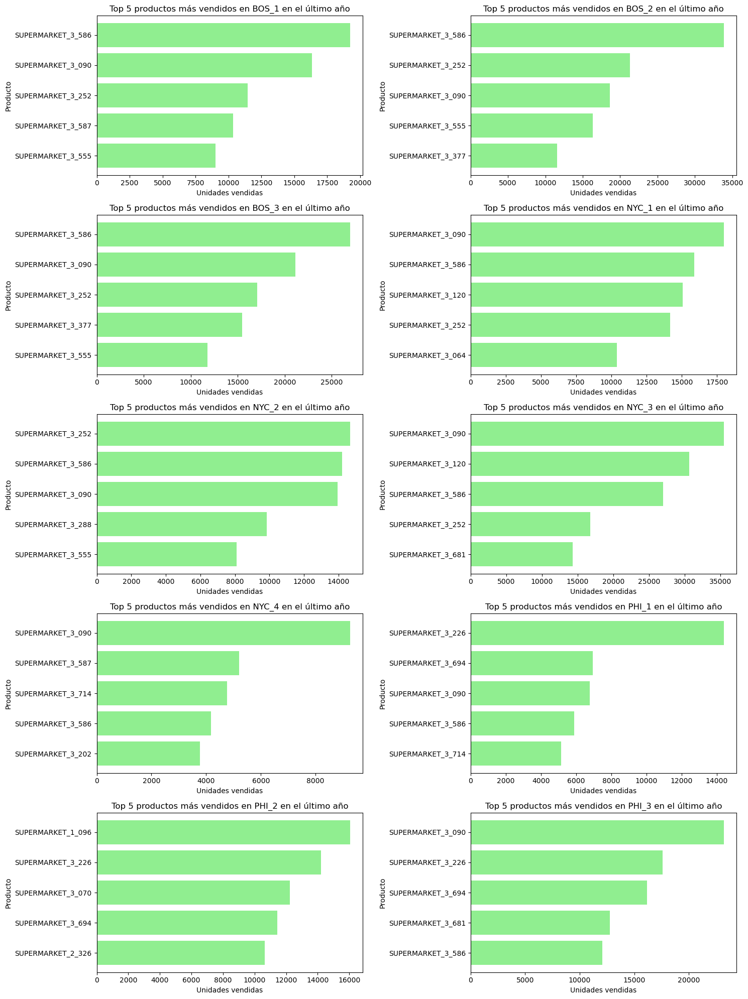

In [10]:
top5_per_store = df_1Y.groupby(['store_code', 'item'])['quantities'].sum().reset_index()
top5_per_store = top5_per_store.sort_values(by=['store_code', 'quantities'], ascending=[True, False])
top5_per_store = top5_per_store.groupby(['store_code']).head(5)

fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 20))
for i, (store, group_store) in enumerate(top5_per_store.groupby('store_code')):
    row = i // 2
    col = i % 2
    group_store = group_store.sort_values(by='quantities', ascending=False)
    axs[row, col].barh(y=group_store['item'], width=group_store['quantities'], color='lightgreen')
    axs[row, col].set_title(f'Top 5 productos más vendidos en {store} en el último año')
    axs[row, col].set_xlabel('Unidades vendidas')
    axs[row, col].set_ylabel('Producto')
    axs[row, col].invert_yaxis()

plt.tight_layout()
plt.show()


In [6]:
avg_quant_g=df_1Y.groupby(by=["store_code","item"])
avg_quant_sorted = avg_quant_g.mean(numeric_only=True).reset_index()[["store_code","item","quantities"]].sort_values(by=["store_code","quantities"],ascending=[True,  False])
top_five = avg_quant_sorted.groupby("store_code").head(5).reset_index(drop="index")

px.bar(top_five,x="item",y="quantities",color="store_code")

Tras analizar los datos de las tiendas de Nueva York, Boston y Filadelfia, hemos generado gráficos que muestran los 5 productos más vendidos en cada una de ellas. Aunque se observa cierta variación en los productos más populares de cada tienda, hemos identificado algunos productos en común que aparecen en los 5 primeros lugares de por lo menos 5 tiendas, estos productos son: SUPERMARKET_3_586, SUPERMARKET_3_090, SUPERMARKET_3_252

Es importante destacar la relevancia de identificar estos productos en común, ya que nos permite diseñar estrategias de marketing específicas para ellos, lo cual nos facilita el lanzamiento de campañas de marketing específicas para cada zona, enfocando nuestros esfuerzos en promocionar aquellos productos que tienen mayor aceptación entre los clientes. Además, este conocimiento también puede ser utilizado para optimizar la gestión de inventario y la asignación de recursos en cada tienda de de DSMarket.

#### Top 5 productos menos vendidos para cada tienda de cada región en los ultimos 365 días

Ahora identificaremos los 5 productos menos vendidos de cada tienda en las regiones de Nueva York, Boston y Filadelfia, con el fin de identificar los productos que ya no son tan populares. 

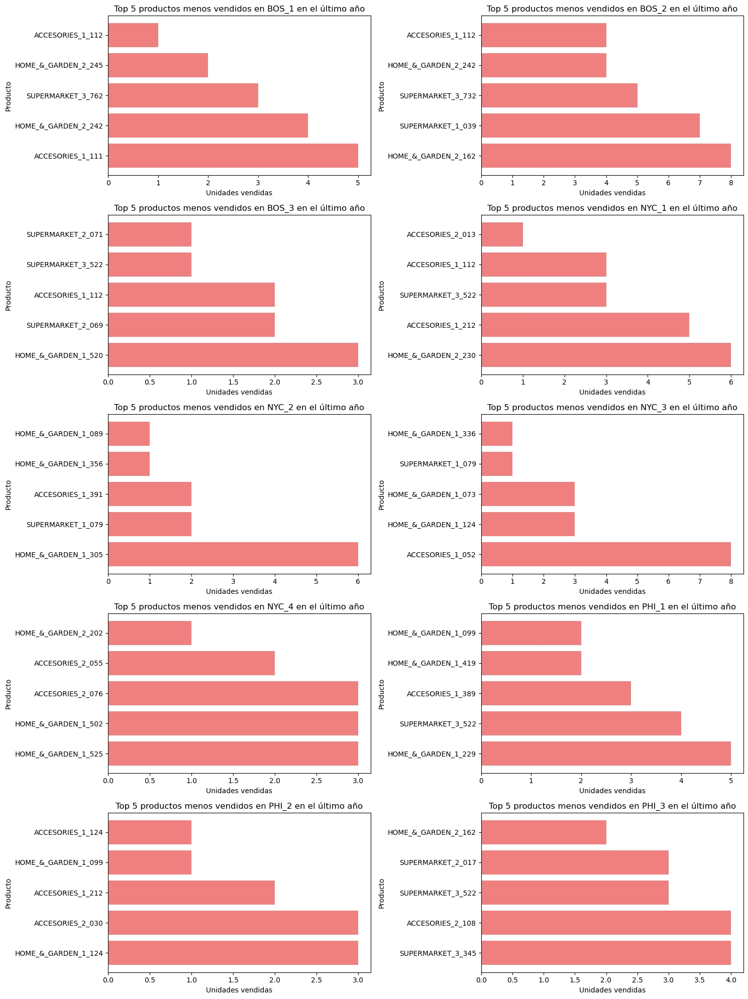

In [17]:
bottom5_per_store = df_1Y[df_1Y['quantities'] > 0].groupby(['store_code', 'item'])['quantities'].sum().reset_index()
bottom5_per_store = bottom5_per_store.query("quantities > 0").sort_values(by=['store_code', 'quantities'], ascending=[True, True])
bottom5_per_store = bottom5_per_store.groupby(['store_code']).head(5)


filtered_bottom5 = bottom5_per_store[bottom5_per_store['item'].isin(common_bottom5)]

fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 20))
for i, (store, group_store) in enumerate(bottom5_per_store.groupby('store_code')):
    row = i // 2
    col = i % 2
    group_store = group_store.sort_values(by='quantities', ascending=True)
    axs[row, col].barh(y=group_store['item'], width=group_store['quantities'], color='lightcoral')
    axs[row, col].set_title(f'Top 5 productos menos vendidos en {store} en el último año')
    axs[row, col].set_xlabel('Unidades vendidas')
    axs[row, col].set_ylabel('Producto')
    axs[row, col].invert_yaxis()

plt.tight_layout()
plt.show()


In [271]:
df_filtered = df_1Y[df_1Y['quantities'] > 0]

avg_quant_g=df_filtered.groupby(by=["store_code","item"])
avg_quant_sorted = avg_quant_g.mean(numeric_only=True).reset_index()[["store_code","item","quantities"]].sort_values(by=["store_code","quantities"],ascending=[False,  True])
top_five = avg_quant_sorted.groupby("store_code").head(5).reset_index(drop="index")

px.bar(top_five,x="item",y="quantities",color="store_code")

Hemos identificado los productos menos populares de cada tienda, esto nos permite  conocer qué productos no están teniendo un buen desempeño. Al conocer esta información, se pueden tomar medidas para mejorar la situación, como reducir el precio del producto, mejorar su calidad o variar su presentación. 

Además, identificar los productos menos populares también puede ayudar a realizar un mejor manejo de inventario, evitando pedidos innecesarios y reduciendo los costos de almacenamiento. 

Finalmente, esta información también puede ser útil para los equipos de marketing, ya que les permite conocer cuáles son los productos que necesitan mayor promoción y publicidad para atraer a los clientes y aumentar las ventas. 

#### Analisis de ventas de los productos mas vendidos en cada tienda y su variacion de precio 

Ya conociendo los 5 productos más vendidos en cada tienda haremso el analisis de su variación de precio, esto nos puede indicar cambios en la oferta y la demanda, así como en la competencia en el mercado. Si se observa una disminución en las ventas a pesar de una reducción en el precio, puede ser indicativo de una disminución en la calidad del producto o de una competencia más fuerte.

Además, al analizar la variación del precio de los productos más vendidos, se puede identificar si hay tendencias estacionales en las ventas y si los precios deben ajustarse para atraer a los clientes durante períodos de menor demanda o aumentar precios durante periodes de mayor demanda.  

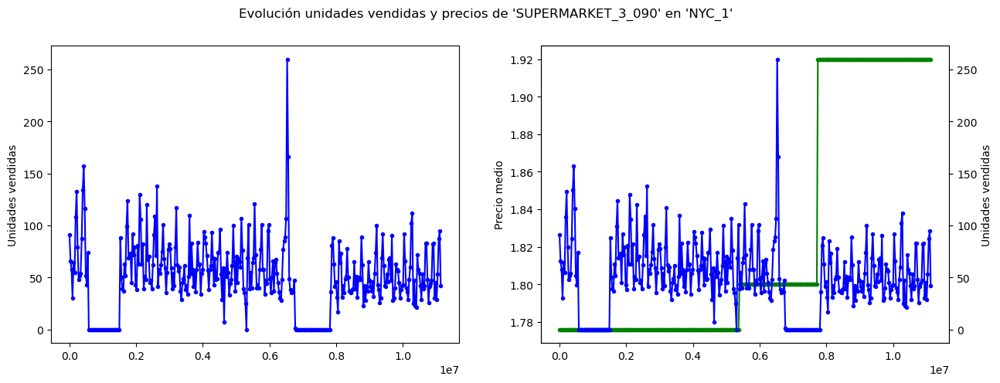

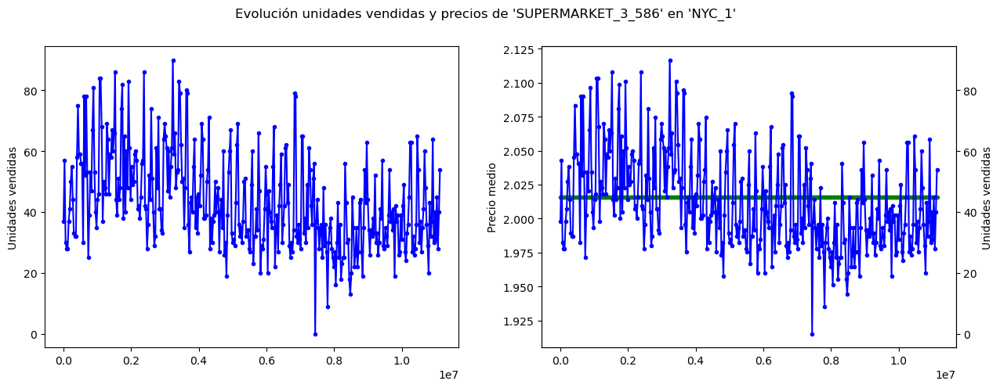

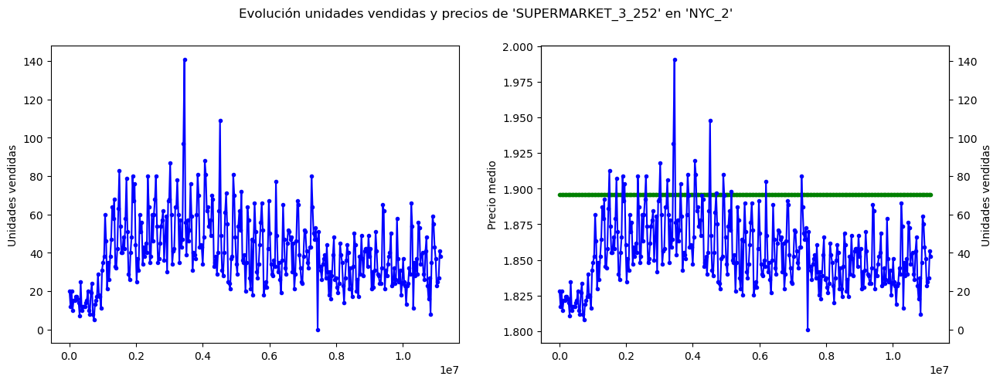

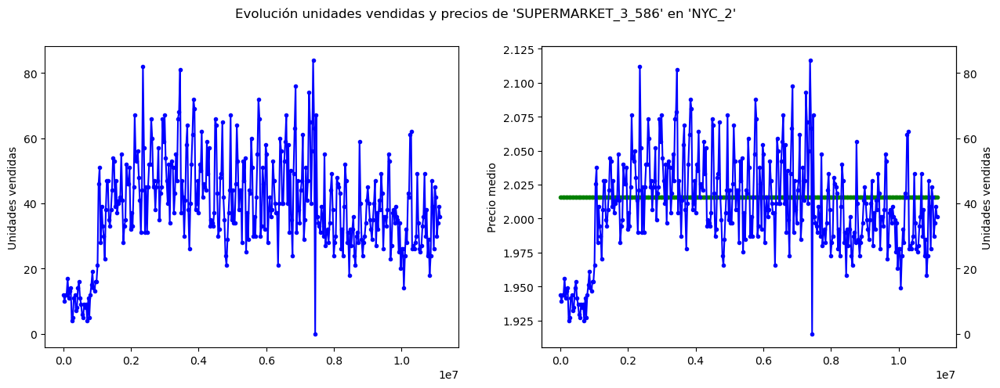

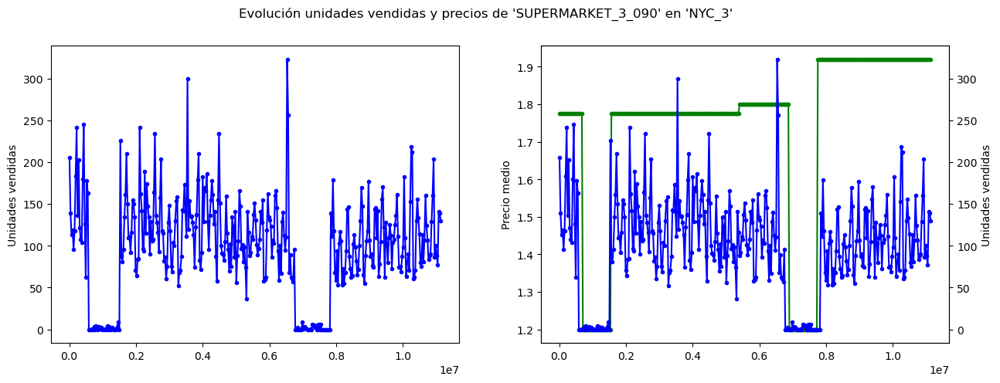

...

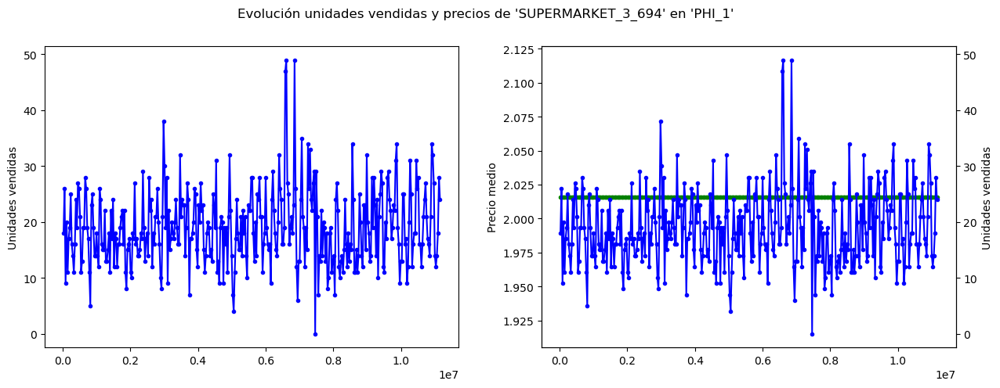

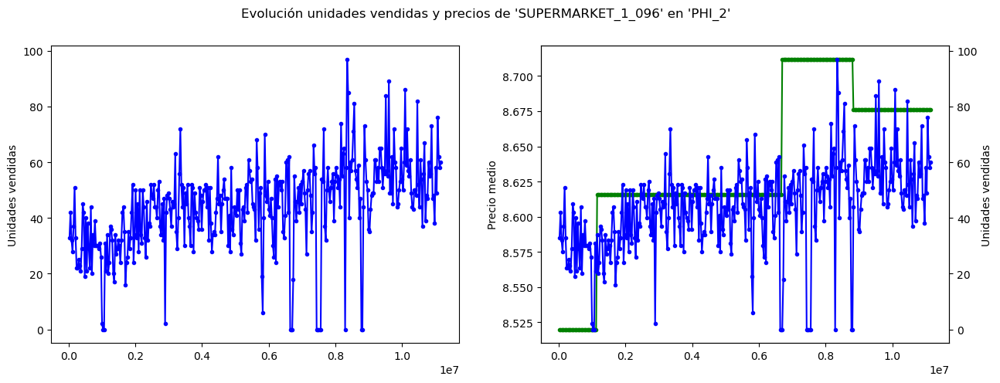

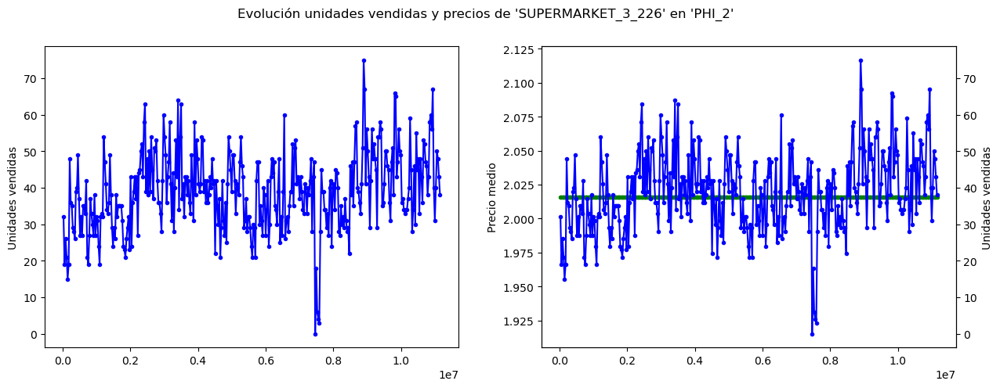

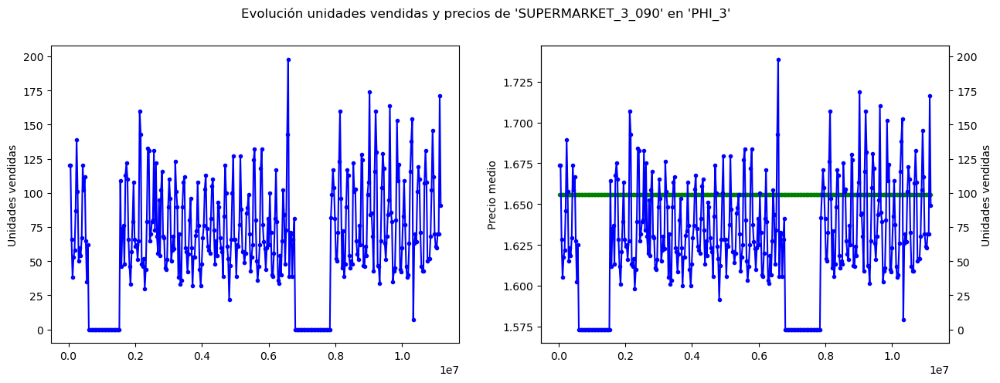

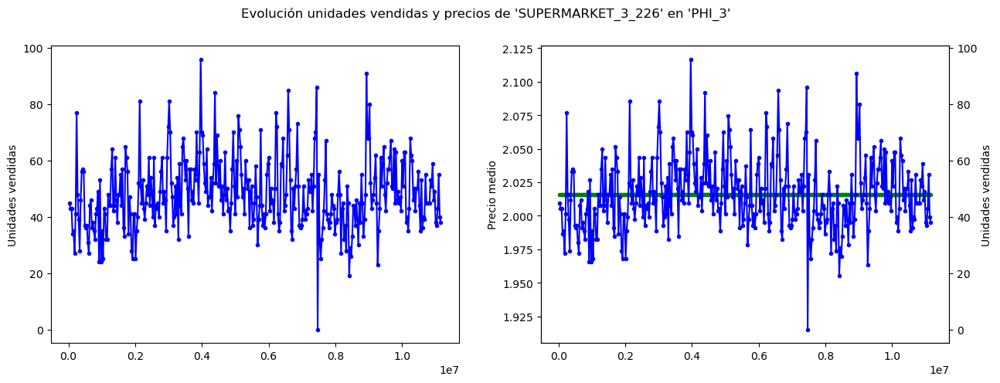

In [225]:
plt.ioff()

store_codes = df_1Y['store_code'].unique()

for store in store_codes:
    df_store = df_1Y[df_1Y['store_code'] == store]
    
    top_products = df_store.groupby('item')['quantities'].sum().nlargest(2).index.tolist()

    for product in top_products:
        df_product = df_store[df_store['item'] == product]

        fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

        axs[0].plot(df_product.groupby(df_product.index)['quantities'].sum(), 'b.-')
        axs[0].set_ylabel("Unidades vendidas")

        axs[1].plot(df_product.groupby(df_product.index)['sell_price'].mean(), 'g.-')
        axs[1].set_ylabel("Precio medio")

        axs2 = axs[1].twinx()
        axs2.plot(df_product.groupby(df_product.index)['quantities'].sum(), 'b.-')
        axs2.set_ylabel("Unidades vendidas")

        fig.suptitle(f"Evolución unidades vendidas y precios de '{product}' en '{store}'")

        plt.show()

plt.ion()


Se puede observar que en la mayoría de los casos los precios de los productos más vendidos se han mantenido constantes durante todo el año, a pesar de que ha habido variaciones en las ventas.

Al analizar los datos, se podría determinar si es conveniente hacer ajustes en el precio de los productos en función de cómo aumentan o disminuyen las ventas. En los productos donde se observa que las ventas disminuyen a pesar de que su precio no ha cambiado, podría ser necesario reducir su precio para mantener su atractivo para los clientes. Por otro lado, en los producto dodne se obseva que estan tendiendo muchas ventas pero su precio es bajo, podría ser una oportunidad para aumentar su precio.

#### Ventas promedio de unidades vendidas por tienda y por categoría 

Analizaremos las ventas promedio de unidades vendidas por tienda y por categoría con el fin de  identificar patrones y tendencias en las ventas

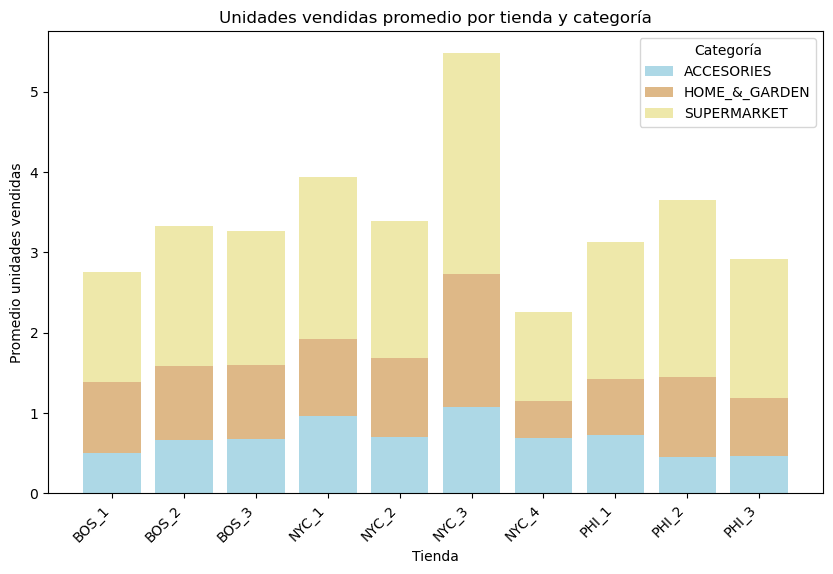

In [17]:
df_grouped = df_1Y.groupby(['store_code', 'category'])['quantities'].mean().reset_index()
df_pivot = df_grouped.pivot(index='store_code', columns='category', values='quantities')

fig, ax = plt.subplots(figsize=(10,6))
ind = np.arange(len(df_pivot.index))
colors = ['lightblue', 'burlywood', "palegoldenrod"]

bottom = np.zeros(len(df_pivot.index))

for i, category in enumerate(df_pivot.columns):
    ax.bar(ind, df_pivot[category], bottom=bottom, color=colors[i], label=category)
    bottom += df_pivot[category]

ax.set_xticks(ind)
ax.set_xticklabels(df_pivot.index, rotation=45, ha='right')
ax.legend(title='Categoría')
ax.set_xlabel('Tienda')
ax.set_ylabel('Promedio unidades vendidas')
ax.set_title('Unidades vendidas promedio por tienda y categoría')

plt.show()


Al observar la gráfica, podemos identificar que la categoría con más ventas en las 10 tiendas es la de "Supermarket", podemos deducir que los clientes tienen una mayor preferencia por estos productos y, por lo tanto, podemos enfocar nuestras estrategias de marketing en ellos.

Del mismo modo, identificamos que las categorías de "Accesories" y "Home & Garden" tienen menos ventas, lo cual nos permite enfocar nuestros esfuerzos en mejorar las ventas de estos productos, ya sea a través de estrategias de promoción o mediante una optimización en la selección y oferta de productos.

Asimismo, podemos notar que la tienda NYC_3 es la tienda con más ventas en promedio, esto nos ayuda para identificar las estrategias que han sido efectivas para aumentar las ventas en esa tienda en particular y replicarlas en otras tiendas para mejorar las ventas en general. Por otro lado, al identificar la tienda NYC_4 como  la tienda con menos ventas, podemos enfocar nuestros esfuerzos en mejorar las ventas en esa tienda en particular, ya sea a través de la revisión de los productos ofrecidos, la estrategia de precios, la calidad del servicio al cliente, entre otros aspectos.

#### Evolucion de las ventas en el tiempo en los ultimos 2 años

Analizaremos la evolución de las ventas en el tiempo para conocer la tendencia de crecimiento o decrecimiento de las ventas a lo largo del tiempo y tomar decisiones estratégicas en consecuencia. En este caso, se ha analizado la evolución de las ventas en los últimos 2 años para cada tienda.
Conocer la evolución de las ventas en el tiempo puede ayudar a la planificación de estrategias de ventas ya que nos permitirá identificar las temporadas de mayor y menor demanda, lo que puede ayudar a DSMarket a ajustar su producción y gestión de inventarios

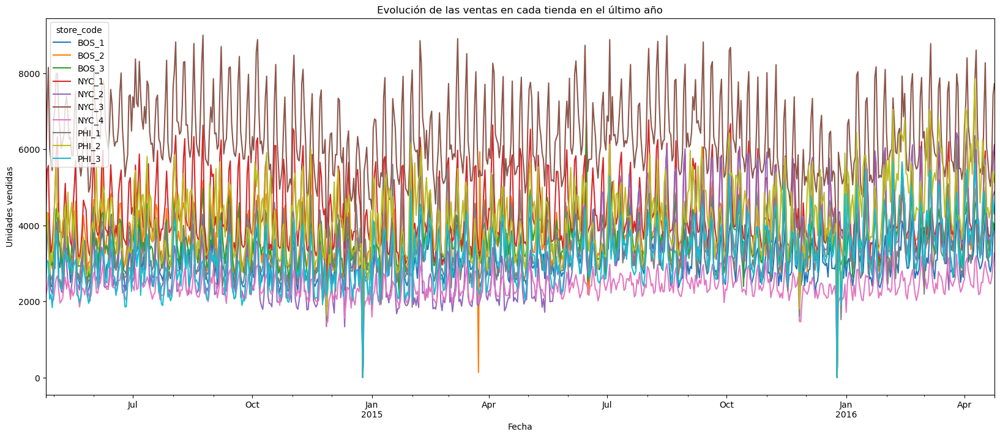

In [14]:
last_date = df.index[-1] 
last_2Y_days = last_date - pd.Timedelta(days=730) 
df_2Y = df.loc[last_2Y_days:last_date] 
df_2Y

df_pivot = df_2Y.pivot_table(index='date', columns='store_code', values='quantities', aggfunc='sum')

fig, ax = plt.subplots(figsize=(20, 8))
df_pivot.plot(ax=ax)

ax.set_title('Evolución de las ventas en cada tienda en el último año')
ax.set_xlabel('Fecha')
ax.set_ylabel('Unidades vendidas')
plt.show()


En el análisis de la evolución de las ventas en los últimos 2 años, se puede observar que las ventas no muestran un crecimiento significativo desde hace 2 años, manteniéndose constantes a lo largo del tiempo. Sin embargo, las ventas son muy volátiles, con una tendencia mensual y una disminución significativa en los meses de diciembre. Esta disminución en las ventas puede ser debido a que las tiendas cierran en días festivos, lo que afecta su volumen de ventas. Es importante tener en cuenta estas tendencias y estacionalidades para poder planificar mejor las estrategias de venta y promociones.

Además, es importante mencionar que en la tienda de PHI_2 se nota una tendencia más creciente en las ventas en comparación con las demás tiendas. A lo largo de los dos años analizados, se puede observar que las ventas han ido aumentando gradualmente en esta tienda, mientras que en las demás tiendas las ventas se han mantenido estables o han tenido variaciones más volátiles. Esto podría indicar que la tienda PHI_2 está teniendo un buen desempeño en términos de ventas y que podría ser un área de enfoque para futuras estrategias de crecimiento y expansión.

#### Ingresos

En esta sección del proyecto, se llevará a cabo el análisis de los ingresos de las diferentes tiendas. Para ello, se examinarán los ingresos generados por cada tienda en los últimos años, así como las tendencias y patrones de crecimiento que se han observado. Además, se llevará a cabo un análisis comparativo de los ingresos generados por cada tienda, con el fin de identificar las áreas que presentan un mayor potencial de crecimiento. 

#### Evolución de las ventas y el crecimiento interanual

Analizaremos la evolucion de las ventas y el crecimiento interanual con el fin de entender cómo se han comportado las ventas en el pasado y cómo se están comportando en el presente. Esto nos permite identificar patrones y tendencias en las ventas, así como posibles oportunidades para aumentar los ingresos en el futuro. Además, el análisis del crecimiento interanual nos permite comparar el rendimiento de las ventas en diferentes períodos y evaluar el éxito de las estrategias implementadas para aumentar los ingresos.

Graficaremos la evolución de los ingresos acumulados de todas las tiendas en los últimos años, así como el crecimiento interanual de los mismos.

In [16]:
yearly_global_sales=df.groupby("year").sum().reset_index()
ygs_11_15=yearly_global_sales[["year","income"]][:-1]

ygs_11_15["lag"]=ygs_11_15["income"].shift()
ygs_11_15["growth"]=(ygs_11_15["income"]-ygs_11_15["lag"])/ygs_11_15["lag"]*100
ygs_11_15["growth"] = ygs_11_15["growth"].round(2)

In [17]:

def plot_rev_growht(df):
  fig = go.Figure()

  fig = make_subplots(specs=[[{"secondary_y": True}]])

  fig.add_trace(
      go.Scatter(
          x=df['year'],
          y=df['growth'],
          name="growht",
          marker=dict(size=15, color="LightSeaGreen")
      ),
      secondary_y=True)

  fig.add_trace(
      go.Bar(
          x=df['year'],
          y=df['income'],
          name="Revenue",
          marker=dict(color="RoyalBlue")
      ))

  fig.update_layout(
      title="Annual revenue and year-over-year growth ",
      xaxis_title="years",
      yaxis=dict(title="Revenue"),
      yaxis2=dict(title="Growth"),
      yaxis2_tickformat=".2f",
      height=600,
      width=1200
  )

  fig.show()

In [18]:
plot_rev_growht(ygs_11_15)

Podemos observar que la empresa ha experimentado un crecimiento significativo del 36.58% en las ventas entre los años 2011 y 2012, lo que puede ser indicativo de una estrategia de marketing exitosa o de la introducción de nuevos productos en el mercado. Sin embargo, en los años siguientes el crecimiento fue menor, con una tasa del 10.28% en 2013, 5.34% en 2014, siendo el crecimiento del año 2015 del 12.34% el más alto de los últimos años.

Esto puede deberse a factores externos como la competencia en el mercado, la situación económica del país o cambios en las preferencias de los consumidores. Por lo tanto, es importante que se realice un análisis más profundo de los factores que influyen en la evolución de las ventas y el crecimiento interanual para identificar áreas de mejora y tomar decisiones estratégicas informadas para mejorar el desempeño en el futuro.

#### Ritmo de ventas de 2016 comparado con los años anteriores

se analizara el ritmo de ventas de 2016 comparado con los años anteriores ya que nos puede dar una idea de cómo va a ser el comportamiento de las ventas para el resto del año. Si el ritmo de ventas es similar al de años anteriores, podemos esperar que el comportamiento de las ventas sea similar al de años anteriores y ajustar nuestras estrategias en consecuencia. Si, por el contrario, el ritmo de ventas es muy diferente al de años anteriores, podemos necesitar ajustar nuestras estrategias de ventas para adaptarnos a los cambios en el mercado. Además, el análisis del ritmo de ventas nos permite identificar oportunidades para mejorar las ventas, como lanzar campañas promocionales o aumentar el stock de productos que tienen un alto nivel de demanda.

Ya que solo se tienen los daos hasta el 24 de abril del 2016, utilizaremos unicamente los datos hasta el 24 de abril de los añor ateriores para tener una mejor comparativa

In [19]:
df_acumulado = df[(df["month"]==1)|(df["month"] <= 4)]
list_days = [f"{year}-04-{day:02d}" for year in range(2011, 2016) for day in range(25, 31)]
df_acumulado = df_acumulado[~df_acumulado.index.isin(list_days)]

yearly_global_sales_cum=df_acumulado.groupby("year").sum().reset_index()
ygs_11_16=yearly_global_sales_cum[["year","income"]]#ventas acumuladas anuales hasta 24 de abril de cada año

#ahora calculamos el crecimiento
ygs_11_16["lag"]=ygs_11_16["income"].shift()
ygs_11_16["growth"]=(ygs_11_16["income"]-ygs_11_16["lag"])/ygs_11_16["lag"]*100
ygs_11_16["growth"] = ygs_11_16["growth"].round(2)

/var/folders/0z/r6bz6cyx7d5gcwfhghqzmz280000gn/T/ipykernel_1286/190574848.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/0z/r6bz6cyx7d5gcwfhghqzmz280000gn/T/ipykernel_1286/190574848.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/0z/r6bz6cyx7d5gcwfhghqzmz280000gn/T/ipykernel_1286/190574848.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docum

In [20]:
plot_rev_growht(ygs_11_16)

Podemos observar que el ritmo de crecimiento de 2016 a 24 de abril, es favorable, siendo el mas alto desde 2013, esto nos puede indicar un cambio positivo en las ventas de la compañía y sugerir una posible tendencia al alza en los ingresos para el año en curso. Por lo tanto, es importante seguir monitoreando el ritmo de ventas y hacer ajustes en la estrategia si es necesario para aprovechar esta oportunidad.

#### Ventas por región: Evolución anual

se analizara la evolución anual de las ventas por región. El objetivo es identificar patrones y tendencias en las ventas de cada región y comparar su rendimiento a lo largo de los años.

Para realizar este análisis, se utilizará un gráfico que muestra la evolución anual de las ventas por región, lo que nos permitirá visualizar de manera clara las tendencias y patrones a lo largo del tiempo, asi mismo nos ayudará a identificar las regiones que han tenido un mejor rendimiento y las que han tenido un peor rendimiento. También se evaluará si ha habido algún cambio en la distribución de las ventas entre las diferentes regiones a lo largo de los años.

Este análisis es importante para entender cómo ha evolucionado el mercado en cada región y tomar decisiones informadas sobre la asignación de recursos y estrategias de marketing en cada una de ellas.

In [21]:
region_sales_11_15=df.groupby(["region","year"])["income"].sum().reset_index()
region_sales_11_15=region_sales_11_15[region_sales_11_15["year"]!=2016]

In [22]:
def plot_line(df,x,y,color): #sell_city, "year","income","store_code"
  fig = px.line(df, x=x, y=y, color=color, markers="o")

  fig.update_layout(title="Annual Evolution of Income by " + str(color), xaxis_title="Year", yaxis_title="Income")
  fig.update_xaxes(range=[2010.8, 2016.2])

  fig.show()

In [23]:
plot_line(region_sales_11_15,"year","income","region")

En la gráfica se puede observar que las ventas han mostrado un comportamiento creciente a lo largo de los años en las tres regiones: Nueva York, Boston y Filadelfia.

Además, se puede observar que la región de Nueva York es la que ha presentado un mayor nivel de ventas a lo largo de los años, seguida de Boston y finalmente Filadelfia. Este comportamiento se ha mantenido constante durante los años, lo que sugiere que Nueva York es una región importante para el negocio y que es importante prestar atención a las tendencias de ventas en esta región en particular.

#### Ingresos por región y año.

Analizaremos la contribución de cada región en las ventas totales de las tres regiones. Este análisis nos permitirá conocer qué porcentaje de las ventas totales corresponde a cada una de las regiones y cómo ha evolucionado a lo largo de los años.

In [24]:
total_global_region=df.groupby(["region","year"]).sum().reset_index()
total_global_region=total_global_region.sort_values('income', ascending=False)

In [25]:
fig = px.bar(total_global_region, x="region", y="income", color="region", facet_col="year") 

fig.update_layout(title="Income by region and year", xaxis_title="Region", yaxis_title="Income", barmode='relative')

fig.show()

En el gráfico se puede observar claramente que Nueva York tiene el mayor ingreso en todos los años, seguido por Boston y finalmente Filadelfia, excepto por el año 2016 donde hasta ahora Filadelfia tiene mayores ingresos que Boston. Es importante tener en cuenta que las ventas del año 2011 comienzan el 29 de enero del mismo año y que para el año 2016 solo contamos con datos hasta el 24 de abril.

El hecho de que Filadelfia tenga más ingresos que Boston en el año 2016 hasta el mes de abril puede ser significativo en términos de la tendencia de ventas en ambas regiones. Considerando que solo se tiene información hasta el mes de abril en 2016, es importante continuar monitoreando y analizando los datos para ver si esta tendencia se mantiene en el resto del año y entender los factores que podrían estar influyendo en estos cambios en los ingresos.

#### Evolución anual de las ventas de cada tienda

Ahora se analizara la evolución de las ventas de cada tienda a lo largo de los años. Este análisis nos permitirá identificar las tiendas que han tenido un crecimiento sostenido en ventas y aquellas que pueden estar enfrentando dificultades. Además, podremos identificar patrones y tendencias en el comportamiento de las ventas de cada tienda que podrían ser útiles para tomar decisiones de negocio en el futuro. Para este análisis, utilizaremos gráficos que nos permitirán visualizar la evolución de las ventas de cada tienda de forma clara y sencilla.

In [26]:
sell_city=df.groupby(["store_code","year"]).sum().reset_index()
sell_city=sell_city[sell_city["year"]!=2016]

In [27]:
plot_line(sell_city,"year","income", "store_code")

En el gráfico presentado podemos apreciar la evolución de las ventas de cada una de las tiendas, y podemos notar que todas presentan un crecimiento en el tiempo, aunque algunas de ellas lo hacen a un ritmo más rápido que otras, dentro de las cuales se encuentran NYC_3, NYC_1, BOS_3, PHI_2. Este análisis nos resulta de gran utilidad, ya que al identificar las tiendas que tienen un mayor crecimiento en las ventas, podemos analizar las estrategias de marketing que están siendo aplicadas en esas tiendas para replicarlas en las tiendas con menor venta como son NYC_4, BOS_1, PHI_3. También podemos analizar otros factores que pueden estar influyendo en el mayor crecimiento de esas tiendas y aplicarlos en las demás tiendas con el objetivo de aumentar sus ingresos.

#### Tendencias

En esta sección del proyecto, nos enfocaremos en analizar las tendencias de ventas a lo largo del tiempo.

#### Total de ventas por mes

Se hara el análisis de ventas por mes ya que nos permitirá identificar patrones y tendencias en las ventas a lo largo del tiempo. Podremos ver si hay meses con mayores ventas, identificar temporadas de mayor demanda y así planificar y tomar decisiones en consecuencia. Además, este análisis nos permite comparar el desempeño de un mes con otro y ver si ha habido una mejora o disminución en las ventas, lo que nos puede ayudar a tomar medidas para mantener o mejorar las ventas.

In [28]:
df_12_15=df.loc[df["year"].isin([2012,2013,2014, 2015])] #dejamos fuera 2016 porque no tenemos la totalidad del año y, por tanto, nos desvirtuará la media de los primeros cuatro meses. Lo mismo pasa con 2011
month_sales=df_12_15.groupby(["month"])["income"].sum().reset_index()

In [29]:
month_sales["month"]=month_sales["month"].replace({1:"jan",2:"feb",3:"mar",4:"april",5:"may",6:"jun",7:"jul",8:"aug",9:"sep",10:"oct",11:"nov",12:"dec"})

In [30]:
fig=px.line(month_sales, x="month", y="income")
fig.update_xaxes(range=[-1,12])

En el gráfico de ventas por mes podemos observar que los meses con mayores ventas son de junio a octubre, mientras que los meses con menores ventas son de noviembre a mayo. Esto puede ser debido a varios factores, como por ejemplo las temporadas de vacaciones, el clima, y los días festivos.

Es posible que los meses de junio a octubre sean más populares debido a que es verano en las tres regiones, lo que significa que las personas están más dispuestas a salir y gastar dinero en actividades. Además, muchos días festivos importantes se celebran en estos meses.

Por otro lado, los meses de noviembre a mayo son generalmente más fríos en las tres regiones, lo que puede disuadir a las personas de salir y gastar dinero. Además, el período de compras navideñas comienza en noviembre y termina en diciembre, lo que puede llevar a una disminución de las ventas en los meses siguientes.

Es importante analizar las tendencias de ventas por mes para poder planificar adecuadamente la gestión de inventarios y el presupuesto de marketing de la empresa. Si se sabe que los meses de junio a octubre son los más fuertes en términos de ventas, se pueden implementar estrategias de marketing específicas para maximizar las ventas durante este período. De igual manera, durante los meses más lentos, se pueden tomar medidas para reducir costos y evitar sobreproducción.

#### Ventas por el día de la semana

Ahora se podra analizar cómo varían las ventas según el día de la semana. Este análisis puede ser de gran utilidad para identificar patrones y tendencias en el comportamiento del consumidor. Además, permite ajustar las estrategias de marketing y operaciones de acuerdo con los días de mayor y menor demanda.

In [31]:
week_12_15=df.loc[df["year"].isin([2012,2013,2014, 2015])] #dejamos fuera 2016 porque no tenemos la totalidad del año y, por tanto, nos desvirtuará la media de los primeros cuatro meses. Lo mismo pasa con 2011
date_week_sales=week_12_15.groupby(["weekday_int"])["income"].mean().reset_index()

In [32]:
px.bar(date_week_sales, "weekday_int","income")# las ventas se concentran los fines de semana (viernes, sábado y domingo: días 7, 1 y 2) y las ventas mínimas los miércoles (día 5)
#Vamos a hacer la media por día también.

En el gráfico de barras se puede observar que los días con mayores ventas son los viernes, sábados y domingos, mientras que el miércoles es el día con menor venta. Esto se puede deber a que los fines de semana las personas tienen más tiempo libre y pueden ir de compras. También es posible que muchas personas reciban su pago semanal o quincenal los viernes, lo que puede incentivar el consumo durante el fin de semana.

Por otro lado, los días laborales como los miércoles suelen ser días en los que las personas tienen menos tiempo libre y pueden estar más enfocadas en su trabajo o en otras responsabilidades, lo que puede reducir el tiempo disponible para realizar compras.

Identificar estos patrones permite planificar y ajustar las estrategias de marketing y ventas según los días de la semana, asi como mejorar la toma de decisiones en cuanto a la gestión de inventario y la planificación de estrategias de marketing y promociones para impulsar las ventas en los días con menor actividad. Se pueden programar promociones especiales para los días con menor venta, atraer a los clientes ofreciendo descuentos especiales o lanzando nuevos productos, o ajustar la disponibilidad de productos y personal en función de los días de mayor o menor demanda.

In [33]:
# Visualización de series

def plot_series(df,x,y,color):

  fig = px.line(df, x=x, y=y, color=color)#, markers=".")
  fig.update_layout(title="Evolution" + " " + color, xaxis_title=x, yaxis_title="revenue")
  

  fig.show()

#### Evolución mensual de los ingresos de ventas por tiendas

Se analizara la evolución mensual de los ingresos de ventas por tiendas con el fin de identificar patrones y tendencias en el comportamiento de las ventas de cada tienda a lo largo del tiempo de manera mensual. De esta manera, se pueden identificar los meses en los que se registran mayores o menores ventas en cada tienda, lo que puede ayudar a tomar decisiones en cuanto a la gestión de inventario, planificación de recursos y estrategias de marketing. Además, también se pueden identificar tiendas con un crecimiento sostenido en ventas y aquellas que puedan necesitar una revisión en sus estrategias comerciales.

In [34]:
stores_month=df.groupby(["store_code","yearmonth"])["income"].sum().reset_index()

In [35]:
plot_series(stores_month,"yearmonth","income",color="store_code")

En este gráfico podemos ver la evolución mensual de los ingresos de ventas por tiendas. En general, podemos observar un crecimiento en los ingresos de todas las tiendas, lo que es una buena señal. Sin embargo, este crecimiento no es tan significativo como nos gustaría.

También podemos notar que hay una estacionalidad en las ventas, donde se observa que en general las ventas suben en el mes de marzo y suelen bajar en el mes de enero. Esto podría deberse a varios factores, como por ejemplo, la temporada de vacaciones de Navidad y Año Nuevo, que suele generar un aumento en las ventas, mientras que en enero las personas suelen gastar menos después de las fiestas navideñas.

Finalmente, podemos observar que la tienda NYC_2 tuvo un gran crecimiento en ventas en los últimos años. Esto nos permite identificar las estrategias que se han tomado en esa tienda y los factores que han influenciado a ese crecimiento. Esto nos da una idea de lo que podemos implementar en otras tiendas para mejorar las ventas y generar un mayor crecimiento.

#### Evolución semanal de los ingresos de ventas por tiendas

Analizaremos cómo varían las ventas a lo largo de la semana para cada tienda. Este análisis nos permitirá identificar patrones semanales y mejorar las estrategias de ventas en función de estos patrones.

In [36]:
stores_week=df.groupby(["store_code","yearweek_iso"])["income"].sum().reset_index()

In [37]:
plot_series(stores_week,"yearweek_iso","income",color="store_code")

En el grafico del análisis de la evolución semanal de los ingresos de ventas por tiendas, podemos observar una  tendencia semanal, podemos notar que existe una caída en las ventas en la semana 52, mientras que en las semanas 27 a 32 suele haber un crecimiento. Esta información es muy útil, ya que nos permite identificar patrones y tendencias en las ventas por semana, lo que puede ayudar a la toma de decisiones en cuanto a estrategias de marketing, gestión de inventarios y asignación de recursos. Además, al analizar los datos por tiendas, podemos identificar aquellas que tienen un mejor rendimiento en ciertas semanas y aquellas que necesitan mejoras en su desempeño.

Podemos observar que estos cambios son aún más notorios en la tienda NYC_3, con una caídas más pronunciadas y crecimiento más significativos lo que nos puede ayudar a encontrar un mejor patron y poder explotar esta infromación para lanzarlas campañas y el marketing adecuado.

#### Top ventas de producto (analizado en el apartado de cantidades) en el total de ingresos por tienda.

Ahora nos enfocaremos en analizar e identificar los top productos más vendidos en cada tienda y su contribución al total de ingresos de la tienda. 

In [38]:
avg_income_g=df_1Y.groupby(by=["store_code","item"])
avg_income_sorted = avg_income_g.mean(numeric_only=True).reset_index()[["store_code","item","income"]].sort_values(by=["store_code","income"],ascending=[True,  False])
top_five = avg_income_sorted.groupby("store_code").head(5).reset_index(drop="index")

px.bar(top_five,x="item",y="income",color="store_code")

#### Principio de pareto o regla de 80/20

#### Global

Analizaremos cuáles son los productos que aportan el 50-60-70-80 por ciento de la cifra de ventas total del conjunto de las regiones.

In [7]:
df_last_year_item = df_1Y.groupby("item").sum().reset_index()
df_last_year_item = df_last_year_item.sort_values(by="income", ascending=False)
df_last_year_item["income_perc"] = df_last_year_item["income"].cumsum()/df_1Y["income"].sum()*100
df_last_year_item = df_last_year_item[["item","income","income_perc"]]

Filtramos por el porcentaje que deseemos y vemos los productos que nos aportan esa parte

In [8]:
df_last_year_item[df_last_year_item["income_perc"]<=50.0] 

,item,income,income_perc
345,ACCESORIES_1_354,665304.125000,1.209127
153,ACCESORIES_1_158,577495.437500,2.258670
2344,SUPERMARKET_3_120,559799.875000,3.276053
2810,SUPERMARKET_3_586,333821.375000,3.882741
2426,SUPERMARKET_3_202,325299.531250,4.473942
...,...,...,...
1966,SUPERMARKET_2_140,29537.615234,49.748852
1008,HOME_&_GARDEN_1_453,29493.175781,49.802456
384,ACCESORIES_1_393,29288.808594,49.855682
1910,SUPERMARKET_2_083,29234.640625,49.908813


Estos productos aportan el 50% de los ingresos. (el total de productos son 3049)

#### Por tienda

In [9]:
def item_income_perc(store,):
  df_last_year_store=df_1Y.groupby(["store_code","item"]).sum().reset_index()
  df_last_year_store=df_last_year_store.sort_values(by=["store_code","income"], ascending=False)
  df_last_year_store=df_last_year_store.loc[df_last_year_store["store_code"]==store, :]
  df_last_year_store["income_perc"]=df_last_year_store["income"].cumsum()/df_last_year_store["income"].sum()*100
  df_last_year_store=df_last_year_store[["item","income","income_perc"]].reset_index(drop="index")
  
  return df_last_year_store
  print(f"Dataframe con todos los productos: \n {df_last_year_store.head()}")
  

#### PHI_3

In [10]:
phi3=item_income_perc("PHI_3") #se puede realizar en cualquiera de las tiendas. 
phi3

,item,income,income_perc
0,SUPERMARKET_3_120,71664.187500,1.646229
1,SUPERMARKET_3_090,38442.382812,2.529306
2,SUPERMARKET_1_096,38126.988281,3.405138
3,SUPERMARKET_3_202,36800.496094,4.250498
4,SUPERMARKET_3_226,35473.535156,5.065376
...,...,...,...
3044,SUPERMARKET_3_522,8.928000,100.000038
3045,ACCESORIES_1_335,0.000000,100.000038
3046,HOME_&_GARDEN_1_146,0.000000,100.000038
3047,HOME_&_GARDEN_1_313,0.000000,100.000038


In [11]:
phi3[phi3["income_perc"]<=60.0] 

,item,income,income_perc
0,SUPERMARKET_3_120,71664.187500,1.646229
1,SUPERMARKET_3_090,38442.382812,2.529306
2,SUPERMARKET_1_096,38126.988281,3.405138
3,SUPERMARKET_3_202,36800.496094,4.250498
4,SUPERMARKET_3_226,35473.535156,5.065376
...,...,...,...
510,HOME_&_GARDEN_2_509,2028.337402,59.782154
511,SUPERMARKET_3_807,2026.727905,59.828712
512,SUPERMARKET_3_053,2020.248047,59.875118
513,SUPERMARKET_3_493,2014.056030,59.921383


515 (17%) productos representan el 60% de los ingresos por ventas (de 3045 productos vendidos)

In [12]:
515/3044

0.16918528252299606

#### NYC_3

In [13]:
ny3=item_income_perc("NYC_3") #se puede realizar en cualquiera de las tiendas.
ny3

,item,income,income_perc
0,SUPERMARKET_3_120,182889.218750,2.054034
1,ACCESORIES_1_354,77447.656250,2.923851
2,SUPERMARKET_3_090,64639.800781,3.649822
3,SUPERMARKET_3_586,54309.023438,4.259768
4,HOME_&_GARDEN_1_053,51328.386719,4.836238
...,...,...,...
3044,ACCESORIES_2_030,12.901000,99.999931
3045,HOME_&_GARDEN_1_336,6.087500,100.000000
3046,SUPERMARKET_1_079,5.496000,100.000061
3047,ACCESORIES_1_335,0.000000,100.000061


In [14]:
ny3[ny3["income_perc"]<=60.0] 

,item,income,income_perc
0,SUPERMARKET_3_120,182889.218750,2.054034
1,ACCESORIES_1_354,77447.656250,2.923851
2,SUPERMARKET_3_090,64639.800781,3.649822
3,SUPERMARKET_3_586,54309.023438,4.259768
4,HOME_&_GARDEN_1_053,51328.386719,4.836238
...,...,...,...
539,HOME_&_GARDEN_1_098,4159.575195,59.776985
540,SUPERMARKET_3_232,4154.399902,59.823643
541,HOME_&_GARDEN_1_355,4149.600098,59.870251
542,HOME_&_GARDEN_1_490,4145.987305,59.916813


544 (18%) artículos representan el 60% de las ventas

In [15]:
544/3047*100

17.853626517886447

## 2. Clustering

En esta sección se pretende dentificar grupos de productos que se comportan de manera similar, con el fin de evaluar el rendimiento de las diferentes campañas. 

1. Se calculará el número de grupos crees que debemos considerar (5, 10, 20) 
2. Se buscará un enfoque ”similar" para identificar cómo de similares son las tiendas entre sí, haciendo una  agrupación de tiendas

Para identificar grupos de productos que se comportan de manera similar, podemos utilizar el algoritmo K-Means para agrupar los productos según sus patrones de ventas.

Para determinar el número de grupos adecuado, se utiliza el "elbow method" que nos ayuda a seleccionar el número óptimo de clusters.

In [52]:
df_aux = df[["item", "store_code", "quantities", "income"]]

### Clustering por producto

In [53]:
# Determinamos el número óptimo de clusters para productos:

# Agrupamos por producto y tienda
ventas_por_producto = df_aux.groupby(['item', 'store_code']).sum()

# Seleccionamos las variables para clustering
X = ventas_por_producto[['quantities', 'income']]

# Normalizamos los datos
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

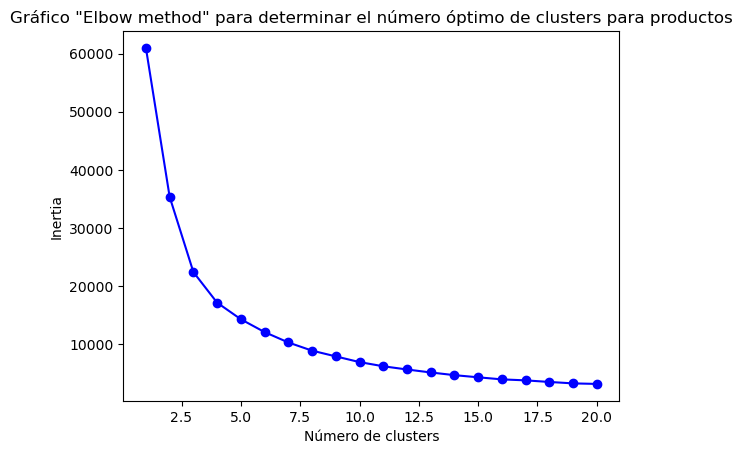

In [54]:
# Mediante un gráfico determinamos el número óptimo de clusters para los productos
inertias = []

for k in range(1, 21):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    inertias.append(kmeans.inertia_)
    
plt.plot(range(1, 21), inertias, 'bo-')
plt.title('Gráfico "Elbow method" para determinar el número óptimo de clusters para productos')
plt.xlabel('Número de clusters')
plt.ylabel('Inertia')
plt.show()


In [55]:
# el punto que representa al "codo del brazo" es el número óptimo de Clusters, en este caso es 6

In [56]:
# Agrupamos los productos en 6 clusters

kmeans_productos = KMeans(n_clusters=6, random_state=42)
kmeans_productos.fit(X_scaled)
ventas_por_producto['cluster'] = kmeans_productos.labels_
ventas_por_producto

quantities       income  cluster
item              store_code                                  
ACCESORIES_1_001  BOS_1            260.0  2854.658691        0
                  BOS_2            402.0  4421.558105        0
                  BOS_3            385.0  4257.462891        0
                  NYC_1            600.0  6595.310059        0
                  NYC_2            542.0  5956.218750        0
...                                  ...          ...      ...
SUPERMARKET_3_827 NYC_3           2572.0  3086.400146        0
                  NYC_4             93.0   111.600006        0
                  PHI_1           2732.0  3278.400146        0
                  PHI_2            867.0  1040.400024        0
                  PHI_3           1329.0  1594.800049        0

[30490 rows x 3 columns]

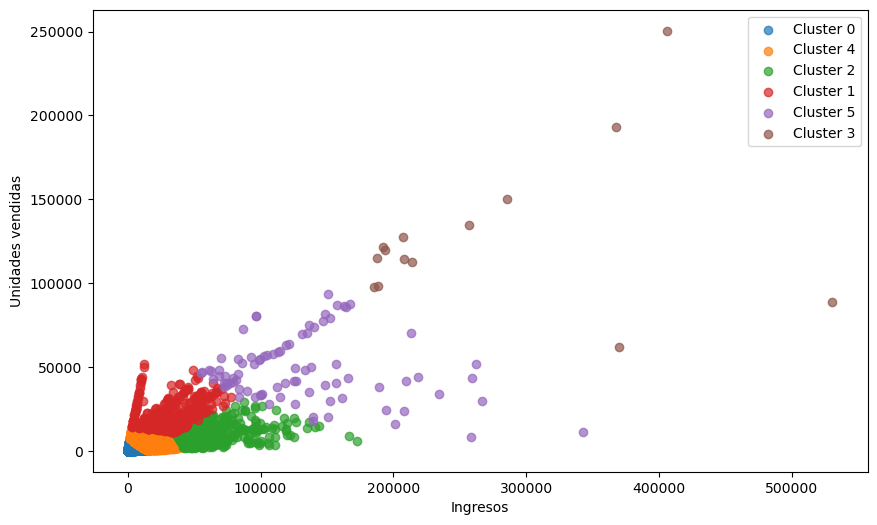

Grupo 0:
	- Ingreso medio: 3556.11
	- Unidades vendidas medias por día: 882.86
	- Desviación estándar del ingreso: 2722.85
	- Desviación estándar de unidades vendidas: 833.89
Grupo 1:
	- Ingreso medio: 16616.76
	- Unidades vendidas medias por día: 4469.59
	- Desviación estándar del ingreso: 7501.49
	- Desviación estándar de unidades vendidas: 2672.97
Grupo 2:
	- Ingreso medio: 59900.99
	- Unidades vendidas medias por día: 9173.92
	- Desviación estándar del ingreso: 21384.64
	- Desviación estándar de unidades vendidas: 5265.23
Grupo 3:
	- Ingreso medio: 28169.62
	- Unidades vendidas medias por día: 19975.07
	- Desviación estándar del ingreso: 14546.40
	- Desviación estándar de unidades vendidas: 7406.53
Grupo 4:
	- Ingreso medio: 129511.81
	- Unidades vendidas medias por día: 48072.92
	- Desviación estándar del ingreso: 55810.12
	- Desviación estándar de unidades vendidas: 18750.14
Grupo 5:
	- Ingreso medio: 271006.06
	- Unidades vendidas medias por día: 127418.29
	- Desviación estándar

In [57]:
# Gráfico de dispersión para productos

productos_por_cluster = {}
for i, cluster in enumerate(kmeans_productos.labels_):
    if cluster not in productos_por_cluster:
        productos_por_cluster[cluster] = {'income': [], 'quantities': []}
    productos_por_cluster[cluster]['income'].append(X.iloc[i, 1])
    productos_por_cluster[cluster]['quantities'].append(X.iloc[i, 0])

fig, ax = plt.subplots(figsize=(10, 6))
for i, cluster in enumerate(productos_por_cluster):
    ax.scatter(productos_por_cluster[cluster]['income'], 
               productos_por_cluster[cluster]['quantities'], 
               color=f'C{i}', alpha=0.7, label=f'Cluster {cluster}')

ax.set_xlabel('Ingresos')
ax.set_ylabel('Unidades vendidas')
ax.legend()
plt.show()

# Características comunes de los productos en cada grupo
for i, cluster in enumerate(productos_por_cluster):
    print(f"Grupo {i}:")
    print(f"\t- Ingreso medio: {np.mean(productos_por_cluster[cluster]['income']):.2f}")
    print(f"\t- Unidades vendidas medias por día: {np.mean(productos_por_cluster[cluster]['quantities']):.2f}")
    print(f"\t- Desviación estándar del ingreso: {np.std(productos_por_cluster[cluster]['income']):.2f}")
    print(f"\t- Desviación estándar de unidades vendidas: {np.std(productos_por_cluster[cluster]['quantities']):.2f}")


Estadísticas descriptivas para cada cluster de productos

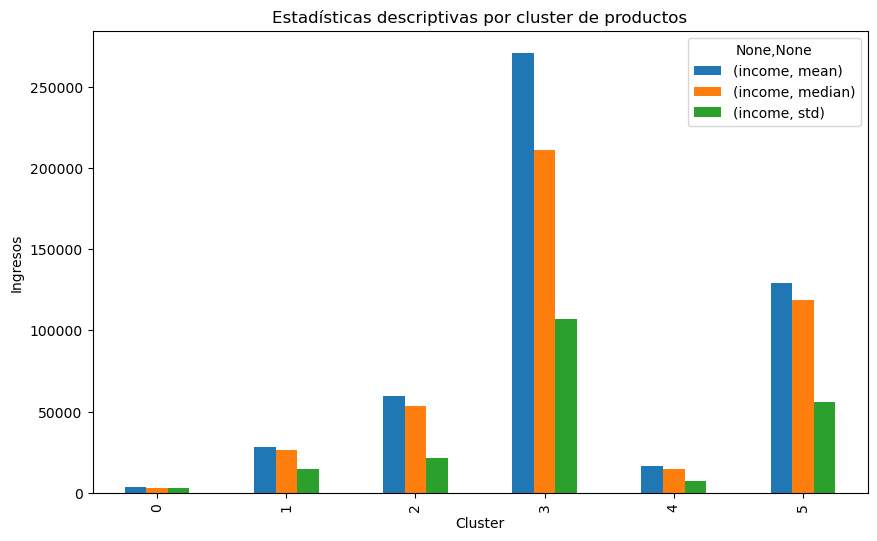

In [58]:
estadisticas_por_cluster_productos = ventas_por_producto.groupby('cluster').agg({'income': ['mean', 'median', 'std']})

estadisticas_por_cluster_productos.plot(kind='bar', figsize=(10,6))
plt.title('Estadísticas descriptivas por cluster de productos')
plt.xlabel('Cluster')
plt.ylabel('Ingresos')
plt.show()

Cluster de productos con mas numero de ventas:

In [59]:
cluster_productos_mas_ventas = ventas_por_producto.groupby('cluster')['quantities'].sum().idxmax()
cluster_productos_mas_ventas

4

In [60]:
# Productos del cluster con mas ventas y los ordenamos por cantidad vendida
productos_cluster_mas_ventas = ventas_por_producto[ventas_por_producto['cluster'] == cluster_productos_mas_ventas].sort_values('quantities', ascending=False)

# 10 productos más populares del cluster con más ventas
productos_cluster_mas_ventas.head(10)

,,quantities,income,cluster
item,store_code,,,
SUPERMARKET_3_711,BOS_1,13702.0,3277.763916,4
ACCESORIES_1_178,NYC_4,13595.0,8575.281250,4
SUPERMARKET_3_498,BOS_2,13355.0,3149.027832,4
SUPERMARKET_3_070,PHI_3,13337.0,3225.899902,4
ACCESORIES_1_278,NYC_1,13293.0,9770.751953,4
SUPERMARKET_3_412,BOS_1,13092.0,3099.515869,4
SUPERMARKET_2_021,BOS_2,13089.0,10542.744141,4
SUPERMARKET_2_360,BOS_1,13056.0,11032.656250,4
ACCESORIES_1_256,NYC_3,13046.0,8252.463867,4


Cluster de productos con mas numero de ingresos:

In [61]:
cluster_productos_mas_ingresos = ventas_por_producto.groupby('cluster')['income'].sum().idxmax()
cluster_productos_mas_ingresos

0

In [62]:
# Productos del cluster con mas ingresos y los ordenamos por cantidad vendida
productos_cluster_mas_ingresos = ventas_por_producto[ventas_por_producto['cluster'] == cluster_productos_mas_ingresos].sort_values('income', ascending=False)

# 10 productos más populares del cluster con más ingresos
productos_cluster_mas_ingresos.head(10)

quantities        income  cluster
item                store_code                                   
ACCESORIES_1_060    NYC_4            354.0  14362.882812        0
                    NYC_1            353.0  14276.419922        0
ACCESORIES_1_342    BOS_2            577.0  14166.388672        0
ACCESORIES_1_354    PHI_1            464.0  14073.687500        0
ACCESORIES_1_060    NYC_3            344.0  13965.584961        0
ACCESORIES_1_297    PHI_3            703.0  13935.740234        0
ACCESORIES_1_104    NYC_3            436.0  13905.522461        0
HOME_&_GARDEN_1_537 PHI_1            696.0  13892.274414        0
ACCESORIES_1_098    NYC_2            708.0  13875.012695        0
HOME_&_GARDEN_1_140 PHI_1            731.0  13735.711914        0

### Clustering para tiendas

In [63]:
# Determinamos el número óptimo de clusters para tiendas

ventas_por_tienda = df_aux.groupby(['store_code']).sum()
Y = ventas_por_tienda[['quantities', 'income']]

# Normalizamos los datos
Y_scaled = scaler.fit_transform(Y)

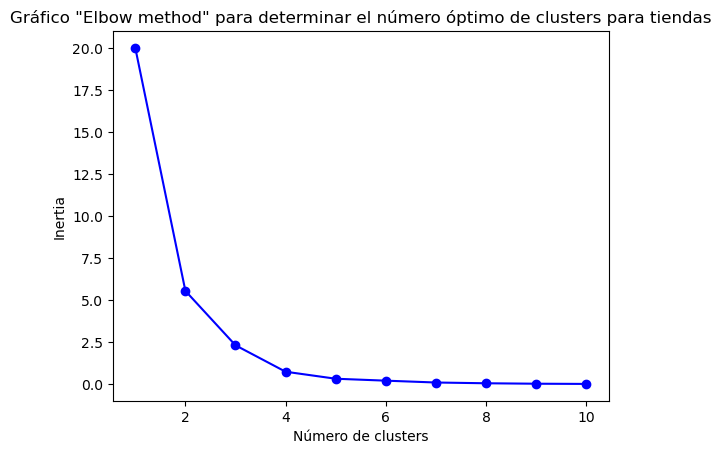

In [64]:
# Mediante un gráfico determinamos el número óptimo de clusters para las tiendas

inertias = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(Y_scaled)
    inertias.append(kmeans.inertia_)
plt.plot(range(1, 11), inertias, 'bo-')
plt.title('Gráfico "Elbow method" para determinar el número óptimo de clusters para tiendas')
plt.xlabel('Número de clusters')
plt.ylabel('Inertia')
plt.show()

In [65]:
# Número óptimo de Clusters: 3

In [66]:
# Agrupamos las tiendas en 3 clusters

kmeans_tiendas = KMeans(n_clusters=3, random_state=42)
kmeans_tiendas.fit(Y_scaled)
ventas_por_tienda['cluster'] = kmeans_tiendas.labels_
ventas_por_tienda

,quantities,income,cluster
store_code,,,
BOS_1,5595292.0,19338360.0,1
BOS_2,7214384.0,25259692.0,0
BOS_3,6089330.0,21941304.0,1
NYC_1,7698216.0,27731996.0,0
NYC_2,5685475.0,21505460.0,1
NYC_3,11188180.0,39491808.0,2
NYC_4,4103676.0,15045220.0,1
PHI_1,5149062.0,18232030.0,1
PHI_2,6544012.0,21655820.0,1


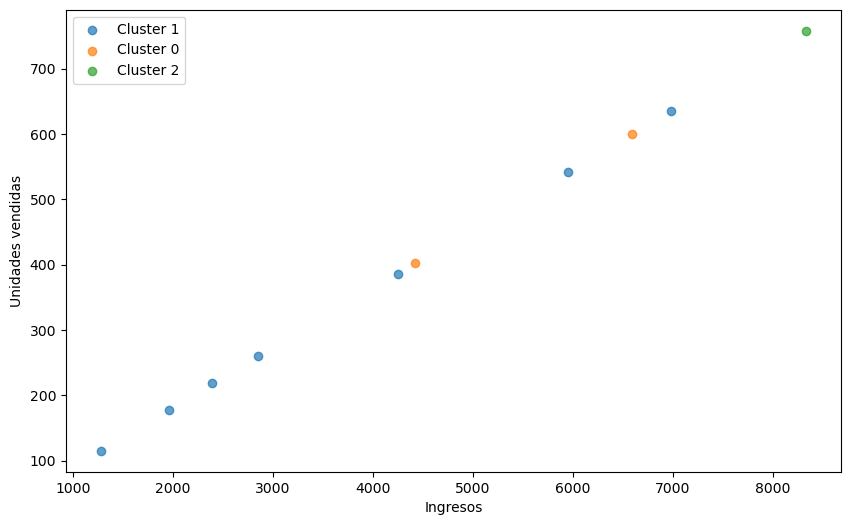

Grupo 0:
	- Ingreso medio: 3670.20
	- Unidades vendidas medias por día: 333.29
	- Desviación estándar del ingreso: 1981.54
	- Desviación estándar de unidades vendidas: 180.35
Grupo 1:
	- Ingreso medio: 5508.43
	- Unidades vendidas medias por día: 501.00
	- Desviación estándar del ingreso: 1086.88
	- Desviación estándar de unidades vendidas: 99.00
Grupo 2:
	- Ingreso medio: 8329.63
	- Unidades vendidas medias por día: 758.00
	- Desviación estándar del ingreso: 0.00
	- Desviación estándar de unidades vendidas: 0.00


In [67]:
# Gráfico de dispersión para tiendas

tiendas_por_cluster = {}
for i, cluster in enumerate(kmeans_tiendas.labels_):
    if cluster not in tiendas_por_cluster:
        tiendas_por_cluster[cluster] = {'income': [], 'quantities': []}
    tiendas_por_cluster[cluster]['income'].append(X.iloc[i, 1])
    tiendas_por_cluster[cluster]['quantities'].append(X.iloc[i, 0])

fig, ax = plt.subplots(figsize=(10, 6))
for i, cluster in enumerate(tiendas_por_cluster):
    ax.scatter(tiendas_por_cluster[cluster]['income'], 
               tiendas_por_cluster[cluster]['quantities'], 
               color=f'C{i}', alpha=0.7, label=f'Cluster {cluster}')

ax.set_xlabel('Ingresos')
ax.set_ylabel('Unidades vendidas')
ax.legend()
plt.show()

# Características comunes de los productos en cada grupo
for i, cluster in enumerate(tiendas_por_cluster):
    print(f"Grupo {i}:")
    print(f"\t- Ingreso medio: {np.mean(tiendas_por_cluster[cluster]['income']):.2f}")
    print(f"\t- Unidades vendidas medias por día: {np.mean(tiendas_por_cluster[cluster]['quantities']):.2f}")
    print(f"\t- Desviación estándar del ingreso: {np.std(tiendas_por_cluster[cluster]['income']):.2f}")
    print(f"\t- Desviación estándar de unidades vendidas: {np.std(tiendas_por_cluster[cluster]['quantities']):.2f}")


Cluster de tiendas con mas numero de ventas:

In [68]:
cluster_tiendas_mas_ventas = ventas_por_tienda.groupby('cluster')['quantities'].sum().idxmax()
cluster_tiendas_mas_ventas

1

Estadísticas descriptivas para cada cluster de tiendas

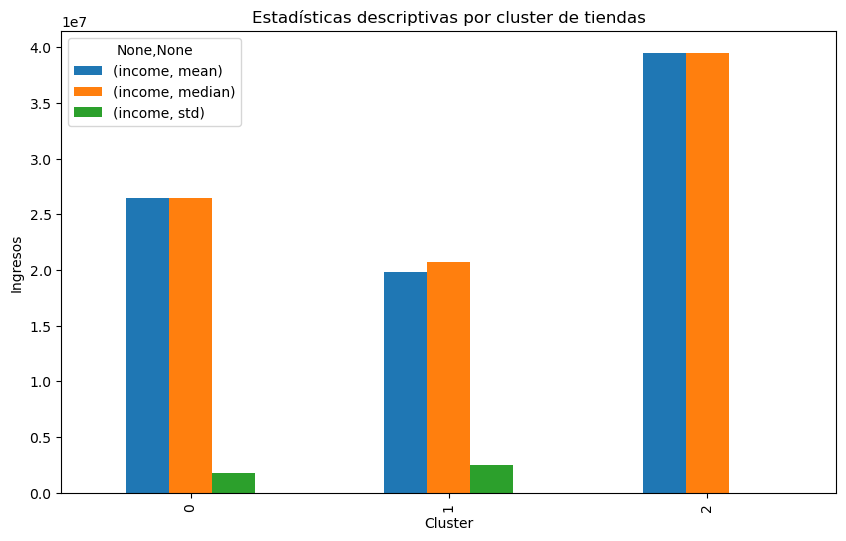

In [69]:
estadisticas_por_cluster_tiendas = ventas_por_tienda.groupby('cluster').agg({'income': ['mean', 'median', 'std']})

estadisticas_por_cluster_tiendas.plot(kind='bar', figsize=(10,6))
plt.title('Estadísticas descriptivas por cluster de tiendas')
plt.xlabel('Cluster')
plt.ylabel('Ingresos')
plt.show()

Cluster de tiendas con mas numero de ingresos:

In [72]:
cluster_tiendas_mas_ingresos = ventas_por_tienda.groupby('cluster')['income'].sum().idxmax()
cluster_tiendas_mas_ingresos

1

In [73]:
# Tiendas del cluster con mas ingresos y los ordenamos por cantidad vendida
tiendas_cluster_mas_ingresos = ventas_por_tienda[ventas_por_tienda['cluster'] == cluster_tiendas_mas_ingresos].sort_values('income', ascending=False)

# Tiendas más populares del cluster con más ingresos
tiendas_cluster_mas_ingresos

,quantities,income,cluster
store_code,,,
BOS_3,6089330.0,21941304.0,1
PHI_2,6544012.0,21655820.0,1
NYC_2,5685475.0,21505460.0,1
PHI_3,6427782.0,20749604.0,1
BOS_1,5595292.0,19338360.0,1
PHI_1,5149062.0,18232030.0,1
NYC_4,4103676.0,15045220.0,1


Con la identificacion de los clusters de productos y tiendas,se puede usar para:

1. Comparar el desempeño de cada cluster en términos de ventas, rentabilidad, satisfacción del cliente, etc. con el fin de identificar qué clusters están funcionando bien y cuáles necesitan mejoras.

2. Analizar las características de los clientes que compran en cada cluster de tiendas y productos para identificar patrones y tendencias. Utilizar la información obtenida para segmentar a los clientes y personalizar la oferta y promociones según sus preferencias. Identificar posibles oportunidades de venta cruzada o de promoción conjunta.

3. Una vez identificados los patrones y tendencias en cada cluster, se pueden diseñar estrategias de marketing específicas para cada grupo. 

4. Se puede utilizar la información de los clusters de productos para optimizar el inventario y asegurarse de que hay suficiente stock de los productos más populares.

5. Utilizar la información de los clusters para prever la demanda futura y planificar la producción y distribución.

6. La información obtenida a partir de los clusters de tiendas y productos también puede a DSMarket a planificar la expansión del negocio. Si se identifica que hay un cluster de tiendas con un alto potencial de crecimiento, se puede considerar abrir nuevas tiendas en esa área para aumentar a los clientes.

### Clustering de producto por evento

In [74]:
df["event"].unique()

['None', 'SuperBowl', 'Ramadan starts', 'Thanksgiving', 'NewYear', 'Easter']
Categories (6, object): ['Easter', 'NewYear', 'None', 'Ramadan starts', 'SuperBowl', 'Thanksgiving']

In [6]:
df_aux_2 = df[["item", "quantities", "income", "event"]]

In [7]:
df_aux_2 = df_aux_2[df_aux_2['event'] != 'None']

### Super Bowl

In [17]:
df_SuperBowl = df_aux_2[df_aux_2['event'] == 'SuperBowl']

In [18]:
ventas_SuperBowl = df_SuperBowl.groupby(['item']).sum()

Z = ventas_SuperBowl[['quantities', 'income']]

# Normalizamos los datos
Z_scaled = scaler.fit_transform(Z)


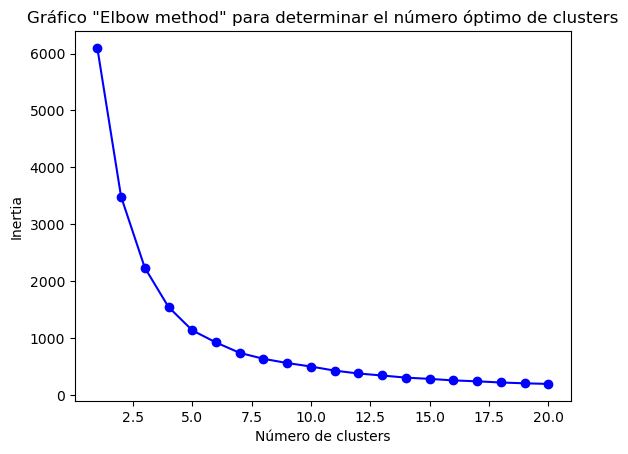

In [19]:
inertias = []
for k in range(1, 21):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(Z_scaled)
    inertias.append(kmeans.inertia_)

plt.plot(range(1, 21), inertias, 'bo-')
plt.title('Gráfico "Elbow method" para determinar el número óptimo de clusters')
plt.xlabel('Número de clusters')
plt.ylabel('Inertia')
plt.show()

In [20]:
# Numero optimo de clusters: 6

In [21]:
kmeans_SB = KMeans(n_clusters=6, random_state=42)
kmeans_SB.fit(Z_scaled)

ventas_SuperBowl['cluster'] = kmeans_SB.labels_

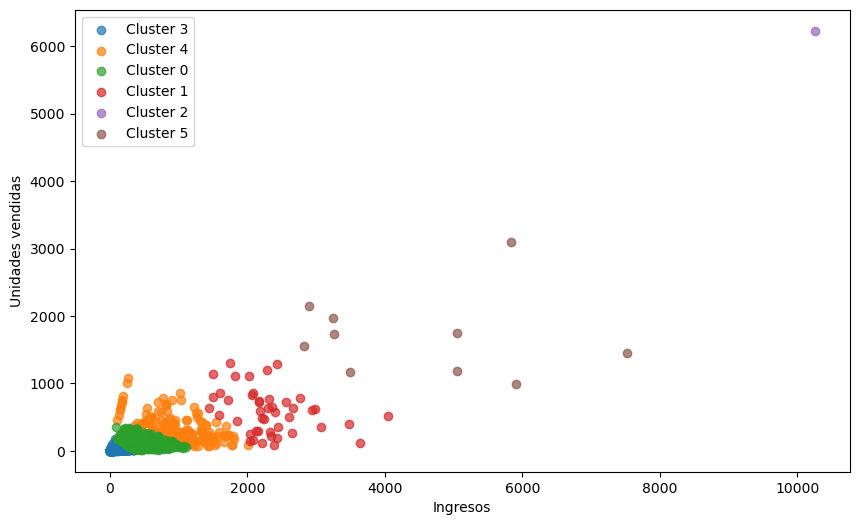

Grupo 0:
	- Ingreso medio: 110.85
	- Unidades vendidas medias por día: 27.41
	- Desviación estándar del ingreso: 76.74
	- Desviación estándar de unidades vendidas: 23.97
Grupo 1:
	- Ingreso medio: 941.94
	- Unidades vendidas medias por día: 338.00
	- Desviación estándar del ingreso: 405.80
	- Desviación estándar de unidades vendidas: 189.61
Grupo 2:
	- Ingreso medio: 436.60
	- Unidades vendidas medias por día: 113.30
	- Desviación estándar del ingreso: 180.74
	- Desviación estándar de unidades vendidas: 66.55
Grupo 3:
	- Ingreso medio: 2310.78
	- Unidades vendidas medias por día: 585.02
	- Desviación estándar del ingreso: 537.88
	- Desviación estándar de unidades vendidas: 322.43
Grupo 4:
	- Ingreso medio: 10253.33
	- Unidades vendidas medias por día: 6231.00
	- Desviación estándar del ingreso: 0.00
	- Desviación estándar de unidades vendidas: 0.00
Grupo 5:
	- Ingreso medio: 4507.56
	- Unidades vendidas medias por día: 1704.00
	- Desviación estándar del ingreso: 1517.10
	- Desviación e

In [22]:
# Gráfico de dispersión SuperBowl

productos_por_cluster = {}
for i, cluster in enumerate(kmeans_SB.labels_):
    if cluster not in productos_por_cluster:
        productos_por_cluster[cluster] = {'income': [], 'quantities': []}
    productos_por_cluster[cluster]['income'].append(Z.iloc[i, 1])
    productos_por_cluster[cluster]['quantities'].append(Z.iloc[i, 0])

fig, ax = plt.subplots(figsize=(10, 6))
for i, cluster in enumerate(productos_por_cluster):
    ax.scatter(productos_por_cluster[cluster]['income'], 
               productos_por_cluster[cluster]['quantities'], 
               color=f'C{i}', alpha=0.7, label=f'Cluster {cluster}')

ax.set_xlabel('Ingresos')
ax.set_ylabel('Unidades vendidas')
ax.legend()
plt.show()

# Características comunes de los productos en cada grupo
for i, cluster in enumerate(productos_por_cluster):
    print(f"Grupo {i}:")
    print(f"\t- Ingreso medio: {np.mean(productos_por_cluster[cluster]['income']):.2f}")
    print(f"\t- Unidades vendidas medias por día: {np.mean(productos_por_cluster[cluster]['quantities']):.2f}")
    print(f"\t- Desviación estándar del ingreso: {np.std(productos_por_cluster[cluster]['income']):.2f}")
    print(f"\t- Desviación estándar de unidades vendidas: {np.std(productos_por_cluster[cluster]['quantities']):.2f}")


Cluster de productos SuperBowl con mas numero de ventas:

In [23]:
cluster_productos_SB_mas_ventas = ventas_SuperBowl.groupby('cluster')['quantities'].sum().idxmax()
cluster_productos_SB_mas_ventas

0

In [24]:
# Productos del cluster con mas ventas y los ordenamos por cantidad vendida
productos_cluster_mas_ventas_SB = ventas_SuperBowl[ventas_SuperBowl['cluster'] == cluster_productos_SB_mas_ventas].sort_values('quantities', ascending=False)

# 10 productos más populares del cluster con más ventas
productos_cluster_mas_ventas_SB.head(10)

,quantities,income,cluster
item,,,
SUPERMARKET_3_070,349,83.759995,0
ACCESORIES_1_371,340,214.422607,0
SUPERMARKET_2_128,332,281.712006,0
ACCESORIES_1_278,328,233.494797,0
HOME_&_GARDEN_1_439,326,387.424988,0
ACCESORIES_1_008,326,206.362808,0
SUPERMARKET_1_184,325,390.000000,0
SUPERMARKET_3_413,321,385.200012,0
ACCESORIES_1_254,317,297.068787,0


### Thanksgiving

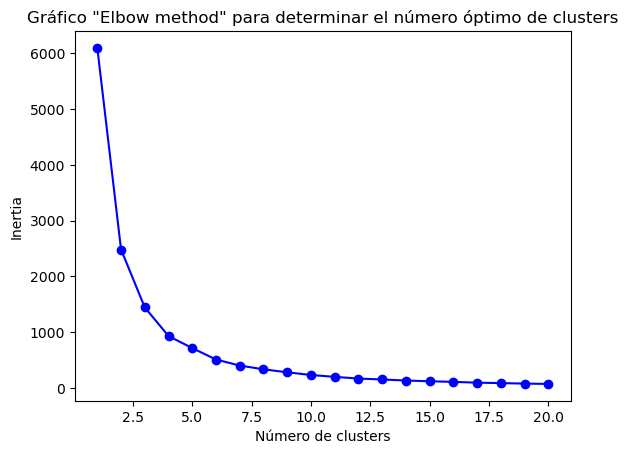

In [25]:
df_thanksgiving = df_aux_2[df_aux_2['event'] == 'Thanksgiving']

ventas_TG = df_thanksgiving.groupby(['item']).sum()

Z = ventas_TG[['quantities', 'income']]

# Normalizamos los datos
Z_scaled = scaler.fit_transform(Z)

inertias = []
for k in range(1, 21):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(Z_scaled)
    inertias.append(kmeans.inertia_)

plt.plot(range(1, 21), inertias, 'bo-')
plt.title('Gráfico "Elbow method" para determinar el número óptimo de clusters')
plt.xlabel('Número de clusters')
plt.ylabel('Inertia')
plt.show()

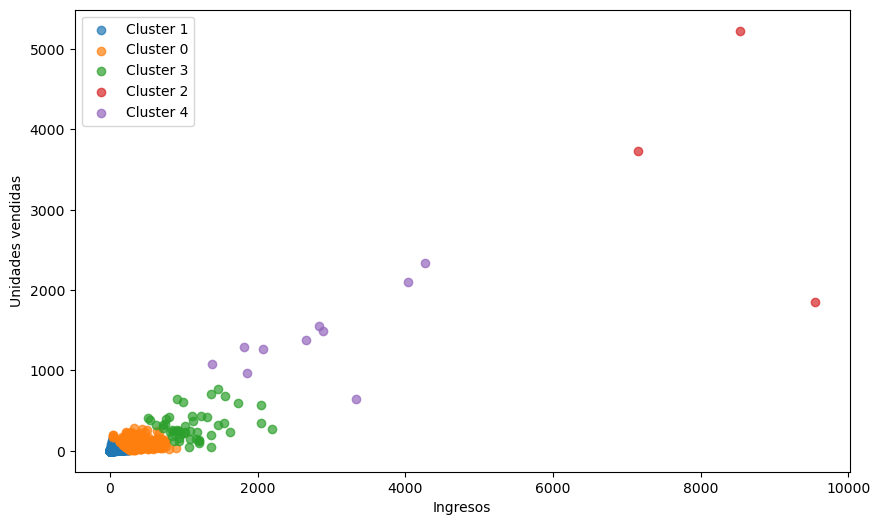

Grupo 0:
	- Ingreso medio: 54.15
	- Unidades vendidas medias por día: 14.02
	- Desviación estándar del ingreso: 49.39
	- Desviación estándar de unidades vendidas: 16.66
Grupo 1:
	- Ingreso medio: 351.12
	- Unidades vendidas medias por día: 92.71
	- Desviación estándar del ingreso: 151.49
	- Desviación estándar de unidades vendidas: 59.25
Grupo 2:
	- Ingreso medio: 1123.33
	- Unidades vendidas medias por día: 313.88
	- Desviación estándar del ingreso: 373.61
	- Desviación estándar de unidades vendidas: 173.10
Grupo 3:
	- Ingreso medio: 8408.23
	- Unidades vendidas medias por día: 3603.67
	- Desviación estándar del ingreso: 977.66
	- Desviación estándar de unidades vendidas: 1382.91
Grupo 4:
	- Ingreso medio: 2710.81
	- Unidades vendidas medias por día: 1412.80
	- Desviación estándar del ingreso: 912.21
	- Desviación estándar de unidades vendidas: 478.13


In [26]:
# Numero optimo de clusters: 5

kmeans_TG = KMeans(n_clusters=5, random_state=42)
kmeans_TG.fit(Z_scaled)

ventas_TG['cluster'] = kmeans_TG.labels_

# Gráfico de dispersión Thanksgiving
productos_por_cluster = {}
for i, cluster in enumerate(kmeans_TG.labels_):
    if cluster not in productos_por_cluster:
        productos_por_cluster[cluster] = {'income': [], 'quantities': []}
    productos_por_cluster[cluster]['income'].append(Z.iloc[i, 1])
    productos_por_cluster[cluster]['quantities'].append(Z.iloc[i, 0])

fig, ax = plt.subplots(figsize=(10, 6))
for i, cluster in enumerate(productos_por_cluster):
    ax.scatter(productos_por_cluster[cluster]['income'], 
               productos_por_cluster[cluster]['quantities'], 
               color=f'C{i}', alpha=0.7, label=f'Cluster {cluster}')

ax.set_xlabel('Ingresos')
ax.set_ylabel('Unidades vendidas')
ax.legend()
plt.show()

# Características comunes de los productos en cada grupo
for i, cluster in enumerate(productos_por_cluster):
    print(f"Grupo {i}:")
    print(f"\t- Ingreso medio: {np.mean(productos_por_cluster[cluster]['income']):.2f}")
    print(f"\t- Unidades vendidas medias por día: {np.mean(productos_por_cluster[cluster]['quantities']):.2f}")
    print(f"\t- Desviación estándar del ingreso: {np.std(productos_por_cluster[cluster]['income']):.2f}")
    print(f"\t- Desviación estándar de unidades vendidas: {np.std(productos_por_cluster[cluster]['quantities']):.2f}")



Cluster de productos Thanksgiving con mas numero de ventas:

In [27]:
cluster_productos_TG_mas_ventas = ventas_TG.groupby('cluster')['quantities'].sum().idxmax()
cluster_productos_TG_mas_ventas

1

In [28]:
# Productos del cluster con mas ventas y los ordenamos por cantidad vendida
productos_cluster_mas_ventas_TG = ventas_TG[ventas_TG['cluster'] == cluster_productos_TG_mas_ventas].sort_values('quantities', ascending=False)

# 10 productos más populares del cluster con más ventas
productos_cluster_mas_ventas_TG.head(10)

,quantities,income,cluster
item,,,
SUPERMARKET_3_412,173,41.519997,1
SUPERMARKET_3_498,156,37.439999,1
SUPERMARKET_3_007,125,29.999998,1
SUPERMARKET_3_580,123,29.519999,1
ACCESORIES_1_048,114,70.623001,1
ACCESORIES_1_348,111,69.452599,1
SUPERMARKET_1_018,110,128.136002,1
HOME_&_GARDEN_1_114,106,128.524994,1
SUPERMARKET_2_326,106,119.136002,1


### Easter

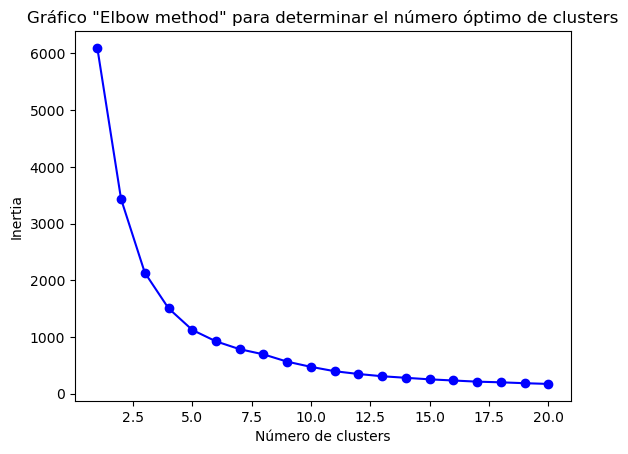

In [29]:
df_easter = df_aux_2[df_aux_2['event'] == 'Easter']

ventas_E = df_easter.groupby(['item']).sum()

Z = ventas_E[['quantities', 'income']]

# Normalizamos los datos
Z_scaled = scaler.fit_transform(Z)

inertias = []
for k in range(1, 21):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(Z_scaled)
    inertias.append(kmeans.inertia_)

plt.plot(range(1, 21), inertias, 'bo-')
plt.title('Gráfico "Elbow method" para determinar el número óptimo de clusters')
plt.xlabel('Número de clusters')
plt.ylabel('Inertia')
plt.show()


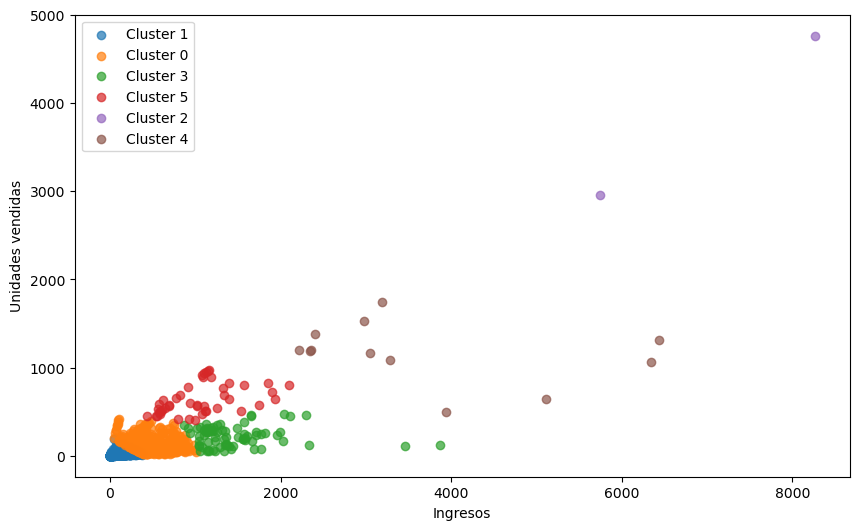

Grupo 0:
	- Ingreso medio: 110.66
	- Unidades vendidas medias por día: 26.89
	- Desviación estándar del ingreso: 79.22
	- Desviación estándar de unidades vendidas: 23.33
Grupo 1:
	- Ingreso medio: 442.81
	- Unidades vendidas medias por día: 127.43
	- Desviación estándar del ingreso: 186.52
	- Desviación estándar de unidades vendidas: 84.59
Grupo 2:
	- Ingreso medio: 1452.33
	- Unidades vendidas medias por día: 223.03
	- Desviación estándar del ingreso: 494.84
	- Desviación estándar de unidades vendidas: 111.17
Grupo 3:
	- Ingreso medio: 1046.22
	- Unidades vendidas medias por día: 636.80
	- Desviación estándar del ingreso: 417.71
	- Desviación estándar de unidades vendidas: 166.26
Grupo 4:
	- Ingreso medio: 7000.57
	- Unidades vendidas medias por día: 3861.00
	- Desviación estándar del ingreso: 1258.91
	- Desviación estándar de unidades vendidas: 902.00
Grupo 5:
	- Ingreso medio: 3635.59
	- Unidades vendidas medias por día: 1166.92
	- Desviación estándar del ingreso: 1454.96
	- Desviac

In [30]:
# Numero optimo de clusters: 6

kmeans_E = KMeans(n_clusters=6, random_state=42)
kmeans_E.fit(Z_scaled)

ventas_E['cluster'] = kmeans_E.labels_

# Gráfico de dispersión Easter
productos_por_cluster = {}
for i, cluster in enumerate(kmeans_E.labels_):
    if cluster not in productos_por_cluster:
        productos_por_cluster[cluster] = {'income': [], 'quantities': []}
    productos_por_cluster[cluster]['income'].append(Z.iloc[i, 1])
    productos_por_cluster[cluster]['quantities'].append(Z.iloc[i, 0])

fig, ax = plt.subplots(figsize=(10, 6))
for i, cluster in enumerate(productos_por_cluster):
    ax.scatter(productos_por_cluster[cluster]['income'], 
               productos_por_cluster[cluster]['quantities'], 
               color=f'C{i}', alpha=0.7, label=f'Cluster {cluster}')

ax.set_xlabel('Ingresos')
ax.set_ylabel('Unidades vendidas')
ax.legend()
plt.show()

# Características comunes de los productos en cada grupo
for i, cluster in enumerate(productos_por_cluster):
    print(f"Grupo {i}:")
    print(f"\t- Ingreso medio: {np.mean(productos_por_cluster[cluster]['income']):.2f}")
    print(f"\t- Unidades vendidas medias por día: {np.mean(productos_por_cluster[cluster]['quantities']):.2f}")
    print(f"\t- Desviación estándar del ingreso: {np.std(productos_por_cluster[cluster]['income']):.2f}")
    print(f"\t- Desviación estándar de unidades vendidas: {np.std(productos_por_cluster[cluster]['quantities']):.2f}")



Cluster de productos Easter con mas numero de ventas:

In [31]:
cluster_productos_E_mas_ventas = ventas_E.groupby('cluster')['quantities'].sum().idxmax()
cluster_productos_E_mas_ventas

0

In [32]:
# Productos del cluster con mas ventas y los ordenamos por cantidad vendida
productos_cluster_mas_ventas_E = ventas_E[ventas_E['cluster'] == cluster_productos_E_mas_ventas].sort_values('quantities', ascending=False)

# 10 productos más populares del cluster con más ventas
productos_cluster_mas_ventas_E.head(10)

,quantities,income,cluster
item,,,
SUPERMARKET_3_752,416,105.180000,0
SUPERMARKET_3_234,400,98.879997,0
HOME_&_GARDEN_1_418,397,484.075012,0
SUPERMARKET_3_498,387,97.139999,0
SUPERMARKET_3_668,375,736.800049,0
HOME_&_GARDEN_1_465,372,453.125000,0
HOME_&_GARDEN_1_339,366,446.612518,0
SUPERMARKET_2_326,362,412.512024,0
HOME_&_GARDEN_1_277,360,439.524994,0


#### Ramadan starts

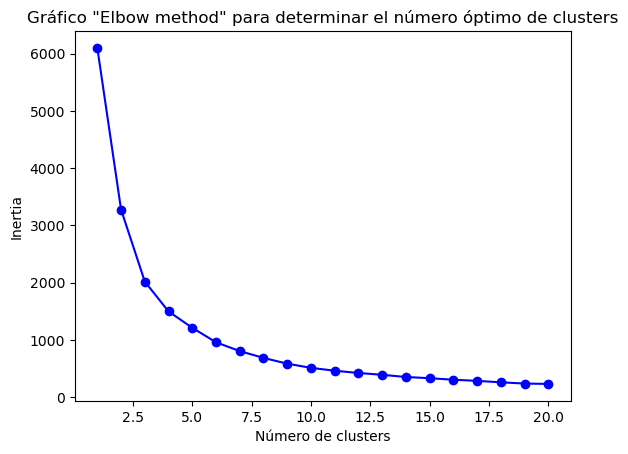

In [33]:
df_RS = df_aux_2[df_aux_2['event'] == 'Ramadan starts']

ventas_RS = df_RS.groupby(['item']).sum()

Z = ventas_RS[['quantities', 'income']]

# Normalizamos los datos
scaler = StandardScaler()
Z_scaled = scaler.fit_transform(Z)

inertias = []
for k in range(1, 21):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(Z_scaled)
    inertias.append(kmeans.inertia_)

plt.plot(range(1, 21), inertias, 'bo-')
plt.title('Gráfico "Elbow method" para determinar el número óptimo de clusters')
plt.xlabel('Número de clusters')
plt.ylabel('Inertia')
plt.show()


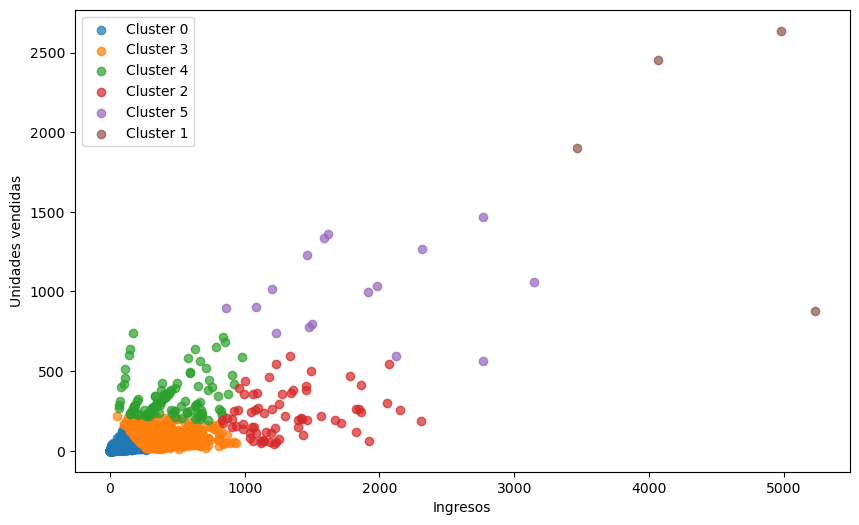

Grupo 0:
	- Ingreso medio: 86.16
	- Unidades vendidas medias por día: 21.84
	- Desviación estándar del ingreso: 61.31
	- Desviación estándar de unidades vendidas: 20.25
Grupo 1:
	- Ingreso medio: 366.96
	- Unidades vendidas medias por día: 82.54
	- Desviación estándar del ingreso: 156.54
	- Desviación estándar de unidades vendidas: 46.43
Grupo 2:
	- Ingreso medio: 442.68
	- Unidades vendidas medias por día: 331.31
	- Desviación estándar del ingreso: 227.17
	- Desviación estándar de unidades vendidas: 123.33
Grupo 3:
	- Ingreso medio: 1305.80
	- Unidades vendidas medias por día: 231.99
	- Desviación estándar del ingreso: 348.14
	- Desviación estándar de unidades vendidas: 136.27
Grupo 4:
	- Ingreso medio: 1815.23
	- Unidades vendidas medias por día: 1002.12
	- Desviación estándar del ingreso: 640.01
	- Desviación estándar de unidades vendidas: 265.16
Grupo 5:
	- Ingreso medio: 4437.16
	- Unidades vendidas medias por día: 1967.25
	- Desviación estándar del ingreso: 706.72
	- Desviación e

In [14]:
# Numero optimo de clusters: 6

kmeans_RS = KMeans(n_clusters=6, random_state=42)
kmeans_RS.fit(Z_scaled)

ventas_RS['cluster'] = kmeans_RS.labels_

# Gráfico de dispersión Thanksgiving
productos_por_cluster = {}
for i, cluster in enumerate(kmeans_RS.labels_):
    if cluster not in productos_por_cluster:
        productos_por_cluster[cluster] = {'income': [], 'quantities': []}
    productos_por_cluster[cluster]['income'].append(Z.iloc[i, 1])
    productos_por_cluster[cluster]['quantities'].append(Z.iloc[i, 0])

fig, ax = plt.subplots(figsize=(10, 6))
for i, cluster in enumerate(productos_por_cluster):
    ax.scatter(productos_por_cluster[cluster]['income'], 
               productos_por_cluster[cluster]['quantities'], 
               color=f'C{i}', alpha=0.7, label=f'Cluster {cluster}')

ax.set_xlabel('Ingresos')
ax.set_ylabel('Unidades vendidas')
ax.legend()
plt.show()

# Características comunes de los productos en cada grupo
for i, cluster in enumerate(productos_por_cluster):
    print(f"Grupo {i}:")
    print(f"\t- Ingreso medio: {np.mean(productos_por_cluster[cluster]['income']):.2f}")
    print(f"\t- Unidades vendidas medias por día: {np.mean(productos_por_cluster[cluster]['quantities']):.2f}")
    print(f"\t- Desviación estándar del ingreso: {np.std(productos_por_cluster[cluster]['income']):.2f}")
    print(f"\t- Desviación estándar de unidades vendidas: {np.std(productos_por_cluster[cluster]['quantities']):.2f}")



Cluster de productos Ramadan starts con mas numero de ventas:

In [15]:
cluster_productos_RS_mas_ventas = ventas_RS.groupby('cluster')['quantities'].sum().idxmax()
cluster_productos_RS_mas_ventas

0

In [16]:
# Productos del cluster con mas ventas y los ordenamos por cantidad vendida
productos_cluster_mas_ventas_RS = ventas_RS[ventas_RS['cluster'] == cluster_productos_RS_mas_ventas].sort_values('quantities', ascending=False)

# 10 productos más populares del cluster con más ventas
productos_cluster_mas_ventas_RS.head(10)

,quantities,income,cluster
item,,,
ACCESORIES_1_288,142,106.945297,0
ACCESORIES_1_312,137,104.165596,0
ACCESORIES_1_398,137,103.221298,0
ACCESORIES_1_408,128,102.143997,0
ACCESORIES_1_417,128,95.946198,0
ACCESORIES_1_067,123,91.916298,0
SUPERMARKET_2_065,120,134.040009,0
HOME_&_GARDEN_1_254,118,143.824997,0
SUPERMARKET_1_042,117,137.015991,0


### New Year

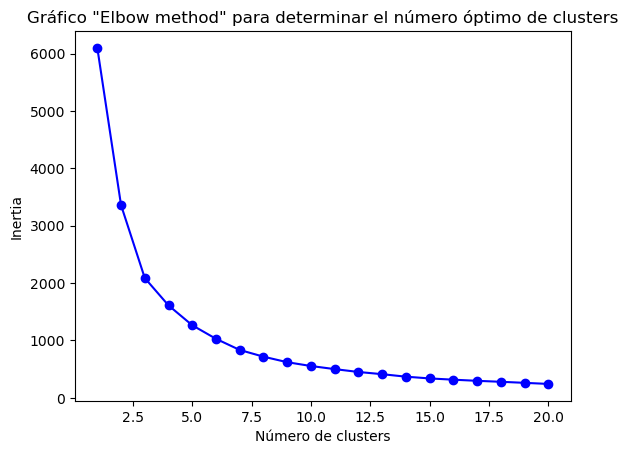

In [34]:
df_NY = df_aux_2[df_aux_2['event'] == 'NewYear']

ventas_NY = df_NY.groupby(['item']).sum()

Z = ventas_NY[['quantities', 'income']]

# Normalizamos los datos
Z_scaled = scaler.fit_transform(Z)

inertias = []
for k in range(1, 21):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(Z_scaled)
    inertias.append(kmeans.inertia_)

plt.plot(range(1, 21), inertias, 'bo-')
plt.title('Gráfico "Elbow method" para determinar el número óptimo de clusters')
plt.xlabel('Número de clusters')
plt.ylabel('Inertia')
plt.show()



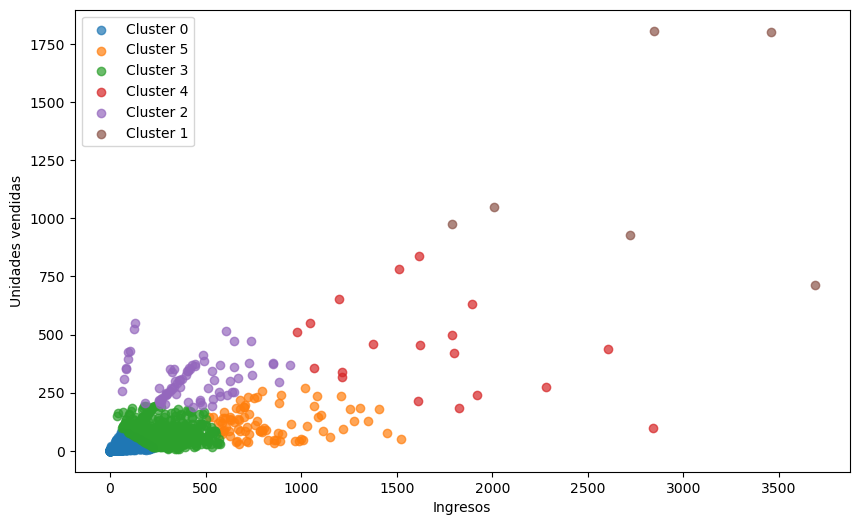

Grupo 0:
	- Ingreso medio: 67.45
	- Unidades vendidas medias por día: 16.30
	- Desviación estándar del ingreso: 48.84
	- Desviación estándar de unidades vendidas: 14.05
Grupo 1:
	- Ingreso medio: 828.05
	- Unidades vendidas medias por día: 120.52
	- Desviación estándar del ingreso: 234.88
	- Desviación estándar de unidades vendidas: 61.72
Grupo 2:
	- Ingreso medio: 268.36
	- Unidades vendidas medias por día: 71.85
	- Desviación estándar del ingreso: 110.02
	- Desviación estándar de unidades vendidas: 42.28
Grupo 3:
	- Ingreso medio: 1653.30
	- Unidades vendidas medias por día: 435.16
	- Desviación estándar del ingreso: 501.10
	- Desviación estándar de unidades vendidas: 193.32
Grupo 4:
	- Ingreso medio: 414.16
	- Unidades vendidas medias por día: 306.03
	- Desviación estándar del ingreso: 202.45
	- Desviación estándar de unidades vendidas: 83.33
Grupo 5:
	- Ingreso medio: 2750.75
	- Unidades vendidas medias por día: 1213.50
	- Desviación estándar del ingreso: 690.59
	- Desviación están

In [35]:
# Numero optimo de clusters: 6

kmeans_NY = KMeans(n_clusters=6, random_state=42)
kmeans_NY.fit(Z_scaled)

ventas_NY['cluster'] = kmeans_NY.labels_

# Gráfico de dispersión Thanksgiving
productos_por_cluster = {}
for i, cluster in enumerate(kmeans_NY.labels_):
    if cluster not in productos_por_cluster:
        productos_por_cluster[cluster] = {'income': [], 'quantities': []}
    productos_por_cluster[cluster]['income'].append(Z.iloc[i, 1])
    productos_por_cluster[cluster]['quantities'].append(Z.iloc[i, 0])

fig, ax = plt.subplots(figsize=(10, 6))
for i, cluster in enumerate(productos_por_cluster):
    ax.scatter(productos_por_cluster[cluster]['income'], 
               productos_por_cluster[cluster]['quantities'], 
               color=f'C{i}', alpha=0.7, label=f'Cluster {cluster}')

ax.set_xlabel('Ingresos')
ax.set_ylabel('Unidades vendidas')
ax.legend()
plt.show()

# Características comunes de los productos en cada grupo
for i, cluster in enumerate(productos_por_cluster):
    print(f"Grupo {i}:")
    print(f"\t- Ingreso medio: {np.mean(productos_por_cluster[cluster]['income']):.2f}")
    print(f"\t- Unidades vendidas medias por día: {np.mean(productos_por_cluster[cluster]['quantities']):.2f}")
    print(f"\t- Desviación estándar del ingreso: {np.std(productos_por_cluster[cluster]['income']):.2f}")
    print(f"\t- Desviación estándar de unidades vendidas: {np.std(productos_por_cluster[cluster]['quantities']):.2f}")



Cluster de productos New Year con mas numero de ventas:

In [38]:
cluster_productos_NY_mas_ventas = ventas_NY.groupby('cluster')['quantities'].sum().idxmax()
cluster_productos_NY_mas_ventas

3

In [40]:
# Productos del cluster con mas ventas y los ordenamos por cantidad vendida
productos_cluster_mas_ventas_NY = ventas_NY[ventas_NY['cluster'] == cluster_productos_NY_mas_ventas].sort_values('quantities', ascending=False)

# 10 productos más populares del cluster con más ventas
productos_cluster_mas_ventas_NY.head(10)

,quantities,income,cluster
item,,,
SUPERMARKET_3_348,194,185.975998,3
HOME_&_GARDEN_1_339,194,236.637497,3
HOME_&_GARDEN_1_083,194,236.787506,3
ACCESORIES_1_254,192,179.629791,3
SUPERMARKET_3_413,190,225.624008,3
SUPERMARKET_2_325,188,267.216003,3
SUPERMARKET_1_099,188,220.031998,3
ACCESORIES_1_015,184,171.756195,3
ACCESORIES_1_178,184,116.774002,3


In [41]:
print(f"Los 10 productos mas vendidos del cluster con mas ventas del SuperBowl son:")
print(productos_cluster_mas_ventas_SB[['quantities']].head(10))
print("-")
print(f"Los 10 productos mas vendidos del cluster con mas ventas de Easter son:")
print(productos_cluster_mas_ventas_E[['quantities']].head(10))
print("-")
print(f"Los 10 productos mas vendidos del cluster con mas ventas de Ramadan starts  son:")
print(productos_cluster_mas_ventas_RS[['quantities']].head(10))
print("-")
print(f"Los 10 productos mas vendidos del cluster con mas ventas de Thanksgiving son:")
print(productos_cluster_mas_ventas_TG[['quantities']].head(10))
print("-")
print(f"Los 10 productos mas vendidos del cluster con mas ventas de New Year son:")
print(productos_cluster_mas_ventas_NY[['quantities']].head(10))

Los 10 productos mas vendidos del cluster con mas ventas del SuperBowl son:
                     quantities
item                           
SUPERMARKET_3_070           349
ACCESORIES_1_371            340
SUPERMARKET_2_128           332
ACCESORIES_1_278            328
HOME_&_GARDEN_1_439         326
ACCESORIES_1_008            326
SUPERMARKET_1_184           325
SUPERMARKET_3_413           321
ACCESORIES_1_254            317
HOME_&_GARDEN_1_465         316
-
Los 10 productos mas vendidos del cluster con mas ventas de Easter son:
                     quantities
item                           
SUPERMARKET_3_752           416
SUPERMARKET_3_234           400
HOME_&_GARDEN_1_418         397
SUPERMARKET_3_498           387
SUPERMARKET_3_668           375
HOME_&_GARDEN_1_465         372
HOME_&_GARDEN_1_339         366
SUPERMARKET_2_326           362
HOME_&_GARDEN_1_277         360
SUPERMARKET_3_580           360
-
Los 10 productos mas vendidos del cluster con mas ventas de Ramadan starts  son:

Hacer un clustering por evento nos permite a identificar patrones y tendencias específicas de cada evento. Esto ayuda a entender mejor el comportamiento del consumidor y a anticipar las demandas de productos en futuros eventos similares. El clustering nos permite identificar los productos más vendidos en cada evento y cómo se comportan en relación con otros eventos. Esto permite enfocar las campañas de marketing y publicidad en los productos más populares, aumentando así las ventas y maximizando la rentabilidad. Además, es útil para gestionar los inventarios y a anticipar la demanda de productos para eventos futuros, lo que permite reducir costos y aumentar la eficiencia operativa.

## 3. Predicción de ventas!

En este proyecto se hara un nuevo enfoque para la predicción de ventas con modelos predictivos.
Empezaremos haciendo predicciones de 28 días (4 semanas).

(hasta ahora, siempre hemos ido prediciendo las ventas a nivel de tienda-producto, y para obtener ventas agregadas por departamento/tienda/ciudad sumamos las predicciones independientes. ¿Seguiría siendo un enfoque válido?)

Evaluación de los modelos de predicción de ventas. Tenemos datos adicionales disponibles con los que podremos probar el error predictivo del modelo.

In [ ]:
df = df_original.copy()
df.info()

In [16]:
df["year"]=df["year"].astype("category")
df["month"]=df["month"].astype("category")

In [17]:
df = df.reset_index()
df

,date,yearweek,yearweek_iso,yearmonth,weekday,weekday_int,d,event,id,item,category,department,store,store_code,region,quantities,sell_price,year,month,income
0,2011-01-29,201104,201104,201101,Saturday,1,d_1,None,ACCESORIES_1_001_NYC_1,ACCESORIES_1_001,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,0,12.7414,2011,1,0.000
1,2011-01-29,201104,201104,201101,Saturday,1,d_1,None,ACCESORIES_1_002_NYC_1,ACCESORIES_1_002,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,0,5.2801,2011,1,0.000
2,2011-01-29,201104,201104,201101,Saturday,1,d_1,None,ACCESORIES_1_003_NYC_1,ACCESORIES_1_003,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,0,3.9501,2011,1,0.000
3,2011-01-29,201104,201104,201101,Saturday,1,d_1,None,ACCESORIES_1_004_NYC_1,ACCESORIES_1_004,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,0,5.7722,2011,1,0.000
4,2011-01-29,201104,201104,201101,Saturday,1,d_1,None,ACCESORIES_1_005_NYC_1,ACCESORIES_1_005,ACCESORIES,ACCESORIES_1,Greenwich_Village,NYC_1,New York,0,3.9634,2011,1,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58327365,2016-04-24,201616,201616,201604,Sunday,2,d_1913,None,SUPERMARKET_3_823_PHI_3,SUPERMARKET_3_823,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,1,3.5760,2016,4,3.576
58327366,2016-04-24,201616,201616,201604,Sunday,2,d_1913,None,SUPERMARKET_3_824_PHI_3,SUPERMARKET_3_824,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,0,2.9760,2016,4,0.000
58327367,2016-04-24,201616,201616,201604,Sunday,2,d_1913,None,SUPERMARKET_3_825_PHI_3,SUPERMARKET_3_825,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,0,4.7760,2016,4,0.000
58327368,2016-04-24,201616,201616,201604,Sunday,2,d_1913,None,SUPERMARKET_3_826_PHI_3,SUPERMARKET_3_826,SUPERMARKET,SUPERMARKET_3,Queen_Village,PHI_3,Philadelphia,3,1.5360,2016,4,4.608


In [18]:
df.loc[~((df["date"].dt.month ==12) & (df["date"].dt.day ==25)),"christmas"]=0
df.loc[((df["date"].dt.month ==12) & (df["date"].dt.day ==25)),"christmas"]=1
df["christmas"]=df["christmas"].astype(int).astype(str).replace({"0.0": "0", "1.0": "1"}).astype("category")

In [19]:
cols = ['date', 'yearweek_iso', 'weekday_int', 'event', 'category', 'department', 'store', 'region','year','month','sell_price','quantities' ,'income','christmas']
df_selected = df[cols]

# columnas necesarias (descartamos articulo e ID)
index_cols = ['date', 'yearweek_iso', 'weekday_int', 'event', 'christmas', 'category', 'department', 'store', 'region', 'year', 'month']

# utilizar pivot_table para agregar los datos por las columnas
df_pred = pd.pivot_table(df_selected, values=['income', 'quantities'], index=index_cols, aggfunc='sum', observed=True)

df_pred = df_pred.reset_index()

In [20]:
df_pred

,date,yearweek_iso,weekday_int,event,christmas,category,department,store,region,year,month,income,quantities
0,2011-01-29,201104,1,None,0,ACCESORIES,ACCESORIES_1,Greenwich_Village,New York,2011,1,1698.223755,528
1,2011-01-29,201104,1,None,0,ACCESORIES,ACCESORIES_1,Harlem,New York,2011,1,1328.390747,522
2,2011-01-29,201104,1,None,0,ACCESORIES,ACCESORIES_1,Tribeca,New York,2011,1,1588.937744,531
3,2011-01-29,201104,1,None,0,ACCESORIES,ACCESORIES_1,Brooklyn,New York,2011,1,765.986877,158
4,2011-01-29,201104,1,None,0,ACCESORIES,ACCESORIES_1,South_End,Boston,2011,1,951.960815,241
...,...,...,...,...,...,...,...,...,...,...,...,...,...
133905,2016-04-24,201616,2,None,0,SUPERMARKET,SUPERMARKET_3,Roxbury,Boston,2016,4,6013.512207,2151
133906,2016-04-24,201616,2,None,0,SUPERMARKET,SUPERMARKET_3,Back_Bay,Boston,2016,4,5132.087891,1777
133907,2016-04-24,201616,2,None,0,SUPERMARKET,SUPERMARKET_3,Midtown_Village,Philadelphia,2016,4,6505.751953,2168
133908,2016-04-24,201616,2,None,0,SUPERMARKET,SUPERMARKET_3,Yorktown,Philadelphia,2016,4,6212.939941,2380


In [21]:
#usar 2 cifras decimales
df_pred['income']=df_pred['income'].round(2)

In [22]:
#sustituir los None por 0
df_pred['event'] = df_pred['event'].replace('None', 0)

In [23]:
#sustituir el nombre de cada evento por 1
df_pred['event'] = pd.Categorical(df_pred['event'], categories=[0, 1])
df_pred.loc[df_pred['event'] != 0, 'event'] = 1

In [24]:
df_pred

,date,yearweek_iso,weekday_int,event,christmas,category,department,store,region,year,month,income,quantities
0,2011-01-29,201104,1,0,0,ACCESORIES,ACCESORIES_1,Greenwich_Village,New York,2011,1,1698.219971,528
1,2011-01-29,201104,1,0,0,ACCESORIES,ACCESORIES_1,Harlem,New York,2011,1,1328.390015,522
2,2011-01-29,201104,1,0,0,ACCESORIES,ACCESORIES_1,Tribeca,New York,2011,1,1588.939941,531
3,2011-01-29,201104,1,0,0,ACCESORIES,ACCESORIES_1,Brooklyn,New York,2011,1,765.989990,158
4,2011-01-29,201104,1,0,0,ACCESORIES,ACCESORIES_1,South_End,Boston,2011,1,951.960022,241
...,...,...,...,...,...,...,...,...,...,...,...,...,...
133905,2016-04-24,201616,2,0,0,SUPERMARKET,SUPERMARKET_3,Roxbury,Boston,2016,4,6013.509766,2151
133906,2016-04-24,201616,2,0,0,SUPERMARKET,SUPERMARKET_3,Back_Bay,Boston,2016,4,5132.089844,1777
133907,2016-04-24,201616,2,0,0,SUPERMARKET,SUPERMARKET_3,Midtown_Village,Philadelphia,2016,4,6505.750000,2168
133908,2016-04-24,201616,2,0,0,SUPERMARKET,SUPERMARKET_3,Yorktown,Philadelphia,2016,4,6212.939941,2380


In [ ]:
df_pred_plot=df_pred.groupby(["date"])["income"].sum().reset_index()

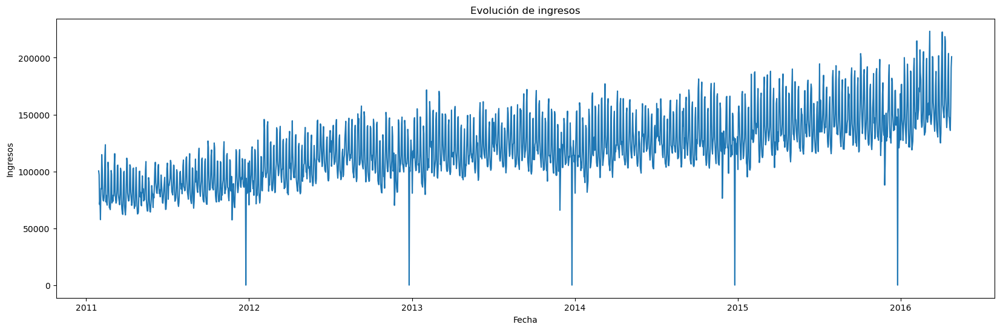

In [252]:
fig, ax = plt.subplots(figsize=(20, 6))

plt.plot(df_pred_plot['date'], df_pred_plot['income'])

plt.title("Evolución de ingresos")
plt.xlabel("Fecha")
plt.ylabel("Ingresos")

plt.show()


In [270]:
#px.line(df_pred_plot,x="date",y="income")

Descomponemos la serie

In [26]:
result = seasonal_decompose(df_pred_plot['income'], model="aditive", period=365)
result

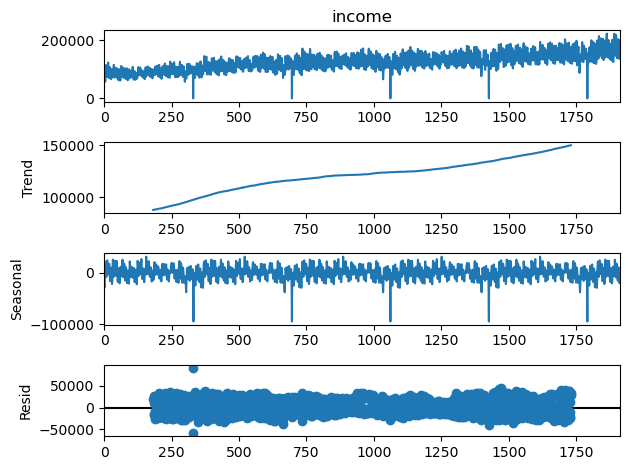

In [27]:
result.plot()
pyplot.show() #Podemos ver una ligera tendencia al alza

Metricas

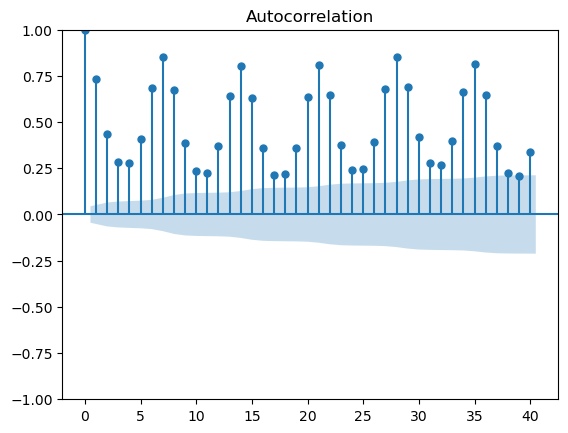

In [28]:
plot_acf(df_pred_plot['income'], lags = 40)
plt.show() #se ve claramente que existe estacionalidad semanal. Cada siete días se repite el ciclo

In [29]:
result = adfuller(df_pred_plot['income'])	
print('p-value: %f' % result[1])

p-value: 0.832203


Con esto tenemos que la serie no es estacionaria. Se puede apreciar claramente en las gráficas anteriores que existe tendencia

Categoria y el target para el LAG

In [135]:
cat=['category', 'department', 'store', 'region']
tg='income'

In [136]:
#Funcion para añadir el LAG, no de la linea anterior, sino del dato anterior del mismo grupo

def lag(dat_f,dias=1):
    if dias == 7:
        dat_f['lag_7'] = dat_f.groupby(cat)[tg].shift(7)
        dat_f['lag_8'] = dat_f.groupby(cat)[tg].shift(8)
        dat_f['lag_9'] = dat_f.groupby(cat)[tg].shift(9)
        dat_f['lag_10'] = dat_f.groupby(cat)[tg].shift(10)
        dat_f['lag_11'] = dat_f.groupby(cat)[tg].shift(11)
        dat_f['lag_12'] = dat_f.groupby(cat)[tg].shift(12)
        dat_f['lag_13'] = dat_f.groupby(cat)[tg].shift(13)
        dat_f['lag_14'] = dat_f.groupby(cat)[tg].shift(14)
        dat_f['lag_21'] = dat_f.groupby(cat)[tg].shift(21)
        dat_f['lag_22'] = dat_f.groupby(cat)[tg].shift(22)
        dat_f['lag_23'] = dat_f.groupby(cat)[tg].shift(23)
        dat_f['lag_24'] = dat_f.groupby(cat)[tg].shift(24)
        dat_f['lag_25'] = dat_f.groupby(cat)[tg].shift(25)
        dat_f['lag_26'] = dat_f.groupby(cat)[tg].shift(26)
        dat_f['lag_27'] = dat_f.groupby(cat)[tg].shift(27)
        dat_f['lag_28'] = dat_f.groupby(cat)[tg].shift(28)
        dat_f['lag_180'] = dat_f.groupby(cat)[tg].shift(180)
        dat_f['lag_360'] = dat_f.groupby(cat)[tg].shift(360)
        return dat_f
        dat_f=[]
    else:   
        dat_f['lag_1'] = dat_f.groupby(cat)[tg].shift(1)
        dat_f['lag_2'] = dat_f.groupby(cat)[tg].shift(2)
        dat_f['lag_3'] = dat_f.groupby(cat)[tg].shift(3)
        dat_f['lag_4'] = dat_f.groupby(cat)[tg].shift(4)
        dat_f['lag_5'] = dat_f.groupby(cat)[tg].shift(5)
        dat_f['lag_6'] = dat_f.groupby(cat)[tg].shift(6)
        dat_f['lag_7'] = dat_f.groupby(cat)[tg].shift(7)
        dat_f['lag_28'] = dat_f.groupby(cat)[tg].shift(28)
        dat_f['lag_180'] = dat_f.groupby(cat)[tg].shift(180)
        dat_f['lag_360'] = dat_f.groupby(cat)[tg].shift(360)
        return dat_f
        dat_f=[]

In [137]:
#llamar la funcion del lag
df_pred_ten = lag(df_pred)

In [138]:
df_pred_ten.query("category == 'ACCESORIES' and department == 'ACCESORIES_1' and store == 'Greenwich_Village' and region == 'New York'")[:10]


,date,yearweek_iso,weekday_int,event,christmas,category,department,store,region,year,...,lag_28,lag_180,lag_360,type,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6
0,2011-01-29,201104,1,0,0,ACCESORIES,ACCESORIES_1,Greenwich_Village,New York,2011,...,NaN,NaN,NaN,train,NaN,NaN,NaN,NaN,NaN,NaN
70,2011-01-30,201104,2,0,0,ACCESORIES,ACCESORIES_1,Greenwich_Village,New York,2011,...,NaN,NaN,NaN,train,1698.219971,NaN,NaN,NaN,NaN,NaN
140,2011-01-31,201105,3,0,0,ACCESORIES,ACCESORIES_1,Greenwich_Village,New York,2011,...,NaN,NaN,NaN,train,1162.969971,1698.219971,NaN,NaN,NaN,NaN
210,2011-02-01,201105,4,0,0,ACCESORIES,ACCESORIES_1,Greenwich_Village,New York,2011,...,NaN,NaN,NaN,train,1220.699951,1162.969971,1698.219971,NaN,NaN,NaN
280,2011-02-02,201105,5,0,0,ACCESORIES,ACCESORIES_1,Greenwich_Village,New York,2011,...,NaN,NaN,NaN,train,1012.369995,1220.699951,1162.969971,1698.219971,NaN,NaN
350,2011-02-03,201105,6,0,0,ACCESORIES,ACCESORIES_1,Greenwich_Village,New York,2011,...,NaN,NaN,NaN,train,884.559998,1012.369995,1220.699951,1162.969971,1698.219971,NaN
420,2011-02-04,201105,7,0,0,ACCESORIES,ACCESORIES_1,Greenwich_Village,New York,2011,...,NaN,NaN,NaN,train,1280.750000,884.559998,1012.369995,1220.699951,1162.969971,1698.219971
490,2011-02-05,201105,1,0,0,ACCESORIES,ACCESORIES_1,Greenwich_Village,New York,2011,...,NaN,NaN,NaN,train,1205.939941,1280.750000,884.559998,1012.369995,1220.699951,1162.969971
560,2011-02-06,201105,2,1,0,ACCESORIES,ACCESORIES_1,Greenwich_Village,New York,2011,...,NaN,NaN,NaN,train,2192.270020,1205.939941,1280.750000,884.559998,1012.369995,1220.699951
630,2011-02-07,201106,3,0,0,ACCESORIES,ACCESORIES_1,Greenwich_Village,New York,2011,...,NaN,NaN,NaN,train,1385.300049,2192.270020,1205.939941,1280.750000,884.559998,1012.369995


In [139]:
df_pred_ten.columns

Index(['date', 'yearweek_iso', 'weekday_int', 'event', 'christmas', 'category',
       'department', 'store', 'region', 'year', 'month', 'income',
       'quantities', 'lag_7', 'lag_28', 'lag_180', 'lag_360', 'type', 'lag_1',
       'lag_2', 'lag_3', 'lag_4', 'lag_5', 'lag_6'],
      dtype='object')

In [140]:
#Division del data Frame
columns_X_b = ['date', 'weekday_int', 'event', 'category',
       'department', 'store', 'region', 'year', 'month','christmas', 
      'lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5', 'lag_6',
       'lag_7', 'lag_28', 'lag_180', 'lag_360']
columns_y_b = 'income'


years_train_b = np.arange(2011,2016)
years_test_b = [2016]


df_pred_ten['type'] = 'No'
df_pred_ten.loc[df_pred_ten.year.isin(years_train_b), 'type'] = 'train'
df_pred_ten.loc[df_pred_ten.year.isin(years_test_b), 'type'] = 'test'


train_X_b = df_pred_ten[df_pred_ten.year.isin(years_train_b)][columns_X_b]
train_y_b = df_pred_ten[df_pred_ten.year.isin(years_train_b)][columns_y_b]
test_X_b = df_pred_ten[df_pred_ten.year.isin(years_test_b) ][columns_X_b]
test_y_b = df_pred_ten[df_pred_ten.year.isin(years_test_b) ][columns_y_b]

In [141]:
df_pred_ten.columns

Index(['date', 'yearweek_iso', 'weekday_int', 'event', 'christmas', 'category',
       'department', 'store', 'region', 'year', 'month', 'income',
       'quantities', 'lag_7', 'lag_28', 'lag_180', 'lag_360', 'type', 'lag_1',
       'lag_2', 'lag_3', 'lag_4', 'lag_5', 'lag_6'],
      dtype='object')

In [142]:
cat_features = ['weekday_int','event','christmas','category','department','store','region',"year","month"] 

In [143]:
from catboost import CatBoostRegressor
modelo_venta = CatBoostRegressor(iterations=100,
                          learning_rate=0.1,
                          #subsample=1,
                          depth=5, eval_metric="MAPE")

In [144]:
modelo_venta.fit(train_X_b, train_y_b, cat_features=cat_features, eval_set= [(train_X_b,train_y_b),(test_X_b,test_y_b)],verbose = False )
# Get predictions
preds_venta = modelo_venta.predict(test_X_b)
df_pred_ten['y_predict'] = np.concatenate([modelo_venta.predict(train_X_b), modelo_venta.predict(test_X_b)])

In [145]:
df_pred_ten

,date,yearweek_iso,weekday_int,event,christmas,category,department,store,region,year,...,lag_180,lag_360,type,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,y_predict
0,2011-01-29,201104,1,0,0,ACCESORIES,ACCESORIES_1,Greenwich_Village,New York,2011,...,NaN,NaN,train,NaN,NaN,NaN,NaN,NaN,NaN,1081.040627
1,2011-01-29,201104,1,0,0,ACCESORIES,ACCESORIES_1,Harlem,New York,2011,...,NaN,NaN,train,NaN,NaN,NaN,NaN,NaN,NaN,1081.040627
2,2011-01-29,201104,1,0,0,ACCESORIES,ACCESORIES_1,Tribeca,New York,2011,...,NaN,NaN,train,NaN,NaN,NaN,NaN,NaN,NaN,1081.040627
3,2011-01-29,201104,1,0,0,ACCESORIES,ACCESORIES_1,Brooklyn,New York,2011,...,NaN,NaN,train,NaN,NaN,NaN,NaN,NaN,NaN,1081.040627
4,2011-01-29,201104,1,0,0,ACCESORIES,ACCESORIES_1,South_End,Boston,2011,...,NaN,NaN,train,NaN,NaN,NaN,NaN,NaN,NaN,1081.040627
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
133905,2016-04-24,201616,2,0,0,SUPERMARKET,SUPERMARKET_3,Roxbury,Boston,2016,...,3893.679932,4262.379883,test,6388.419922,5398.339844,4579.240234,4578.310059,5328.600098,4739.500000,7191.301807
133906,2016-04-24,201616,2,0,0,SUPERMARKET,SUPERMARKET_3,Back_Bay,Boston,2016,...,3673.120117,4400.040039,test,5212.080078,4699.180176,4077.360107,4400.240234,4955.859863,4617.399902,5487.412502
133907,2016-04-24,201616,2,0,0,SUPERMARKET,SUPERMARKET_3,Midtown_Village,Philadelphia,2016,...,3698.540039,3549.169922,test,6083.580078,5338.390137,4430.990234,4424.029785,3836.959961,4174.540039,5438.051910
133908,2016-04-24,201616,2,0,0,SUPERMARKET,SUPERMARKET_3,Yorktown,Philadelphia,2016,...,3886.820068,3664.080078,test,6435.520020,5580.620117,5305.419922,5029.899902,5231.100098,5237.080078,6324.863588


In [146]:
df_pred_ten_1= df_pred_ten.groupby(['date','type'])[['income','y_predict']].sum().reset_index()

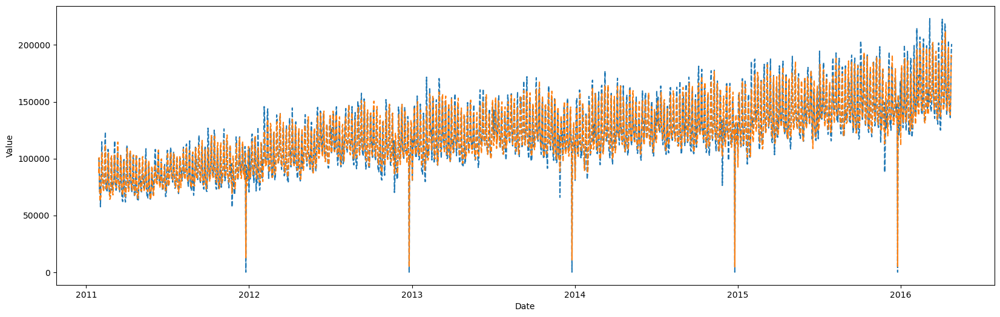

In [253]:
fig, ax = plt.subplots(figsize=(20, 6))

plt.plot(df_pred_ten_1['date'], df_pred_ten_1['income'], linestyle='--', label='Income')
plt.plot(df_pred_ten_1['date'], df_pred_ten_1['y_predict'], linestyle='--', label='Y Predict')

plt.xlabel("Date")
plt.ylabel("Value")


plt.show()


In [282]:
#px.line(df_pred_ten_1, x = 'date', y = [ 'income', 'y_predict'],line_dash = 'type')

In [148]:
#Funcion Error
def error(real,pred,nombre):
    print(nombre)
    print('MAE:',round(mean_absolute_error(real,pred),4))
    print('MSE:',round(mean_squared_error(real,pred),4)) 
    print('MSE_sqrt:',round(sqrt(mean_squared_error(real,pred)),4))
    print('RSCORE:',round(r2_score(real,pred),4)) 
    print('MAPE:',round(mean_absolute_percentage_error(real,pred),4),'\n') 

In [149]:
error(df_pred_ten_1['income'][1:][df_pred_ten_1[1:]['type'] == 'train'],df_pred_ten_1['y_predict'][1:][df_pred_ten_1[1:]['type'] == 'train'],'Boosting train')
error(df_pred_ten_1['income'][1:][df_pred_ten_1[1:]['type'] == 'test'],df_pred_ten_1['y_predict'][1:][df_pred_ten_1[1:]['type'] == 'test'],'Boosting test')


Boosting train
MAE: 6173.0764
MSE: 70449352.1595
MSE_sqrt: 8393.4112
RSCORE: 0.909
MAPE: 0.6663 

Boosting test
MAE: 8393.8242
MSE: 111725489.2158
MSE_sqrt: 10570.0279
RSCORE: 0.8444
MAPE: 0.0524 



In [150]:
df_eval_results=pd.DataFrame(modelo_venta.evals_result_)
df_eval_results.head(2)

,learn,validation_0,validation_1
MAPE,"[10.010702082599574, 9.407629400267776, 8.9230...","[10.010702082599586, 9.4076294002678, 8.923010...","[3.104058593927632, 2.8123354927001016, 2.5690..."
RMSE,"[1496.8548075919582, 1368.8927679246872, 1256....","[1496.8548075919573, 1368.8927679246856, 1256....","[1869.2168480854962, 1713.6433853183676, 1577...."


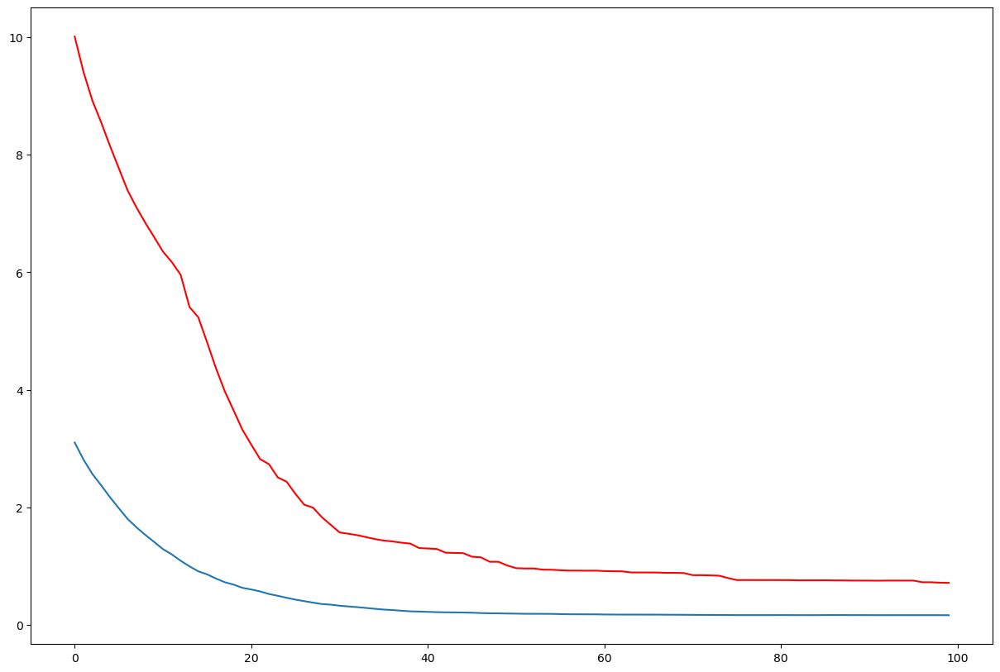

In [151]:
plt.figure(figsize=(15,10))
plt.plot(np.arange(0,100), df_eval_results["validation_0"]["MAPE"], color="r")
plt.plot(np.arange(0,100), df_eval_results["validation_1"]["MAPE"])

Como se aprecia una leve tendencia creciente, podemos probar con una diferenciación. Esto, hipotéticamente, debería mejorar más nuestros resultados.

In [152]:
df_pred_ten_dif=df_pred_ten.copy()

In [153]:
df_pred_ten_dif.drop(columns="y_predict",inplace=True)
df_pred_ten_dif.head()

,date,yearweek_iso,weekday_int,event,christmas,category,department,store,region,year,...,lag_28,lag_180,lag_360,type,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6
0,2011-01-29,201104,1,0,0,ACCESORIES,ACCESORIES_1,Greenwich_Village,New York,2011,...,NaN,NaN,NaN,train,NaN,NaN,NaN,NaN,NaN,NaN
1,2011-01-29,201104,1,0,0,ACCESORIES,ACCESORIES_1,Harlem,New York,2011,...,NaN,NaN,NaN,train,NaN,NaN,NaN,NaN,NaN,NaN
2,2011-01-29,201104,1,0,0,ACCESORIES,ACCESORIES_1,Tribeca,New York,2011,...,NaN,NaN,NaN,train,NaN,NaN,NaN,NaN,NaN,NaN
3,2011-01-29,201104,1,0,0,ACCESORIES,ACCESORIES_1,Brooklyn,New York,2011,...,NaN,NaN,NaN,train,NaN,NaN,NaN,NaN,NaN,NaN
4,2011-01-29,201104,1,0,0,ACCESORIES,ACCESORIES_1,South_End,Boston,2011,...,NaN,NaN,NaN,train,NaN,NaN,NaN,NaN,NaN,NaN


In [154]:
df_pred_ten_dif["income_dif"] = (df_pred_ten_dif["income"]-df_pred_ten_dif["lag_1"])

In [155]:
df_pred_ten_dif['lag_1_dif'] = df_pred_ten_dif.groupby(cat)["income_dif"].shift(1)
df_pred_ten_dif['lag_2_dif'] = df_pred_ten_dif.groupby(cat)["income_dif"].shift(2)
df_pred_ten_dif['lag_3_dif'] = df_pred_ten_dif.groupby(cat)["income_dif"].shift(3)
df_pred_ten_dif['lag_4_dif'] = df_pred_ten_dif.groupby(cat)["income_dif"].shift(4)
df_pred_ten_dif['lag_5_dif'] = df_pred_ten_dif.groupby(cat)["income_dif"].shift(5)
df_pred_ten_dif['lag_6_dif'] = df_pred_ten_dif.groupby(cat)["income_dif"].shift(6)
df_pred_ten_dif['lag_7_dif'] = df_pred_ten_dif.groupby(cat)["income_dif"].shift(7)
df_pred_ten_dif['lag_28_dif'] = df_pred_ten_dif.groupby(cat)["income_dif"].shift(28)
df_pred_ten_dif['lag_180_dif'] = df_pred_ten_dif.groupby(cat)["income_dif"].shift(180)
df_pred_ten_dif['lag_360_dif'] = df_pred_ten_dif.groupby(cat)["income_dif"].shift(360)

columns_X = ['date','yearweek_iso', 'weekday_int', 'event', 'christmas','category',
       'department', 'store', 'region', 'year', 'month', 
        'lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5', 'lag_6',
       'lag_7', 'lag_28', 'lag_180', 'lag_360','lag_1_dif','lag_2_dif','lag_3_dif','lag_4_dif','lag_5_dif','lag_6_dif','lag_7_dif','lag_28_dif','lag_180_dif','lag_360_dif']
columns_y = 'income_dif'

years_train =np.arange(2011,2016)
years_test = [2016]



In [156]:
df_pred_ten_dif.query("category == 'ACCESORIES' and department == 'ACCESORIES_1' and store == 'Greenwich_Village' and region == 'New York'")[:10][["income","lag_1","income_dif","lag_1_dif"]]


,income,lag_1,income_dif,lag_1_dif
0,1698.219971,NaN,NaN,NaN
70,1162.969971,1698.219971,-535.250000,NaN
140,1220.699951,1162.969971,57.729980,-535.250000
210,1012.369995,1220.699951,-208.329956,57.729980
280,884.559998,1012.369995,-127.809998,-208.329956
350,1280.750000,884.559998,396.190002,-127.809998
420,1205.939941,1280.750000,-74.810059,396.190002
490,2192.270020,1205.939941,986.330078,-74.810059
560,1385.300049,2192.270020,-806.969971,986.330078
630,978.000000,1385.300049,-407.300049,-806.969971


In [157]:
train_X = df_pred_ten_dif[(df_pred_ten_dif.year.isin(years_train)) & (~df_pred_ten_dif[columns_y].isna())][columns_X]
train_y = df_pred_ten_dif[(df_pred_ten_dif.year.isin(years_train)) & (~df_pred_ten_dif[columns_y].isna())][columns_y]
test_X = df_pred_ten_dif[df_pred_ten_dif.year.isin(years_test)][columns_X]
test_y = df_pred_ten_dif[df_pred_ten_dif.year.isin(years_test) ][columns_y]

In [158]:
df_pred_ten_dif.shape

(133910, 35)

In [159]:
ventas_dif = CatBoostRegressor(iterations=100,
                          learning_rate=0.1,
                          depth=5,
                          eval_metric="MAPE"
                          )


# Fit model
ventas_dif.fit(train_X, train_y,cat_features=cat_features,eval_set= [(train_X,train_y),(test_X,test_y)],verbose = False )
# Get predictions
preds = ventas_dif.predict(test_X)



In [160]:
df_pred_ten_dif.loc[70:,'y_predict_dif'] = np.concatenate([ventas_dif.predict(train_X), ventas_dif.predict(test_X)])

In [161]:
df_pred_ten_dif[["income_dif","y_predict_dif"]][69:]

,income_dif,y_predict_dif
69,NaN,NaN
70,-535.250000,-17.546622
71,-164.959961,-17.546622
72,-173.229980,-17.546622
73,-164.309998,-17.546622
...,...,...
133905,-374.910156,-64.764285
133906,-79.990234,-11.414888
133907,422.169922,-64.764285
133908,-222.580078,-11.414888


In [162]:
df_pred_ten_dif["y_pred_total"]=df_pred_ten_dif["y_predict_dif"]+df_pred_ten_dif["lag_1"]

In [163]:
df_pred_ten_dif[["date","income","y_pred_total"]][68:200]

,date,income,y_pred_total
68,2011-01-29,2316.550049,NaN
69,2011-01-29,4324.200195,NaN
70,2011-01-30,1162.969971,1680.673349
71,2011-01-30,1163.430054,1310.843393
72,2011-01-30,1415.709961,1571.393320
...,...,...,...
195,2011-01-31,1289.900024,2044.413339
196,2011-01-31,1286.119995,1599.713388
197,2011-01-31,206.330002,208.483377
198,2011-01-31,769.750000,436.403391


In [164]:
df_pred_ten_2= df_pred_ten_dif.groupby(['date','type'])[['income','y_pred_total']].sum().reset_index()

In [165]:
df_pred_ten_2

,date,type,income,y_pred_total
0,2011-01-29,train,100444.453125,0.000000
1,2011-01-30,train,97073.546875,99095.985734
2,2011-01-31,train,70924.500000,95725.084569
3,2011-02-01,train,74568.210938,69696.236425
4,2011-02-02,train,57583.230469,73299.879474
...,...,...,...,...
1908,2016-04-20,test,139043.593750,146703.750191
1909,2016-04-21,test,136022.843750,139123.364480
1910,2016-04-22,test,156581.765625,137943.331015
1911,2016-04-23,test,191485.203125,158042.968476


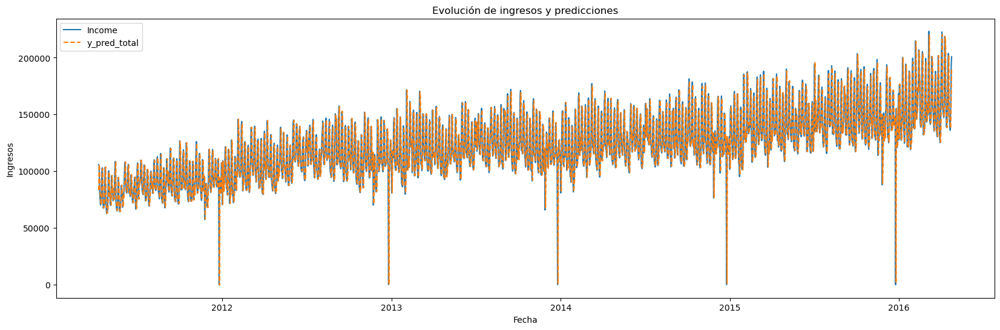

In [256]:
fig, ax = plt.subplots(figsize=(20, 6))

df_pred_filtered = df_pred_ten_2[70:]

plt.plot(df_pred_filtered['date'], df_pred_filtered['income'], label='Income')
plt.plot(df_pred_filtered['date'], df_pred_filtered['y_pred_total'], label='y_pred_total', linestyle='dashed')

plt.title("Evolución de ingresos y predicciones")
plt.xlabel("Fecha")
plt.ylabel("Ingresos")
plt.legend()

plt.show()


In [273]:
#px.line(df_pred_ten_2[70:], x = 'date', y = [ 'income', 'y_pred_total'], line_dash = 'type')

In [167]:
df_pred_ten_dif.query("category == 'ACCESORIES' and department == 'ACCESORIES_1' and store == 'Greenwich_Village' and region == 'New York'")[:70][["income","y_pred_total"]]

,income,y_pred_total
0,1698.219971,NaN
70,1162.969971,1680.673349
140,1220.699951,1145.423349
210,1012.369995,1203.153330
280,884.559998,994.823373
...,...,...
4550,1406.479980,2149.349520
4620,1240.729980,1408.679598
4690,1397.060059,1223.183359
4760,1667.310059,1399.259676


In [168]:
error(df_pred_ten_2['income'][70:][df_pred_ten_2[70:]['type'] == 'train'],df_pred_ten_2['y_pred_total'][70:][df_pred_ten_2[70:]['type'] == 'train'],'Boosting train')
error(df_pred_ten_2['income'][70:][df_pred_ten_2[70:]['type'] == 'test'],df_pred_ten_2['y_pred_total'][70:][df_pred_ten_2[70:]['type'] == 'test'],'Boosting test')

Boosting train
MAE: 14575.5569
MSE: 415202069.3169
MSE_sqrt: 20376.5078
RSCORE: 0.4431
MAPE: 8.307 

Boosting test
MAE: 19913.6909
MSE: 672300834.5208
MSE_sqrt: 25928.7646
RSCORE: 0.0635
MAPE: 0.1221 



In [169]:
df_eval_res_dif=pd.DataFrame(ventas_dif.evals_result_)
df_eval_res_dif

,learn,validation_0,validation_1
MAPE,"[1.0432093258888646, 1.0761400174758164, 1.112...","[1.043209325888863, 1.0761400174758164, 1.1127...","[1.0796990538699682, 1.1611867932366753, 1.214..."
RMSE,"[515.1311031446251, 502.3021873590083, 490.945...","[515.1311031446251, 502.30218735900746, 490.94...","[644.6427330411758, 627.4774021865277, 609.634..."


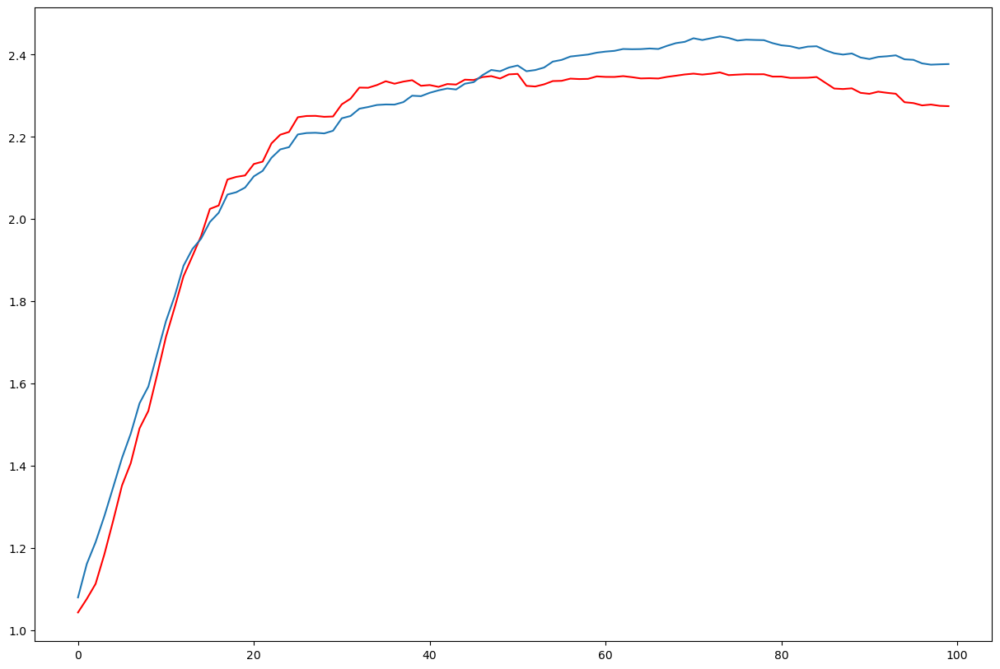

In [170]:
plt.figure(figsize=(15,10))
plt.plot(np.arange(0,100), df_eval_res_dif["validation_0"]["MAPE"], color="r")
plt.plot(np.arange(0,100), df_eval_res_dif["validation_1"]["MAPE"])

Los resultados no cumplen nuestra hipótesis inicial, las métricas de evaluación en líneas generales, no han mejorado..

Tunning de hiperparámetros.

In [218]:
ventas_h=CatBoostRegressor(verbose=False)
parameters={"depth": [4,6],
            "learning_rate": [0.01,0.05,0.2],
            "iterations": [200,100]
            }
grid=GridSearchCV(estimator=ventas_h, param_grid=parameters, cv=2, n_jobs=-1)
grid.fit(train_X_b,train_y_b,cat_features=cat_features)

print("best estimator:")
print(grid.best_estimator_)
print("best sccore:")
print(grid.best_score_)
print("best parameters:")
print(grid.best_params_)

best estimator:
best sccore:
0.9378672953634257
best parameters:
{'depth': 6, 'iterations': 200, 'learning_rate': 0.05}


In [172]:
ventas_f=CatBoostRegressor(depth= 6,
            learning_rate= 0.2,
            iterations= 200,
            eval_metric="MAPE"
)

ventas_f.fit(train_X_b,train_y_b, cat_features=cat_features,  eval_set= [(train_X_b,train_y_b),(test_X_b,test_y_b)],verbose = False )


In [173]:
df_pred_ten['y_predict'] = np.concatenate([ventas_f.predict(train_X_b), ventas_f.predict(test_X_b)])

In [174]:
df_pred_ten_3= df_pred_ten.groupby(['date','type'])[['income','y_predict']].sum().reset_index()

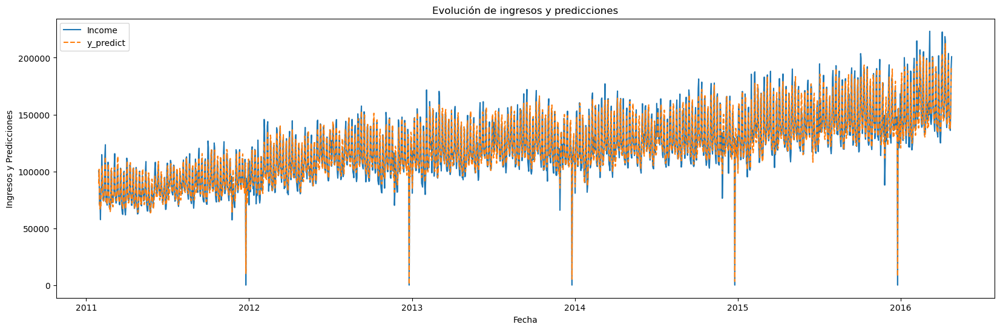

In [258]:
fig, ax = plt.subplots(figsize=(20, 6))

plt.plot(df_pred_ten_3['date'], df_pred_ten_3['income'], label='Income')
plt.plot(df_pred_ten_3['date'], df_pred_ten_3['y_predict'], label='y_predict', linestyle='dashed')

plt.title("Evolución de ingresos y predicciones")
plt.xlabel("Fecha")
plt.ylabel("Ingresos y Predicciones")
plt.legend()

plt.show()


In [275]:
#px.line(df_pred_ten_3,x="date",y=["income","y_predict"], line_dash="type")

In [176]:
error(df_pred_ten_3['income'][1:][df_pred_ten_3[1:]['type'] == 'train'],df_pred_ten_3['y_predict'][1:][df_pred_ten_3[1:]['type'] == 'train'],'Boosting train')
error(df_pred_ten_3['income'][1:][df_pred_ten_3[1:]['type'] == 'test'],df_pred_ten_3['y_predict'][1:][df_pred_ten_3[1:]['type'] == 'test'],'Boosting test')

Boosting train
MAE: 5824.77
MSE: 64079204.438
MSE_sqrt: 8004.9487
RSCORE: 0.9172
MAPE: 0.4946 

Boosting test
MAE: 7738.8581
MSE: 99287289.2634
MSE_sqrt: 9964.3007
RSCORE: 0.8617
MAPE: 0.0479 



In [177]:
df_eval_res_f=pd.DataFrame(ventas_f.evals_result_)
df_eval_res_f

,learn,validation_0,validation_1
MAPE,"[9.475459970689787, 8.405387778091045, 7.63430...","[9.475459970689778, 8.405387778091054, 7.63430...","[2.8477649630346913, 2.307602010779213, 1.9125..."
RMSE,"[1354.6379560389223, 1125.2953335900545, 944.5...","[1354.637956038923, 1125.2953335900545, 944.50...","[1692.2994907456023, 1410.5908017052652, 1191...."


In [178]:
import plotly.express as px

fig = px.line(x=np.arange(0,200), y=[df_eval_res_f["validation_0"]["MAPE"], df_eval_res_f["validation_1"]["MAPE"]], 
              labels={"x": "Iteraciones", "y":"MAPE"}, 
              color_discrete_sequence=['red', 'cyan']
              )

fig.show()

### Prediccion de ventas a una semana

In [179]:
df_pred_ten.drop(columns=["lag_1","lag_2","lag_3","lag_4","lag_5","lag_6","y_predict"], inplace=True)

In [180]:
df_pred_ten_weekly=df_pred_ten.copy()

In [181]:
df_pred_ten_weekly.columns

Index(['date', 'yearweek_iso', 'weekday_int', 'event', 'christmas', 'category',
       'department', 'store', 'region', 'year', 'month', 'income',
       'quantities', 'lag_7', 'lag_28', 'lag_180', 'lag_360', 'type'],
      dtype='object')

In [182]:
#Division del data Frame
columns_X_b = ['date', 'weekday_int', 'event','category',
       'department', 'store', 'region', 'year', 'month','christmas', 
      
       'lag_7', 'lag_28', 'lag_180', 'lag_360']
columns_y_b = 'income'


years_train_b = np.arange(2011,2016)
years_test_b = [2016]


df_pred_ten_weekly['type'] = 'No'
df_pred_ten_weekly.loc[df_pred_ten_weekly.year.isin(years_train_b), 'type'] = 'train'
df_pred_ten_weekly.loc[df_pred_ten_weekly.year.isin(years_test_b), 'type'] = 'test'


train_X_b = df_pred_ten_weekly[df_pred_ten_weekly.year.isin(years_train_b)][columns_X_b]
train_y_b = df_pred_ten_weekly[df_pred_ten_weekly.year.isin(years_train_b)][columns_y_b]
test_X_b = df_pred_ten_weekly[df_pred_ten_weekly.year.isin(years_test_b) ][columns_X_b]
test_y_b = df_pred_ten_weekly[df_pred_ten_weekly.year.isin(years_test_b) ][columns_y_b]

In [183]:
ventas_w=CatBoostRegressor(depth= 6,
            learning_rate= 0.2,
            iterations= 200,
            eval_metric="MAPE"
)

ventas_w.fit(train_X_b,train_y_b, cat_features=cat_features,  eval_set= [(train_X_b,train_y_b),(test_X_b,test_y_b)],verbose = False )

In [184]:
df_pred_ten_weekly['y_predict'] = np.concatenate([ventas_w.predict(train_X_b), ventas_w.predict(test_X_b)])

In [185]:
df_pred_ten_weekly= df_pred_ten_weekly.groupby(['date','type'])[['income','y_predict']].sum().reset_index()

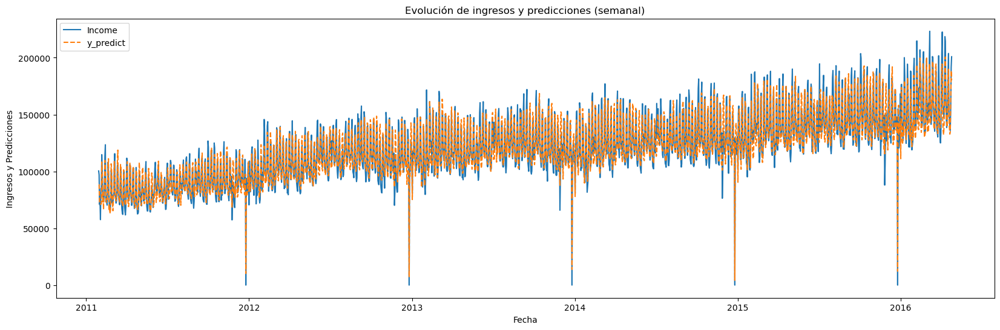

In [259]:
fig, ax = plt.subplots(figsize=(20, 6))

plt.plot(df_pred_ten_weekly['date'], df_pred_ten_weekly['income'], label='Income')
plt.plot(df_pred_ten_weekly['date'], df_pred_ten_weekly['y_predict'], label='y_predict', linestyle='dashed')

plt.title("Evolución de ingresos y predicciones (semanal)")
plt.xlabel("Fecha")
plt.ylabel("Ingresos y Predicciones")
plt.legend()


plt.show()


In [277]:
#px.line(df_pred_ten_weekly,x="date",y=["income","y_predict"], line_dash="type")

In [187]:
error(df_pred_ten_weekly['income'][1:][df_pred_ten_weekly[1:]['type'] == 'train'],df_pred_ten_weekly['y_predict'][1:][df_pred_ten_weekly[1:]['type'] == 'train'],'Boosting train')
error(df_pred_ten_weekly['income'][1:][df_pred_ten_weekly[1:]['type'] == 'test'],df_pred_ten_weekly['y_predict'][1:][df_pred_ten_weekly[1:]['type'] == 'test'],'Boosting test')

Boosting train
MAE: 7031.7777
MSE: 90201857.267
MSE_sqrt: 9497.4658
RSCORE: 0.8835
MAPE: 0.8131 

Boosting test
MAE: 9752.9644
MSE: 170442735.692
MSE_sqrt: 13055.3719
RSCORE: 0.7626
MAPE: 0.0593 



In [ ]:
#Dashboard prediccion ventas
df_dahsboard_pred=df_pred_ten_3[df_pred_ten_3['date']>='2014-01-27']
df_pred_ten_weekly=df_pred_ten_weekly[df_pred_ten_weekly['date']>='2014-01-27']
df_dahsboard_pred['prediccion_7dias']=df_pred_ten_weekly['y_predict']
df_dahsboard_pred = df_dahsboard_pred.rename(columns={'y_predict': 'prediccion_1dias'}) 

In [ ]:
# Obtener la primera hoja de cálculo
worksheet = sheet.get_worksheet(2)
#limpiar todas las celdas
worksheet.clear()
#pasar el dataframe al spreadsheet (recordad hacer el resetindex)
set_with_dataframe(worksheet, df_dahsboard_pred)

### Predicción de cantidades de los cinco productos que generan más ingresos de la tienda NYC_3

Volvemos a los productos más vendidos en los últimos 365 días y guardados anteriormente en la ny3

In [188]:
ny3.head(5)

,item,income,income_perc
0,SUPERMARKET_3_120,182889.218750,2.054034
1,ACCESORIES_1_354,77447.656250,2.923851
2,SUPERMARKET_3_090,64639.800781,3.649822
3,SUPERMARKET_3_586,54309.023438,4.259768
4,HOME_&_GARDEN_1_053,51328.386719,4.836238


Sobre esta tienda y estos artículos, haremos la predicción de cantidades.

#### Artículo con mayor VV de los últimos 365 días en NYC_3: SUPERMARKET_3_120

In [189]:
top_articulos=5 # si queremos otro que no sea el top 5
df_top_q = df[df['store_code'] == 'NYC_3']
df_top_q = df_top_q[df_top_q['item'].isin(ny3.head(top_articulos)['item'])]

In [190]:
#sustituir los None por 0
df_top_q['event'] = df_top_q['event'].replace('None', 0)
#sustituir el nombre de cada evento por 1
df_top_q['event'] = pd.Categorical(df_top_q['event'], categories=[0, 1])
df_top_q.loc[df_top_q['event'] != 0, 'event'] = 1

In [191]:
df_top_tv=df_top_q[["date","yearweek_iso","weekday_int","event","christmas","item",'department',"store_code","quantities","income","year","month"]]

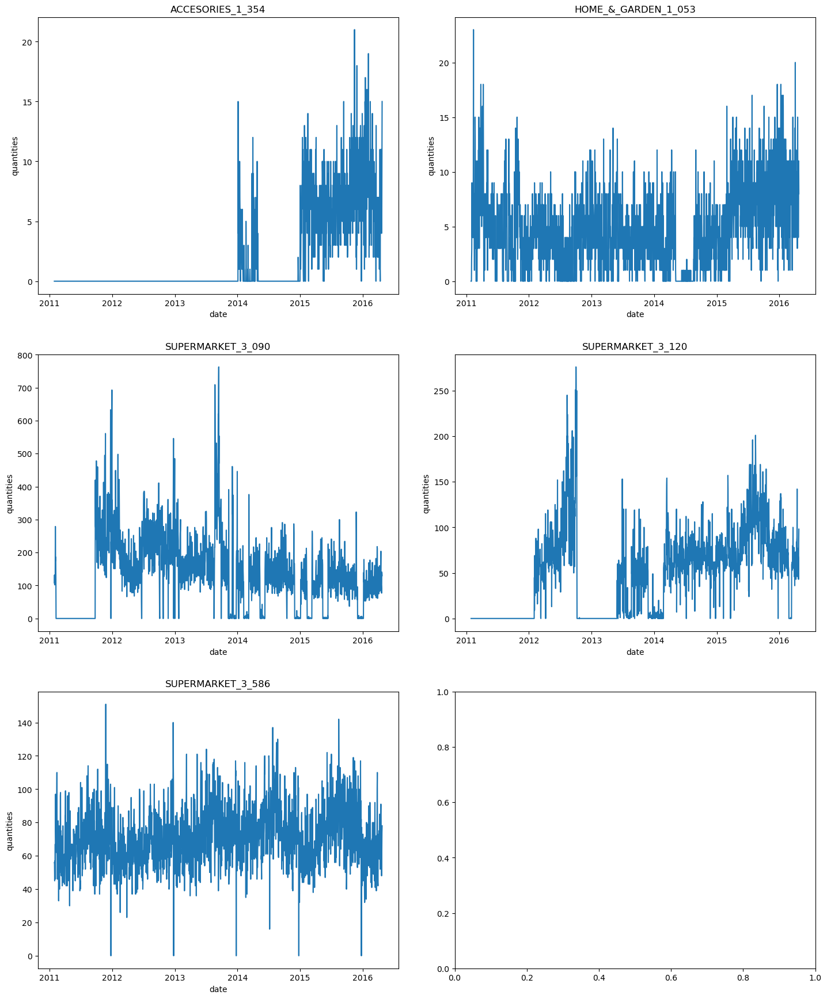

In [238]:
items = df_top_tv['item'].unique()


num_rows = (len(items) + 1) // 2
num_cols = 2


fig, axs = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, 6*num_rows))

for i, item in enumerate(items):
    row = i // num_cols    
    col = i % num_cols     
    ax = axs[row, col]
    df_item = df_top_tv[df_top_tv['item'] == item]
    ax.plot(df_item['date'], df_item['quantities'])
    ax.set_title(item)
    ax.set_xlabel('date')
    ax.set_ylabel('quantities')


fig.tight_layout(pad=3.0)
plt.show()

Vemos que la tienda tiene actividad desde la primera fecha de nuestra tabla, por tanto es muy probable que este producto se introdujera a partir de febrero de 2012. Por otra parte, se puede apreciar que las ventas han sido nulas desde el 8 de octubre de 2012 hasta el 29 de mayo de 2013 que puede ser debido a una ruptura de stock. Vamos a asumir que hemos hablado con la unidad de negocio y nos lo ha confirmado.

Articulo : ACCESORIES_1_354


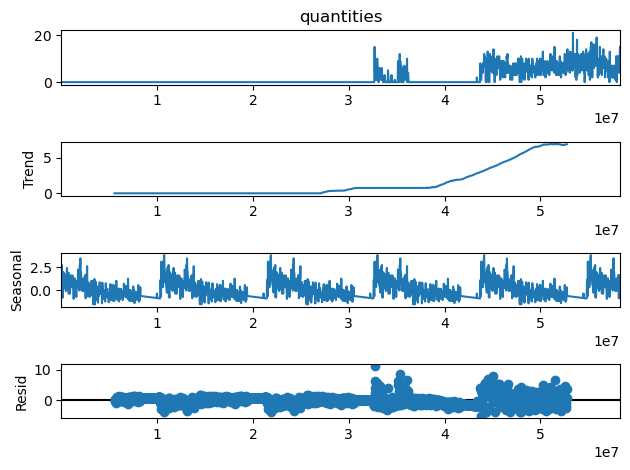

Articulo : HOME_&_GARDEN_1_053


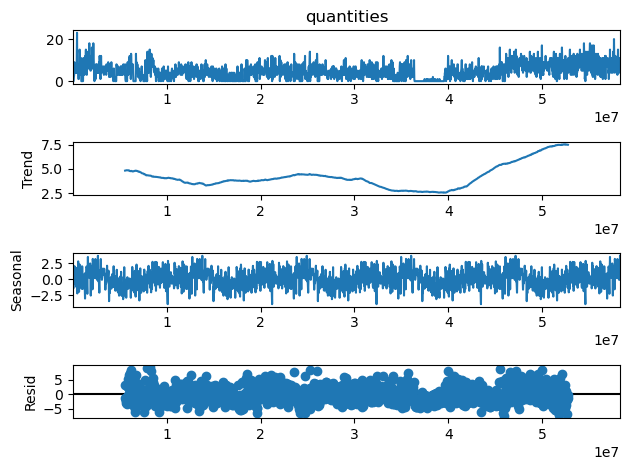

Articulo : SUPERMARKET_3_090


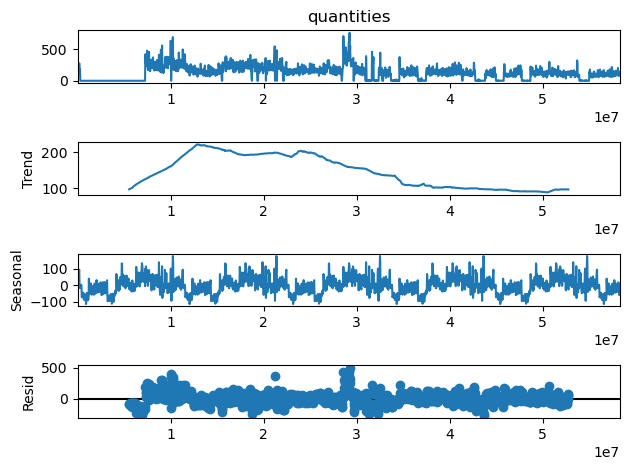

Articulo : SUPERMARKET_3_120


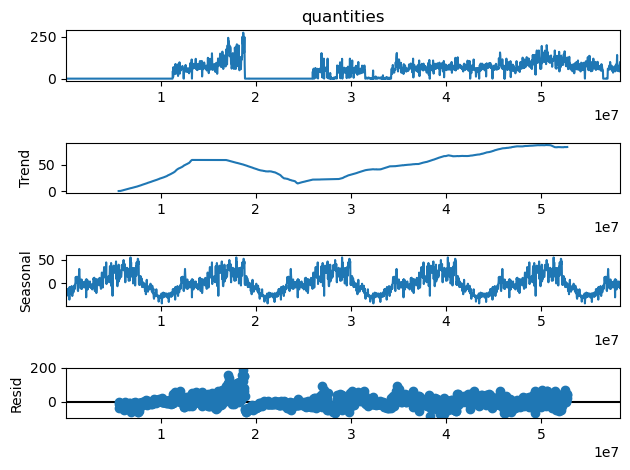

Articulo : SUPERMARKET_3_586


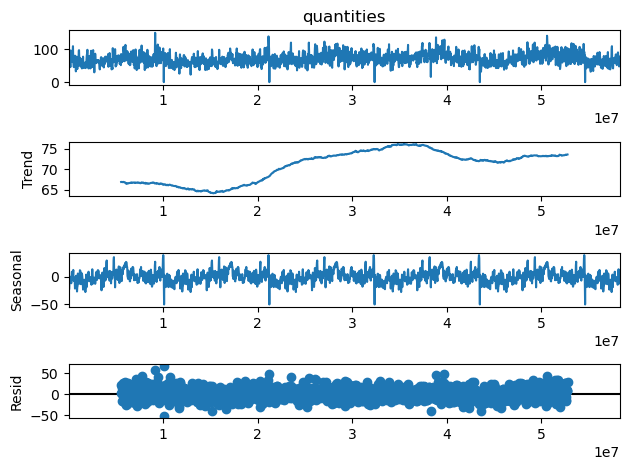

In [193]:
for i in df_top_tv['item'].unique():
    print(f'Articulo : {i}')
    result = seasonal_decompose(df_top_tv[df_top_tv['item']==i]['quantities'], model='additive', period=365)
    result.plot()
    #pyplot.title(i)
    pyplot.show() 

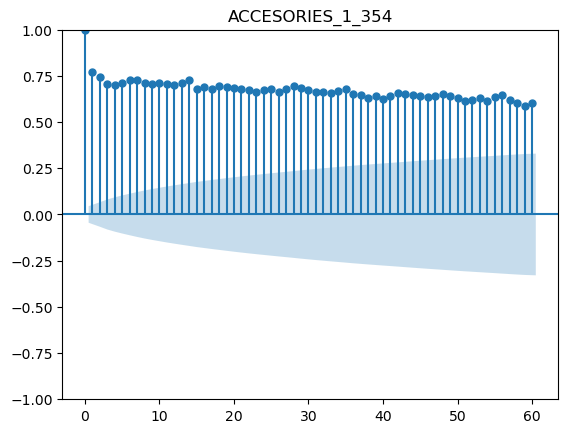

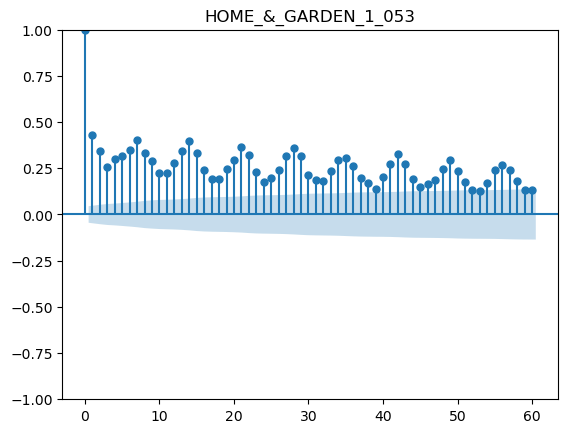

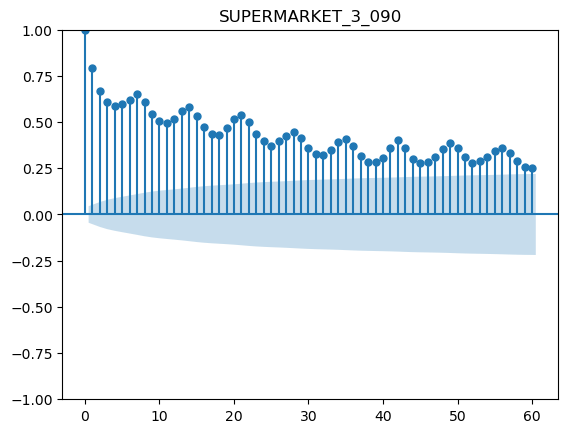

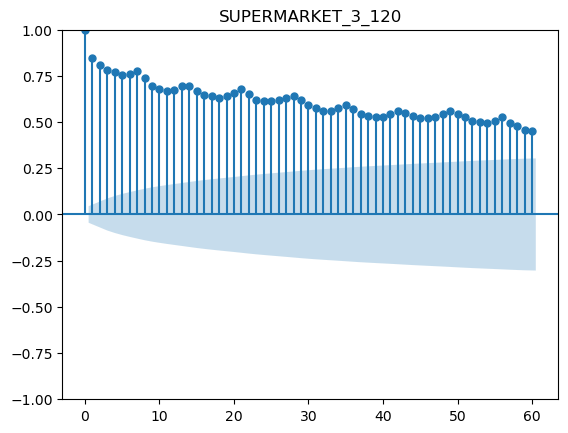

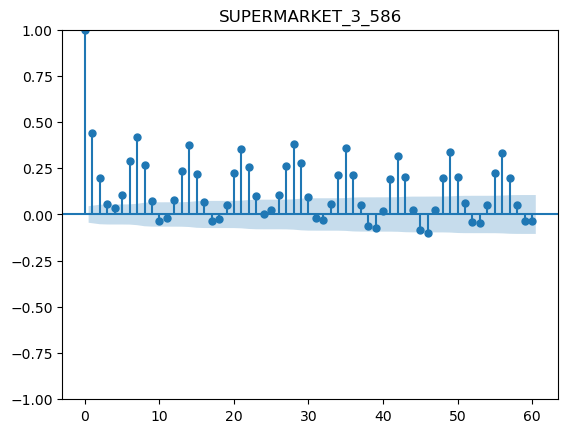

In [194]:
for i in df_top_tv['item'].unique():
    plot_acf(df_top_tv[df_top_tv['item']==i]['quantities'], lags = 60)
    plt.title(i)
    plt.show()

In [195]:
df_top_1dia=df_top_tv.copy()
df_top_7dia=df_top_tv.copy()

In [196]:
#LAG  --> aprovecho la funcion que ya existe
cat=['department','item']
tg='quantities'
df_top_1dia =lag(df_top_1dia)
df_top_7dia =lag(df_top_7dia,7)


In [197]:
df_top_1dia.columns , df_top_7dia.columns

(Index(['date', 'yearweek_iso', 'weekday_int', 'event', 'christmas', 'item',
        'department', 'store_code', 'quantities', 'income', 'year', 'month',
        'lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5', 'lag_6', 'lag_7', 'lag_28',
        'lag_180', 'lag_360'],
       dtype='object'),
 Index(['date', 'yearweek_iso', 'weekday_int', 'event', 'christmas', 'item',
        'department', 'store_code', 'quantities', 'income', 'year', 'month',
        'lag_7', 'lag_8', 'lag_9', 'lag_10', 'lag_11', 'lag_12', 'lag_13',
        'lag_14', 'lag_21', 'lag_22', 'lag_23', 'lag_24', 'lag_25', 'lag_26',
        'lag_27', 'lag_28', 'lag_180', 'lag_360'],
       dtype='object'))

### Predicción de cantidades del top 5 productos a un dia

In [198]:
#Division del data Frame para la prediccion de 1 dia
columns_X_1 = ['date', 'weekday_int', 'event', 'christmas',
        'store_code',  'year', 'month','item',
           'lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5', 'lag_6','lag_7', 'lag_28', 'lag_180', 'lag_360']
columns_y_1 = 'quantities'


years_train_1 = np.arange(2011,2016)
years_test_1 = [2016]


df_top_1dia['type'] = 'No'
df_top_1dia.loc[df_top_1dia.year.isin(years_train_1), 'type'] = 'train'
df_top_1dia.loc[df_top_1dia.year.isin(years_test_1), 'type'] = 'test'


train_X_1 = df_top_1dia[df_top_1dia.year.isin(years_train_1)][columns_X_1]
train_y_1 = df_top_1dia[df_top_1dia.year.isin(years_train_1)][columns_y_1]
test_X_1 = df_top_1dia[df_top_1dia.year.isin(years_test_1) ][columns_X_1]
test_y_1 = df_top_1dia[df_top_1dia.year.isin(years_test_1) ][columns_y_1]

In [199]:
cat_features_1 = ['weekday_int','event','christmas','store_code','year','month','item'] 

In [200]:
mhp=CatBoostRegressor(verbose=False) #4min
parameters={"depth": [4,6,8],
            "learning_rate": [0.01,0.05,0.1,0.2],
            "iterations": [300,100]
            }
grid=GridSearchCV(estimator=mhp, param_grid=parameters, cv=2, n_jobs=-1)
grid.fit(train_X_1,train_y_1,cat_features=cat_features_1)

print("best estimator:")
print(grid.best_estimator_)
print("best sccore:")
print(grid.best_score_)
print("best parameters:")
print(grid.best_params_)

top1dia= CatBoostRegressor(iterations=grid.best_params_['iterations'],
                          learning_rate=grid.best_params_['learning_rate'],
                          #subsample=1,
                          depth=grid.best_params_['depth'], eval_metric="MAPE")
top1dia.fit(train_X_1, train_y_1, cat_features=cat_features_1, eval_set= [(train_X_1,train_y_1),(test_X_1,test_y_1)],verbose = False )
# Get predictions
#preds1dia = top1dia.predict(test_X_1)
df_top_1dia['y_predict'] = np.concatenate([top1dia.predict(train_X_1), top1dia.predict(test_X_1)])

best estimator:
best sccore:
0.7755138325410145
best parameters:
{'depth': 4, 'iterations': 100, 'learning_rate': 0.05}


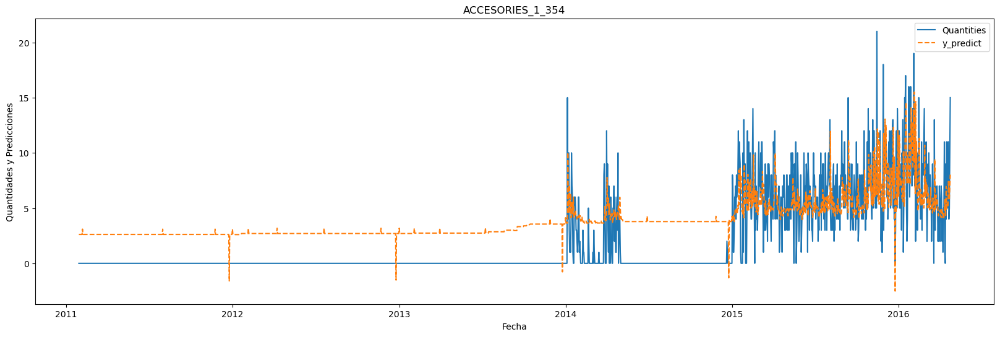

ACCESORIES_1_354 train
MAE: 2.9337
MSE: 9.9001
MSE_sqrt: 3.1464
RSCORE: -0.0532
MAPE: 1.0409819530179998e+16 

ACCESORIES_1_354 test
MAE: 3.307
MSE: 17.0212
MSE_sqrt: 4.1257
RSCORE: -0.0926
MAPE: 388597835190453.1 



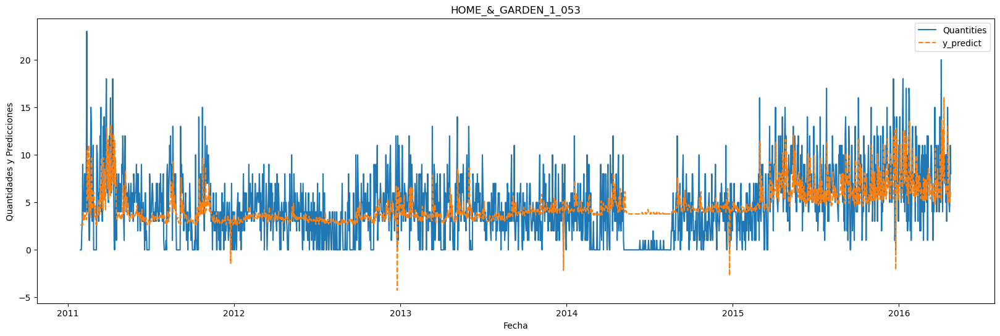

HOME_&_GARDEN_1_053 train
MAE: 2.5392
MSE: 10.3148
MSE_sqrt: 3.2117
RSCORE: 0.1093
MAPE: 2616850500257725.0 

HOME_&_GARDEN_1_053 test
MAE: 3.4542
MSE: 19.5515
MSE_sqrt: 4.4217
RSCORE: -0.3011
MAPE: 0.6937 



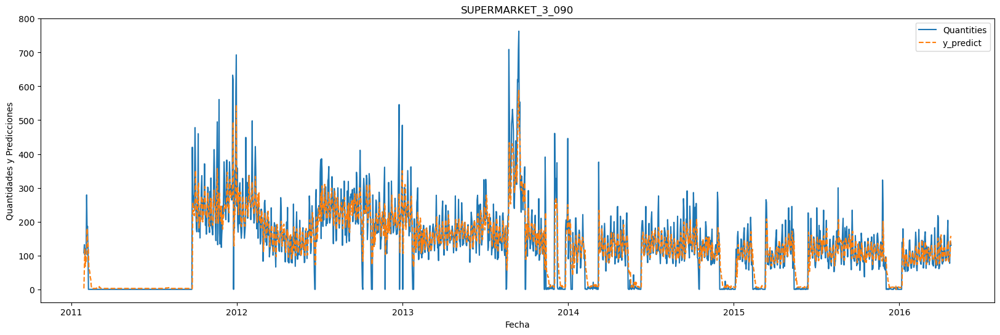

SUPERMARKET_3_090 train
MAE: 34.5018
MSE: 3056.717
MSE_sqrt: 55.2876
RSCORE: 0.7529
MAPE: 1.4923079152398114e+16 

SUPERMARKET_3_090 test
MAE: 24.5353
MSE: 1108.8534
MSE_sqrt: 33.2994
RSCORE: 0.3728
MAPE: 1069735975040808.5 



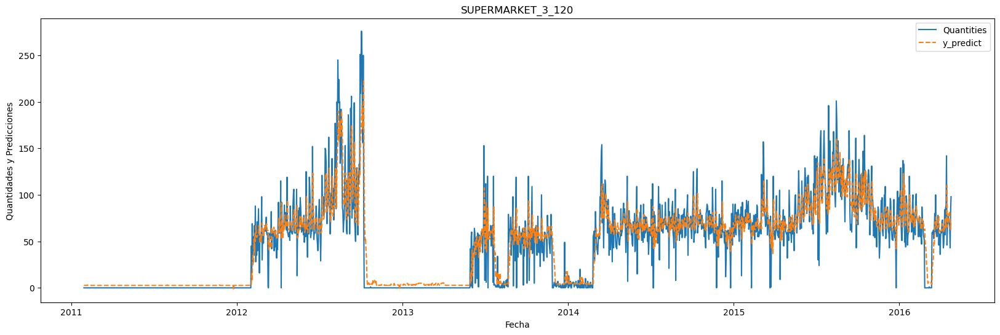

SUPERMARKET_3_120 train
MAE: 12.7432
MSE: 447.8627
MSE_sqrt: 21.1628
RSCORE: 0.7902
MAPE: 7963970289333867.0 

SUPERMARKET_3_120 test
MAE: 16.8689
MSE: 504.7578
MSE_sqrt: 22.4668
RSCORE: 0.4875
MAPE: 1.1702268269327284e+16 



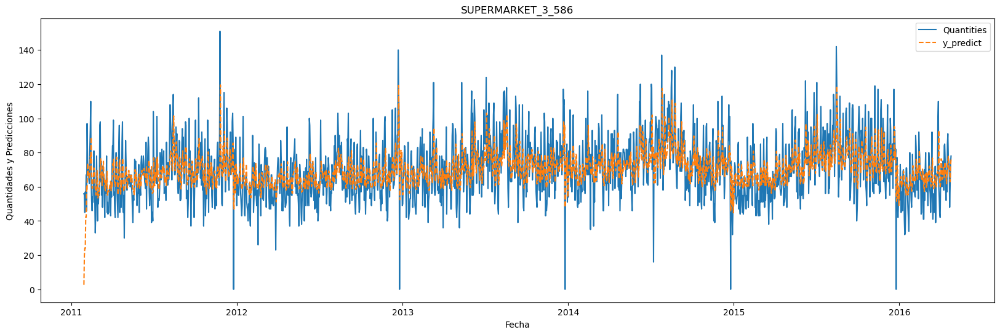

SUPERMARKET_3_586 train
MAE: 11.8365
MSE: 230.2011
MSE_sqrt: 15.1724
RSCORE: 0.2778
MAPE: 641221605534292.8 

SUPERMARKET_3_586 test
MAE: 10.5734
MSE: 179.9343
MSE_sqrt: 13.414
RSCORE: 0.1383
MAPE: 0.1918 



In [262]:
items = df_top_1dia['item'].unique()

for i in items:
    fig, ax = plt.subplots(figsize=(20, 6))
    df_item = df_top_1dia[df_top_1dia['item'] == i]
    
    plt.plot(df_item['date'], df_item['quantities'], label='Quantities')
    plt.plot(df_item['date'], df_item['y_predict'], label='y_predict', linestyle='dashed')
    
    plt.title(i)
    plt.xlabel("Fecha")
    plt.ylabel("Quantidades y Predicciones")
    plt.legend()
    
    plt.show()
    
    error(df_item[df_item['type'] == 'train']['quantities'][1:], df_item[df_item['type'] == 'train']['y_predict'][1:], f'{i} train')
    error(df_item[df_item['type'] == 'test']['quantities'][1:], df_item[df_item['type'] == 'test']['y_predict'][1:], f'{i} test')


In [280]:
#for i in df_top_1dia['item'].unique():

 #   fig=px.line(df_top_1dia[df_top_1dia['item']==i],x="date",y=["quantities","y_predict"],line_dash="type" ,title=i)
  #  fig.show()
   # error(df_top_1dia[df_top_1dia['item']==i]['quantities'][1:][df_top_1dia[df_top_1dia['item']==i][1:]['type'] == 'train'],df_top_1dia[df_top_1dia['item']==i]['y_predict'][1:][df_top_1dia[df_top_1dia['item']==i][1:]['type'] == 'train'],f'{i} train')
    #error(df_top_1dia[df_top_1dia['item']==i]['quantities'][1:][df_top_1dia[df_top_1dia['item']==i][1:]['type'] == 'test'],df_top_1dia[df_top_1dia['item']==i]['y_predict'][1:][df_top_1dia[df_top_1dia['item']==i][1:]['type'] == 'test'],f'{i} test')


In [202]:
df_eval_top1dia=pd.DataFrame(top1dia.evals_result_) #top
df_eval_top1dia=pd.DataFrame(top1dia.evals_result_)
df_eval_top1dia
fig = px.line(x=np.arange(0,100), y=[df_eval_top1dia["validation_0"]["MAPE"], df_eval_top1dia["validation_1"]["MAPE"]], 
              labels={"x": "Iteraciones", "y":"MAPE"}, 
              color_discrete_sequence=['red', 'cyan']
              )

fig.show()

### Predicción de cantidades del top 5 productos a siete dia

In [203]:
#Division del data Frame para la prediccion de 1 dia
columns_X_1 = ['date', 'weekday_int', 'event', 'christmas',
        'store_code',  'year', 'month','item',
        'lag_7','lag_8','lag_9','lag_10','lag_11','lag_12','lag_13', 'lag_14','lag_21','lag_22','lag_23','lag_24','lag_25','lag_26','lag_27','lag_28', 'lag_180', 'lag_360']
columns_y_1 = 'quantities'


years_train_1 = np.arange(2011,2016)
years_test_1 = [2016]


df_top_7dia['type'] = 'No'
df_top_7dia.loc[df_top_7dia.year.isin(years_train_1), 'type'] = 'train'
df_top_7dia.loc[df_top_7dia.year.isin(years_test_1), 'type'] = 'test'


train_X_1 = df_top_7dia[df_top_7dia.year.isin(years_train_1)][columns_X_1]
train_y_1 = df_top_7dia[df_top_7dia.year.isin(years_train_1)][columns_y_1]
test_X_1 = df_top_7dia[df_top_7dia.year.isin(years_test_1) ][columns_X_1]
test_y_1 = df_top_7dia[df_top_7dia.year.isin(years_test_1) ][columns_y_1]

In [204]:
mhp=CatBoostRegressor(verbose=False) #4min
parameters={"depth": [4,6,8],
            "learning_rate": [0.01,0.05,0.1,0.2],
            "iterations": [300,100]
            }
grid=GridSearchCV(estimator=mhp, param_grid=parameters, cv=2, n_jobs=-1)
grid.fit(train_X_1,train_y_1,cat_features=cat_features_1)

print("best estimator:")
print(grid.best_estimator_)
print("best sccore:")
print(grid.best_score_)
print("best parameters:")
print(grid.best_params_)

top7dia= CatBoostRegressor(iterations=grid.best_params_['iterations'],
                          learning_rate=grid.best_params_['learning_rate'],
                          #subsample=1,
                          depth=grid.best_params_['depth'], eval_metric="MAPE")
top7dia.fit(train_X_1, train_y_1, cat_features=cat_features_1, eval_set= [(train_X_1,train_y_1),(test_X_1,test_y_1)],verbose = False )
# Get predictions
#preds1dia = top7dia.predict(test_X_1)
df_top_7dia['y_predict'] = np.concatenate([top7dia.predict(train_X_1), top7dia.predict(test_X_1)])

best estimator:
best sccore:
0.6394720292969349
best parameters:
{'depth': 4, 'iterations': 100, 'learning_rate': 0.05}


In [243]:
for i in df_top_7dia['item'].unique():

    fig=px.line(df_top_7dia[df_top_7dia['item']==i],x="date",y=["quantities","y_predict"],line_dash="type" ,title=i)
    fig.show()
    error(df_top_7dia[df_top_7dia['item']==i]['quantities'][1:][df_top_7dia[df_top_7dia['item']==i][1:]['type'] == 'train'],df_top_7dia[df_top_7dia['item']==i]['y_predict'][1:][df_top_7dia[df_top_7dia['item']==i][1:]['type'] == 'train'],f'{i} train')
    error(df_top_7dia[df_top_7dia['item']==i]['quantities'][1:][df_top_7dia[df_top_7dia['item']==i][1:]['type'] == 'test'],df_top_7dia[df_top_7dia['item']==i]['y_predict'][1:][df_top_7dia[df_top_7dia['item']==i][1:]['type'] == 'test'],f'{i} test')


ACCESORIES_1_354 train
MAE: 3.7862
MSE: 16.4107
MSE_sqrt: 4.051
RSCORE: -0.7459
MAPE: 1.4432555763293734e+16 

ACCESORIES_1_354 test
MAE: 3.0637
MSE: 15.2793
MSE_sqrt: 3.9089
RSCORE: 0.0108
MAPE: 453696688492857.06 



HOME_&_GARDEN_1_053 train
MAE: 2.7522
MSE: 11.731
MSE_sqrt: 3.4251
RSCORE: -0.013
MAPE: 3387843557585733.0 

HOME_&_GARDEN_1_053 test
MAE: 3.1348
MSE: 15.6274
MSE_sqrt: 3.9532
RSCORE: -0.0432
MAPE: 0.6112 



SUPERMARKET_3_090 train
MAE: 45.4809
MSE: 5015.8022
MSE_sqrt: 70.8223
RSCORE: 0.5946
MAPE: 3.436780091969301e+16 

SUPERMARKET_3_090 test
MAE: 26.0694
MSE: 1354.5176
MSE_sqrt: 36.8038
RSCORE: 0.2648
MAPE: 6362381107410761.0 



SUPERMARKET_3_120 train
MAE: 15.8746
MSE: 649.9269
MSE_sqrt: 25.4937
RSCORE: 0.6955
MAPE: 1.4567200241869294e+16 

SUPERMARKET_3_120 test
MAE: 22.0495
MSE: 867.1161
MSE_sqrt: 29.4468
RSCORE: 0.1139
MAPE: 2.972936538064743e+16 



SUPERMARKET_3_586 train
MAE: 12.5437
MSE: 262.5052
MSE_sqrt: 16.202
RSCORE: 0.1765
MAPE: 770423147307737.1 

SUPERMARKET_3_586 test
MAE: 11.0298
MSE: 194.6594
MSE_sqrt: 13.952
RSCORE: 0.0639
MAPE: 0.2049 



In [206]:
df_eval_top7dia=pd.DataFrame(top7dia.evals_result_) #top
df_eval_top7dia=pd.DataFrame(top7dia.evals_result_)
df_eval_top7dia
fig = px.line(x=np.arange(0,100), y=[df_eval_top7dia["validation_0"]["MAPE"], df_eval_top1dia["validation_1"]["MAPE"]], 
              labels={"x": "Iteraciones", "y":"MAPE"}, 
              color_discrete_sequence=['red', 'cyan']
              )

fig.show()